# 00. Packages

In [721]:
import pandas as pd
import numpy as np
import seaborn as sns
import torch
from torch import nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
import matplotlib.pyplot as plt
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence, pad_packed_sequence

## 01. continous data 

In [722]:
data = pd.read_csv('Data_preimp.csv')
# get rid of col `week_id`
data = data.drop(columns=['week_id'])
print(data.head())

   subject   Mon   Tue   Wed  Thu   Fri   Sat   Sun  year  week_num cohort
0     3002   NaN   NaN   NaN  NaN   2.0   7.0   8.0  2019        11     PD
1     3002   5.0  10.0  16.0  2.0   NaN   NaN   NaN  2019        12     PD
2     3002   NaN   4.0   4.0  9.0   4.0   5.0   NaN  2019        17     PD
3     3002   NaN   7.0   3.0  7.0  11.0  11.0  13.0  2019        18     PD
4     3002  17.0  13.0   2.0  NaN   6.0   NaN   NaN  2019        19     PD


In [723]:
# only keep users with at least 26 weeks of data (6 months)
user_counts = data.groupby('subject').size()
user_counts = user_counts.sort_values(ascending=True)
data = data[data['subject'].isin(user_counts[user_counts >= 26].index)]

In [724]:
# how many unique subjects are in each cohort?
cohort_counts = data.groupby('cohort')['subject'].nunique()
print(cohort_counts)

# only keep PD and HC cohorts
data = data[data['cohort'].isin(['PD', 'Control'])]
cohort_counts = data.groupby('cohort')['subject'].nunique()
print(cohort_counts) # 136 subjects 

cohort
Control           27
Early Imaging      6
PD               109
Prodromal        121
SWEDD              2
Name: subject, dtype: int64
cohort
Control     27
PD         109
Name: subject, dtype: int64


In [725]:
# get continuous week numbers for each subject
for subject, subject_data in data.groupby('subject'):
    # Get the first year for this subject
    first_year = subject_data['year'].min()

    # Calculate the number of weeks since the first year 
    subject_weeks = (subject_data['year'] - first_year) * 52 + subject_data['week_num']

    # Update the dataframe with the new week numbers
    data.loc[subject_data.index, 'week_num'] = subject_weeks

    # Offset the week numbers to start from 1
    data.loc[subject_data.index, 'week_num'] -= subject_weeks.min() - 1

# get rid of col `year`
data = data.drop(columns=['year'])
print(data.head())

   subject   Mon   Tue   Wed  Thu   Fri   Sat   Sun  week_num cohort
0     3002   NaN   NaN   NaN  NaN   2.0   7.0   8.0         1     PD
1     3002   5.0  10.0  16.0  2.0   NaN   NaN   NaN         2     PD
2     3002   NaN   4.0   4.0  9.0   4.0   5.0   NaN         7     PD
3     3002   NaN   7.0   3.0  7.0  11.0  11.0  13.0         8     PD
4     3002  17.0  13.0   2.0  NaN   6.0   NaN   NaN         9     PD


In [726]:
def get_consecutive_weeks(subject_data):
    """
    Function to calculate the maximum number of consecutive weeks with non-NaN values for all days of the week
    for a given subject's data.
    Args:
        subject_data (pd.DataFrame): DataFrame containing the data for a single subject.
    Returns:
        int: Maximum number of consecutive weeks with non-NaN values for all days of the week.
    """

    # Create a mask for rows where all days are not NaN
    mask = subject_data[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].notna().all(axis=1)
    
    # Find the indices of the consecutive weeks
    consecutive_weeks = []
    current_streak = 0

    for i in range(len(mask)):
        if mask.iloc[i]:
            current_streak += 1
        else:
            if current_streak > 0:
                consecutive_weeks.append(current_streak)
            current_streak = 0

    if current_streak > 0:
        consecutive_weeks.append(current_streak)

    return max(consecutive_weeks) if consecutive_weeks else 0

# Apply the function to each subject's data
consecutive_weeks_per_subject = data.groupby('subject').apply(get_consecutive_weeks)
print(consecutive_weeks_per_subject)

subject
3002      3
3003     49
3004     84
3021     51
3023      6
         ..
73935     3
74034    26
74067    52
75421    62
75484     3
Length: 136, dtype: int64


C:\Users\Felice Dong\AppData\Local\Temp\ipykernel_13636\1935913881.py:24: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  consecutive_weeks_per_subject = data.groupby('subject').apply(get_consecutive_weeks)


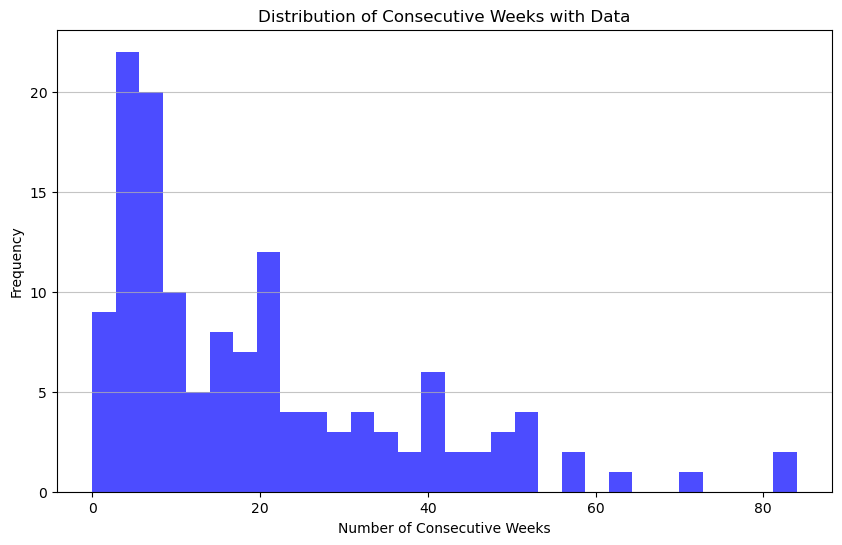

In [727]:
# plot the distribution of valid consecutive weeks 
plt.figure(figsize=(10, 6))
plt.hist(consecutive_weeks_per_subject, bins=30, color='blue', alpha=0.7)
plt.title('Distribution of Consecutive Weeks with Data')
plt.xlabel('Number of Consecutive Weeks')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()

In [728]:
# how many subjects have more than 26 consecutive weeks of data?
print((consecutive_weeks_per_subject > 26).sum())

38


In [729]:
# count how many NaN values are in Mon through Sun columns for each row as a new column `missing_days`
data['missing_days'] = data[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].isna().sum(axis=1)

In [730]:
print(data.head(10))

   subject   Mon   Tue   Wed   Thu   Fri   Sat   Sun  week_num cohort  \
0     3002   NaN   NaN   NaN   NaN   2.0   7.0   8.0         1     PD   
1     3002   5.0  10.0  16.0   2.0   NaN   NaN   NaN         2     PD   
2     3002   NaN   4.0   4.0   9.0   4.0   5.0   NaN         7     PD   
3     3002   NaN   7.0   3.0   7.0  11.0  11.0  13.0         8     PD   
4     3002  17.0  13.0   2.0   NaN   6.0   NaN   NaN         9     PD   
5     3002   NaN   NaN   NaN  11.0  25.0  10.0   3.0        11     PD   
6     3002   8.0   2.0   3.0   8.0  15.0   5.0  12.0        12     PD   
7     3002  16.0  17.0   6.0  26.0   6.0   8.0   5.0        13     PD   
8     3002   6.0   6.0  11.0   4.0   4.0   4.0   6.0        14     PD   
9     3002  23.0  10.0   5.0   7.0   8.0   9.0   NaN        15     PD   

   missing_days  
0             4  
1             3  
2             2  
3             1  
4             3  
5             3  
6             0  
7             0  
8             0  
9             1 

In [ ]:
def interpolate(data, max_gap=2):
    """
    Linearly interpolates missing values in the DataFrame for each subject across weeks, only if the gap is small enough.
    This function assumes that the DataFrame has columns for each day of the week (Mon, Tue, Wed, Thu, Fri, Sat, Sun)
    and a 'week_num' column indicating the week number for each subject.
    Args:
        data (pd.DataFrame): DataFrame containing the data with columns for each day of the week and 'week_num'.
        max_gap (int): Maximum allowed gap size for interpolation. Gaps larger than this will not be interpolated.
    Returns:
        pd.DataFrame: DataFrame with missing values interpolated where applicable.
    """
    result = data.copy()
    day_cols = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    
    # For each subject
    for subject in data['subject'].unique():
        subject_mask = data['subject'] == subject
        subject_data = data[subject_mask].copy().sort_values('week_num')
        
        # Create a continuous series across all weeks, including missing weeks
        all_weeks = range(subject_data['week_num'].min(), subject_data['week_num'].max() + 1)
        
        # Create a flat array for this subject with all days in sequence
        flat_values = []
        flat_indices = []  # To map back to original dataframe
        
        for week in all_weeks:
            week_data = subject_data[subject_data['week_num'] == week]
            
            if len(week_data) > 0:
                # Week exists in data
                row = week_data.iloc[0]
                for day in day_cols:
                    flat_values.append(row[day])
                    flat_indices.append((row.name, day))
            else:
                # Week missing from data - add gap markers
                # We use None as a special value to prevent interpolation across week gaps
                for _ in day_cols:
                    flat_values.append(None)
                    flat_indices.append(None)
        
        # Convert to numpy array for easier processing
        flat_array = np.array(flat_values, dtype=float)
        
        # Handle interpolation with proper limits
        for i in range(len(flat_array)):
            if np.isnan(flat_array[i]):
                # Check if this NaN is part of a gap <= max_gap
                # First, find the start of this NaN sequence
                start = i
                while start > 0 and np.isnan(flat_array[start-1]):
                    start -= 1
                
                # Find the end of this NaN sequence
                end = i
                while end < len(flat_array)-1 and np.isnan(flat_array[end+1]):
                    end += 1
                
                # Calculate gap size
                gap_size = end - start + 1
                
                # Only interpolate if gap is small enough and has values on both sides
                if gap_size <= max_gap and start > 0 and end < len(flat_array)-1:
                    # Get values at boundaries
                    left_val = flat_array[start-1]
                    right_val = flat_array[end+1]
                    
                    # Ensure we have valid values at both boundaries
                    if not np.isnan(left_val) and not np.isnan(right_val):
                        # Linear interpolation
                        for j in range(start, end+1):
                            position = j - start + 1
                            flat_array[j] = left_val + (right_val - left_val) * position / (gap_size + 1)
        
        # Map interpolated values back to original dataframe
        for i, (idx_day) in enumerate(flat_indices):
            if idx_day is not None:  # Skip gap markers
                idx, day = idx_day
                result.loc[idx, day] = flat_array[i]
    
    return result

In [732]:
# test the interpolation function
data1 = interpolate(data, max_gap=2)
print(data1.head(10))

   subject        Mon   Tue   Wed   Thu   Fri   Sat        Sun  week_num  \
0     3002        NaN   NaN   NaN   NaN   2.0   7.0   8.000000         1   
1     3002   5.000000  10.0  16.0   2.0   NaN   NaN        NaN         2   
2     3002        NaN   4.0   4.0   9.0   4.0   5.0   5.666667         7   
3     3002   6.333333   7.0   3.0   7.0  11.0  11.0  13.000000         8   
4     3002  17.000000  13.0   2.0   4.0   6.0   NaN        NaN         9   
5     3002        NaN   NaN   NaN  11.0  25.0  10.0   3.000000        11   
6     3002   8.000000   2.0   3.0   8.0  15.0   5.0  12.000000        12   
7     3002  16.000000  17.0   6.0  26.0   6.0   8.0   5.000000        13   
8     3002   6.000000   6.0  11.0   4.0   4.0   4.0   6.000000        14   
9     3002  23.000000  10.0   5.0   7.0   8.0   9.0   5.000000        15   

  cohort  missing_days  
0     PD             4  
1     PD             3  
2     PD             2  
3     PD             1  
4     PD             3  
5     PD     

In [733]:
# now how many consecutive weeks of data do we have for each subject?
consecutive_weeks_per_subject = data1.groupby('subject').apply(get_consecutive_weeks)

# how many have more than 26 consecutive weeks of data?
print((consecutive_weeks_per_subject >= 26).sum())
# how many subjects that have more than 26 consecutive weeks of data are in the PD cohort? how many in the Control cohort?
print((consecutive_weeks_per_subject[consecutive_weeks_per_subject >= 26].index.isin(data1[data1['cohort'] == 'PD']['subject'].unique())).sum())
print((consecutive_weeks_per_subject[consecutive_weeks_per_subject >= 26].index.isin(data1[data1['cohort'] == 'Control']['subject'].unique())).sum())

96
74
22


C:\Users\Felice Dong\AppData\Local\Temp\ipykernel_13636\3811398467.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  consecutive_weeks_per_subject = data1.groupby('subject').apply(get_consecutive_weeks)


In [734]:
# get subjects with more than 26 consecutive weeks of data
data_con = data1[data1['subject'].isin(consecutive_weeks_per_subject[consecutive_weeks_per_subject >= 26].index)]
# drop missing days column
data_con = data_con.drop(columns=['missing_days'])

In [777]:
# Identify the longest consecutive streak for each subject
# Determine the start week of that streak
# Extract the first 26 weeks from that starting point
def get_longest_consecutive_streak(data, min_streak_length=26):
    """
    Function to find the longest consecutive streak of weeks with non-NaN values for all days of the week
    for each subject in the DataFrame.
    Args:
        data (pd.DataFrame): DataFrame containing the data with columns for each day of the week and 'week_num'.
        min_streak_length (int): Minimum length of the streak to consider.
    Returns:
        pd.DataFrame: DataFrame containing the data for subjects with the longest consecutive streaks
        of at least `min_streak_length` weeks.
    """

    results = []
    day_cols = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    
    for subject in data['subject'].unique():
        subject_data = data[data['subject'] == subject].copy().sort_values('week_num')
        
        # Create a mask for rows where all days are not NaN
        mask = subject_data[day_cols].notna().all(axis=1)
        
        # Get the weeks that have complete data
        complete_weeks = subject_data.loc[mask, 'week_num'].values
        
        # If no complete weeks, skip this subject
        if len(complete_weeks) == 0:
            continue
        
        # Find consecutive sequences of complete weeks
        consecutive_streaks = []
        current_streak = []
        
        for i in range(len(complete_weeks)):
            if i == 0 or complete_weeks[i] == complete_weeks[i-1] + 1:
                # Consecutive week found
                current_streak.append(complete_weeks[i])
            else:
                # Gap found, save previous streak and start new one
                if current_streak:
                    consecutive_streaks.append(current_streak)
                current_streak = [complete_weeks[i]]
        
        # Add the last streak if it exists
        if current_streak:
            consecutive_streaks.append(current_streak)
        
        # Find the longest streak
        if consecutive_streaks:
            longest_streak = max(consecutive_streaks, key=len)
            
            # Check if the longest streak is at least min_streak_length
            if len(longest_streak) >= min_streak_length:
                # Get the first min_streak_length weeks of the longest streak
                target_weeks = longest_streak[:min_streak_length]
                
                # Filter data to only include these weeks
                streak_data = subject_data[subject_data['week_num'].isin(target_weeks)]
                
                # Add to results
                results.append(streak_data)
    
    # Combine all subjects' data
    if results:
        return pd.concat(results)
    else:
        return pd.DataFrame()  # Return empty dataframe if no subjects have long enough streaks


SyntaxError: incomplete input (3182741261.py, line 5)

In [736]:
# get data 
data_con26 = get_longest_consecutive_streak(data_con, min_streak_length=26)

In [737]:
# number of unique subjects in the new dataset
print(data_con26['subject'].nunique())

95
96


## 02. descriptive stats

In [739]:
# consecutive weeks of data for each subject in data_con
consecutive_weeks_per_subject = data_con.groupby('subject').apply(get_consecutive_weeks)
print(consecutive_weeks_per_subject)

subject
3002     30
3003     78
3004     84
3021     55
3023     78
         ..
73115    40
73887    54
74034    36
74067    90
75421    62
Length: 96, dtype: int64


C:\Users\Felice Dong\AppData\Local\Temp\ipykernel_13636\3240853984.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  consecutive_weeks_per_subject = data_con.groupby('subject').apply(get_consecutive_weeks)


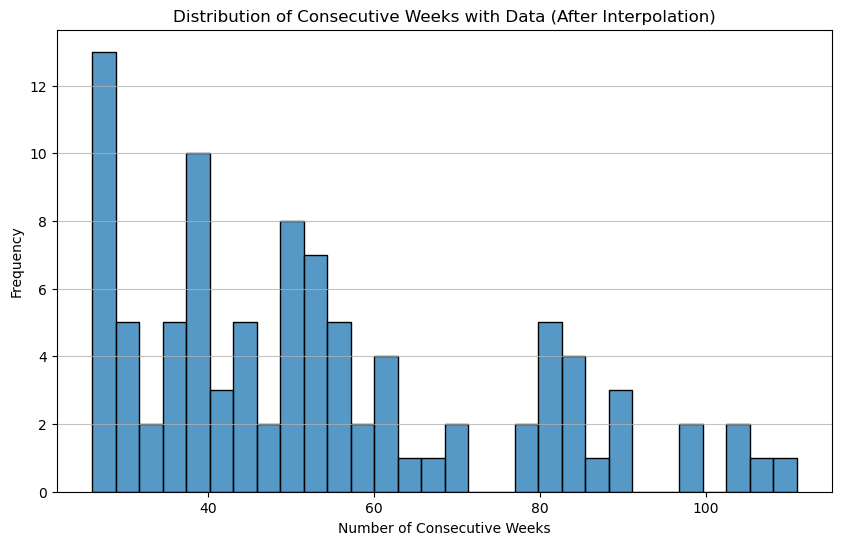

In [740]:
# plot the distribution of consecutive weeks 
plt.figure(figsize=(10, 6))
sns.histplot(consecutive_weeks_per_subject, bins=30)
plt.title('Distribution of Consecutive Weeks with Data (After Interpolation)')
plt.xlabel('Number of Consecutive Weeks')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()


<Figure size 1200x600 with 0 Axes>

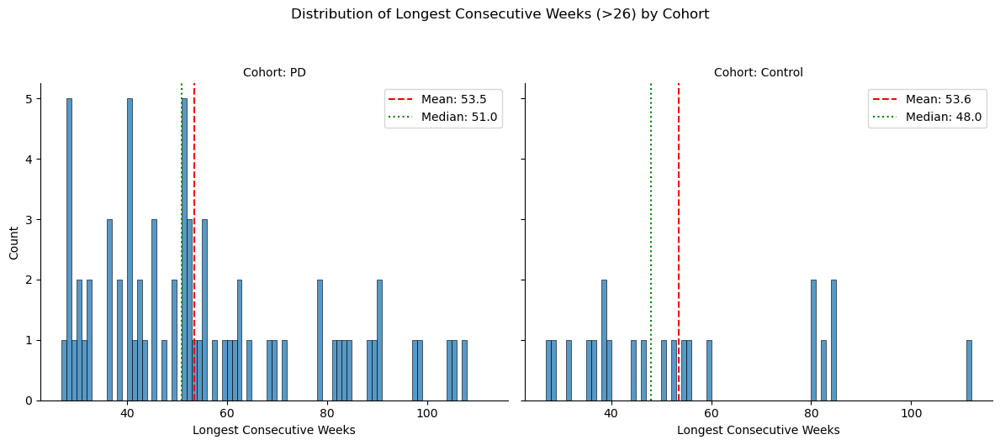

In [741]:
# df that includes cohort information
plot_data = pd.DataFrame({
    'subject': consecutive_weeks_per_subject.index,
    'consecutive_weeks': consecutive_weeks_per_subject.values
})

# merge with original data to get the cohort information
plot_data = plot_data.merge(
    data1[['subject', 'cohort']].drop_duplicates(),
    on='subject',
    how='left'
)

# create the faceted histogram
plt.figure(figsize=(12, 6))
g = sns.FacetGrid(plot_data, col='cohort', height=5, aspect=1.2)
g.map_dataframe(sns.histplot, x='consecutive_weeks', bins=range(27, plot_data['consecutive_weeks'].max() + 2))

g.set_axis_labels('Longest Consecutive Weeks', 'Count')
g.set_titles('Cohort: {col_name}')
plt.suptitle('Distribution of Longest Consecutive Weeks (>26) by Cohort', y=1.05)

# add summary statistics to the plot
for i, cohort in enumerate(['PD', 'Control']):
    cohort_data = plot_data[plot_data['cohort'] == cohort]['consecutive_weeks']
    if len(cohort_data) > 0:  # Check if we have data for this cohort
        mean_val = cohort_data.mean()
        median_val = cohort_data.median()
        ax = g.axes[0][i]
        ax.axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.1f}')
        ax.axvline(median_val, color='green', linestyle=':', label=f'Median: {median_val:.1f}')
        ax.legend()

plt.tight_layout()
plt.show()

## 03. transformations
In order to get an actual progression index that increases as the disease progresses over time, we need to transform the data. The transformation is done by flipping the data across the x-axis, finding the global mean of the HC cohort, and then adding the mean to the flipped data. This way, the HC cohort will have a mean of 0, and the disease cohort will have a mean that is greater than 0 that, according to our expectations increases over time.


In [742]:
# 1. Get the weekly mean of all control subjects
control_means = data_con26[data_con26['cohort'] == 'Control'].groupby('week_num')[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].mean().reset_index()

# 2. Get the negative of all values Mon through Sun in data_con26
data_new = data_con26.copy()
for day in ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']:
    data_new[day] = -data_new[day]

# 3. Add the weekly mean of all control subjects to the negative values of Mon through Sun in data_con26
for day in ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']:
    data_new[day] += control_means[day].values[data_new['week_num'].values - 1]

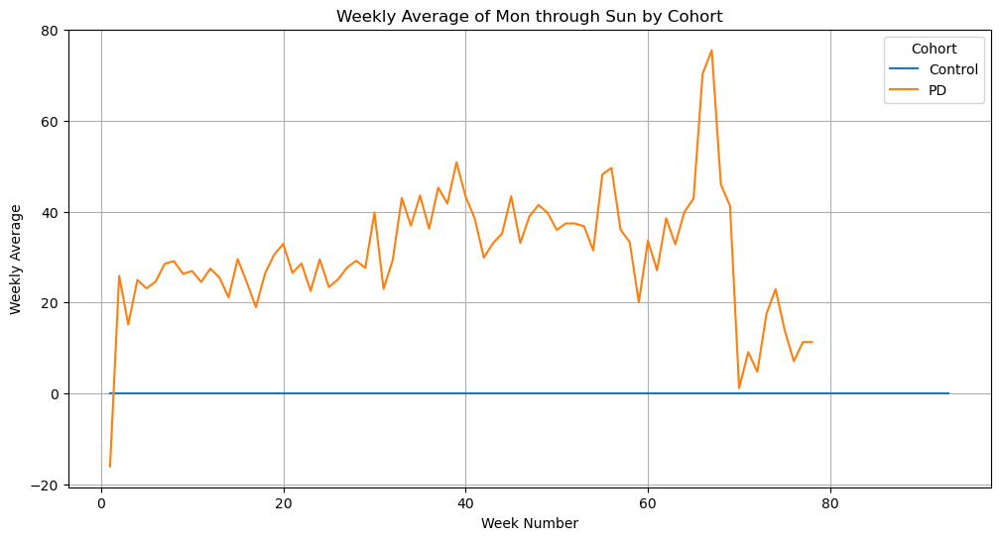

In [743]:
# plot the cohort means for mon through sun over time 
data_weekly = data_new.copy()
data_weekly['weekly_avg'] = data_weekly[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].mean(axis=1)
weekly_means = data_weekly.groupby(['week_num', 'cohort'])['weekly_avg'].mean().reset_index()
plt.figure(figsize=(12, 6))
sns.lineplot(data=weekly_means, x='week_num', y='weekly_avg', hue='cohort')
plt.title('Weekly Average of Mon through Sun by Cohort')
plt.xlabel('Week Number')
plt.ylabel('Weekly Average')
plt.legend(title='Cohort')
plt.grid()
plt.show()


In [744]:
print(weekly_means.head(10))
# print max week_num for each cohort
print(weekly_means.groupby('cohort')['week_num'].max())

   week_num   cohort    weekly_avg
0         1  Control  0.000000e+00
1         1       PD -1.608571e+01
2         2  Control  1.372639e-15
3         2       PD  2.586670e+01
4         3  Control  2.422305e-15
5         3       PD  1.513586e+01
6         4  Control  3.034610e-15
7         4       PD  2.497321e+01
8         5  Control  2.220446e-15
9         5       PD  2.310893e+01
cohort
Control    93
PD         78
Name: week_num, dtype: int64


Aligning everyone starting from 1 would make the data more interpretable, but it would also mean that the week_num is not a true reflection of the time point in the study. But the time point in the study is not reflective of time in the disease, so it's pretty arbitrary either way.

In [745]:
# align everything to the first week of data for each subject

data_new2 = data_con26.copy()

for subject, subject_data in data_new2.groupby('subject'):
    # Get the first week number for this subject
    first_week = subject_data['week_num'].min()

    # Calculate the number of weeks since the first week 
    subject_weeks = subject_data['week_num'] - first_week + 1

    # Update the dataframe with the new week numbers
    data_new2.loc[subject_data.index, 'week_num'] = subject_weeks

# double check that the max week number in data_new2
print(data_new2.groupby('cohort')['week_num'].max())

cohort
Control    26
PD         26
Name: week_num, dtype: int64


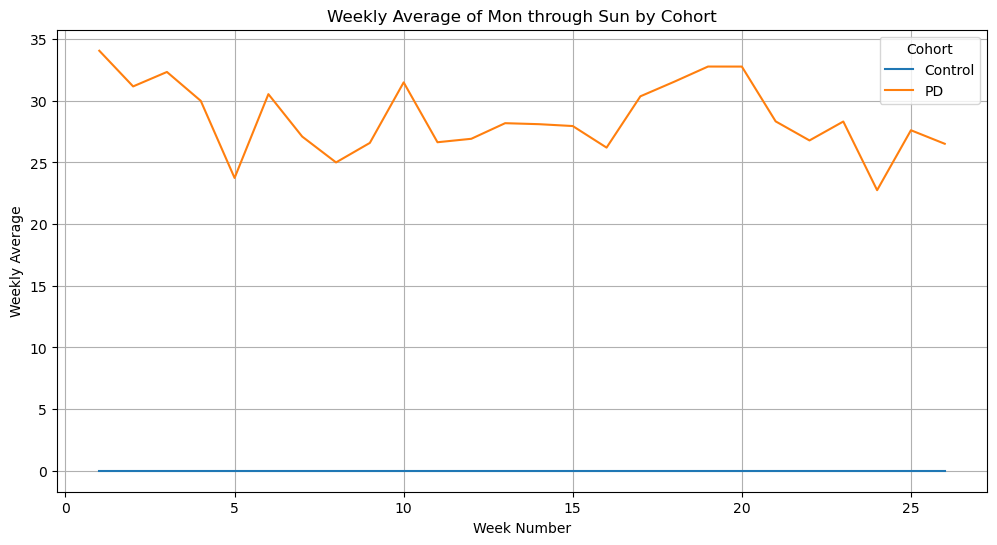

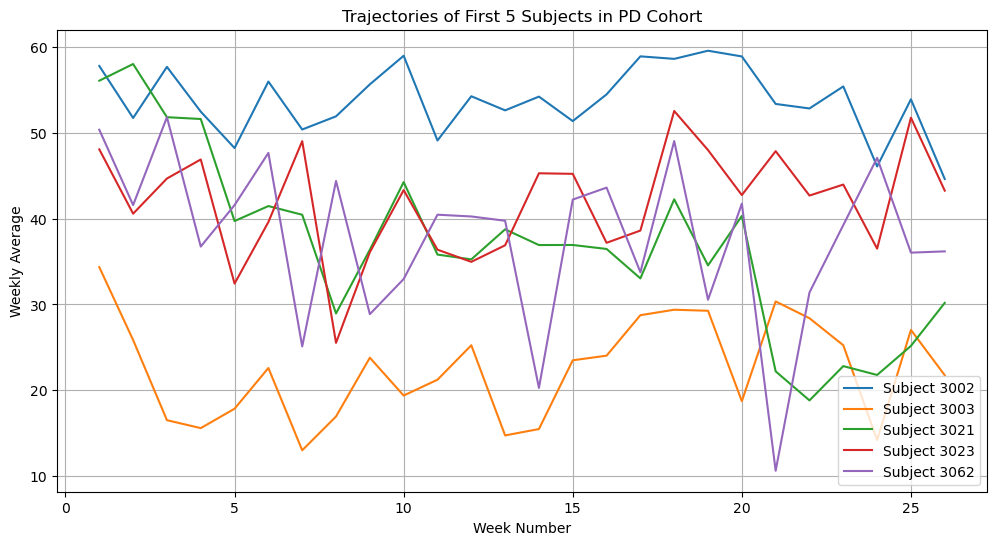

In [746]:
# 1. Get the weekly mean of all control subjects
control_means = data_new2[data_new2['cohort'] == 'Control'].groupby('week_num')[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].mean().reset_index()

# 2. Get the negative of all values Mon through Sun
for day in ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']:
    data_new2[day] = -data_new2[day]

# 3. Add the weekly mean of all control subjects to the negative values of Mon through Sun
for day in ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']:
    data_new2[day] += control_means[day].values[data_new2['week_num'].values - 1]
    
# plot the cohort means for mon through sun over time 
data_weekly = data_new2.copy()
data_weekly['weekly_avg'] = data_weekly[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].mean(axis=1)
weekly_means = data_weekly.groupby(['week_num', 'cohort'])['weekly_avg'].mean().reset_index()
plt.figure(figsize=(12, 6))
sns.lineplot(data=weekly_means, x='week_num', y='weekly_avg', hue='cohort')
plt.title('Weekly Average of Mon through Sun by Cohort')
plt.xlabel('Week Number')
plt.ylabel('Weekly Average')
plt.legend(title='Cohort')
plt.grid()
plt.show()

# plot the trajectories of the first 5 subjects in the PD cohort
pd_subjects = data_new2[data_new2['cohort'] == 'PD']['subject'].unique()[:5]
plt.figure(figsize=(12, 6))
for subject in pd_subjects:
    subject_data = data_new2[data_new2['subject'] == subject]
    plt.plot(subject_data['week_num'], subject_data[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].mean(axis=1), label=f'Subject {subject}')
plt.title('Trajectories of First 5 Subjects in PD Cohort')
plt.xlabel('Week Number')
plt.ylabel('Weekly Average')
plt.legend()
plt.grid()
plt.show()

Global control mean (alt method): 60.49600399600399


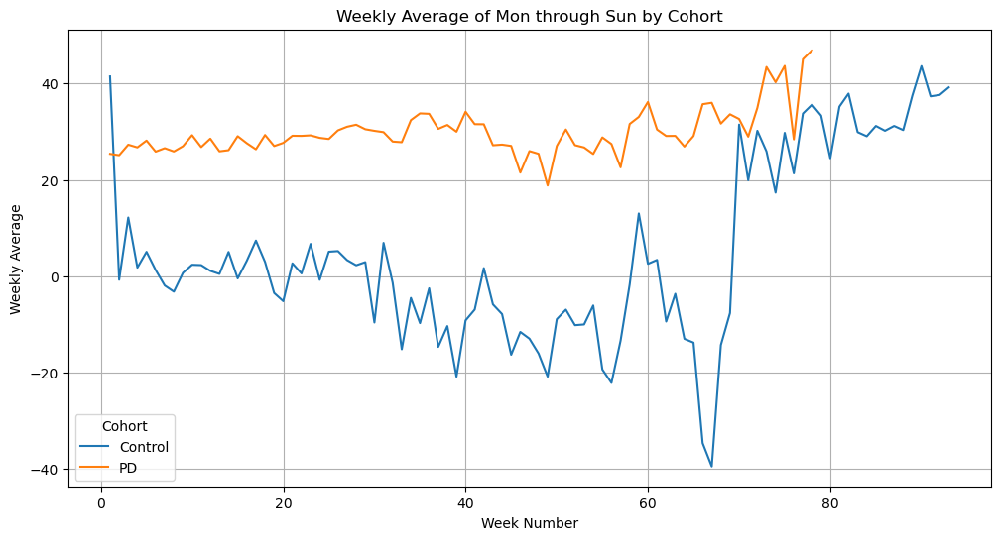

In [747]:
# sum over all days for all HC subjects to get a single global mean
control_data = data_con26[data_con26['cohort'] == 'Control']
day_columns = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

# sum all non-NaN values and divide by count
control_sum = control_data[day_columns].sum().sum()
control_count = control_data[day_columns].notna().sum().sum()
global_hc_mean = control_sum / control_count

print(f"Global control mean (alt method): {global_hc_mean}")

data_new3 = data_con26.copy()

# 2. Get the negative of all values Mon through Sun
for day in ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']:
    data_new3[day] = -data_new3[day]

# 3. Add the weekly mean of all control subjects to the negative values of Mon through Sun
for day in ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']:
    data_new3[day] += global_hc_mean
    
# plot the cohort means for mon through sun over time 
data_weekly = data_new3.copy()
data_weekly['weekly_avg'] = data_weekly[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].mean(axis=1)
weekly_means = data_weekly.groupby(['week_num', 'cohort'])['weekly_avg'].mean().reset_index()
plt.figure(figsize=(12, 6))
sns.lineplot(data=weekly_means, x='week_num', y='weekly_avg', hue='cohort')
plt.title('Weekly Average of Mon through Sun by Cohort')
plt.xlabel('Week Number')
plt.ylabel('Weekly Average')
plt.legend(title='Cohort')
plt.grid()
plt.show()

`data_new4` is the aligned data transformed by a global mean. This is what we are going to use for the LSTM.

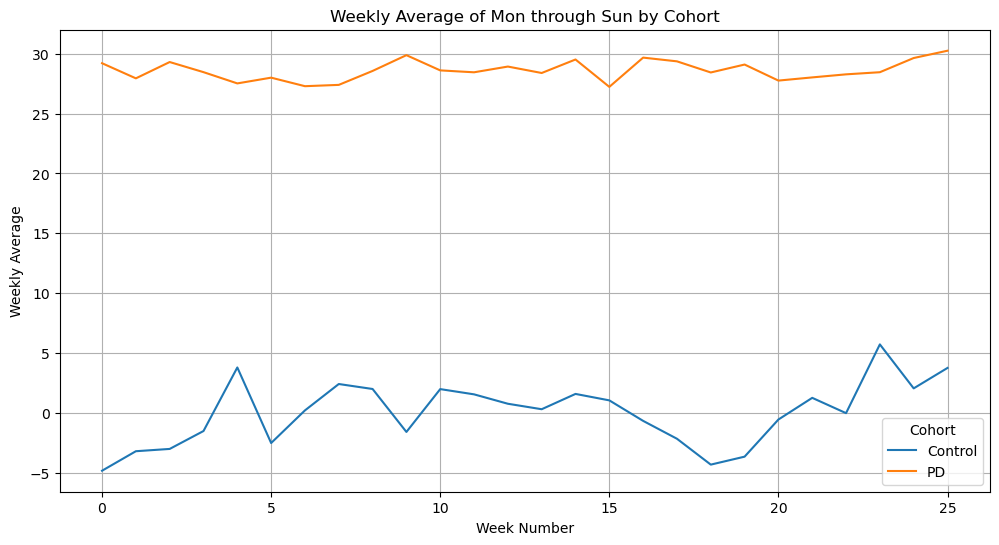

In [748]:
data_new4 = data_con26.copy()

# align everything to the first week of data for each subject
for subject, subject_data in data_new4.groupby('subject'):
    # Get the first week number for this subject
    first_week = subject_data['week_num'].min()

    # Calculate the number of weeks since the first week 
    subject_weeks = subject_data['week_num'] - first_week 

    # Update the dataframe with the new week numbers
    data_new4.loc[subject_data.index, 'week_num'] = subject_weeks

# global mean for HC cohort
# sum over all days for all HC subjects to get a single global mean
control_data = data_con26[data_con26['cohort'] == 'Control']
day_columns = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
# sum all non-NaN values and divide by count
control_sum = control_data[day_columns].sum().sum()
control_count = control_data[day_columns].notna().sum().sum()
global_hc_mean = control_sum / control_count

# get the negative of all values Mon through Sun 
for day in ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']:
    data_new4[day] = -data_new4[day]

# add the global mean of all control subjects to the negative values of Mon through Sun
for day in ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']:
    data_new4[day] += global_hc_mean

# plot the cohort means for mon through sun over time
data_weekly = data_new4.copy()
data_weekly['weekly_avg'] = data_weekly[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].mean(axis=1)
weekly_means = data_weekly.groupby(['week_num', 'cohort'])['weekly_avg'].mean().reset_index()
plt.figure(figsize=(12, 6))
sns.lineplot(data=weekly_means, x='week_num', y='weekly_avg', hue='cohort')
plt.title('Weekly Average of Mon through Sun by Cohort')
plt.xlabel('Week Number')
plt.ylabel('Weekly Average')
plt.legend(title='Cohort')
plt.grid()
plt.show()


## 04. LSTM

In [749]:
def prepare_data(df):
    """Convert dataframe to tensors ready for training"""
    # Get unique subjects and split by cohort
    subjects = df['subject'].unique()
    
    # Lists to store our sequences and labels
    all_sequences = []
    all_labels = []
    all_time_points = []
    subject_ids = []
    
    for subject in subjects:
        subject_data = df[df['subject'] == subject].sort_values('week_num')
        features = subject_data[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].values
        cohort_label = 1 if subject_data['cohort'].iloc[0] == 'PD' else 0
        
        # Only append the full sequences for each unique subject 
        all_sequences.append(features)
        all_labels.append(cohort_label)
        all_time_points.append(len(features))
        subject_ids.append(subject)
    
    return all_sequences, all_labels, all_time_points, subject_ids


In [750]:
def prepare_data_sorted(df):
    """
    Convert dataframe to tensors with sorted activity levels per week
    
    Args:
    - df (pd.DataFrame): DataFrame containing the data with columns 'subject', 'week_num', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun', and 'cohort'.

    Returns:
    - all_sequences (list): List of numpy arrays containing sorted activity levels for each subject.
    - all_labels (list): List of cohort labels for each subject.
    - all_time_points (list): List of time points for each subject.
    - subject_ids (list): List of subject IDs.
    """
    # Get unique subjects 
    subjects = df['subject'].unique()
    print(f"Number of unique subjects: {len(subjects)}") # debugging 
    
    # Lists to store our sequences and labels
    all_sequences = []
    all_labels = []
    all_time_points = []
    subject_ids = []
    
    for subject in subjects:
        # sort the data by week_num to ensure chronological order
        subject_data = df[df['subject'] == subject].sort_values('week_num')

        # get raw feature values 
        features = subject_data[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].values
        # sort features in descending order
        sorted_features = np.sort(features, axis=1)[:, ::-1] # axis=1 sorts each row, ::-1 reverses the order
        
        # get cohort label
        cohort_label = 1 if subject_data['cohort'].iloc[0] == 'PD' else 0
        
        # Only append the full sequences for each unique subject 
        all_sequences.append(sorted_features)
        all_labels.append(cohort_label)
        all_time_points.append(len(sorted_features))
        subject_ids.append(subject)
    
    return all_sequences, all_labels, all_time_points, subject_ids

`prepare_data_sorted` takes in a dataframe and returns four lists. 
- each subject's data should be sorted by week_num 
- each week's daily features should be sorted in descending order of activity 
- labels should be binary, 1 for PD, 0 for HC 
- all_sequences contain the sorted data for each subject, shape (num_subjects, num_weeks, num_features)
- all_labels contain the 0 1 labels for each subject, shape (num_subjects, )
- all_time_points contain the num_weeks for each subject, in this case 26 for everyone, shape (num_subjects, )
- all_subjects contain the subject IDs for each subject, shape (num_subjects, )

In [751]:

# 2. Batch Processing Function
def create_dataloader(sequences, labels, time_points):
    """
    Create DataLoader with padded sequences
    
    Args:
    - sequences (list): List of numpy arrays containing activity levels for each subject.
    - labels (list): List of cohort labels for each subject.
    - time_points (list): List of time points (number of weeks of data) for each subject.

    Returns:
    - X (torch.Tensor): Padded sequences as a tensor.
    - lengths (torch.Tensor): Lengths (numbrt of weeks) of sequences as a tensor.
    - y (torch.Tensor): Labels of subjects as a tensor.
    - time_weights (torch.Tensor): Time weights, evenly spaced time points, as a tensor.
    """
    # Sort by sequence length 
    # not needed for this, but keep for future where there are varying lengths
    sorted_idx = sorted(range(len(sequences)), key=lambda i: len(sequences[i]), reverse=True) 
    
    sequences = [sequences[i] for i in sorted_idx]
    labels = [labels[i] for i in sorted_idx]
    time_points = [time_points[i] for i in sorted_idx]
    
    # Get sequence lengths
    lengths = [len(seq) for seq in sequences]
    
    # Pad sequences
    # again not needed here, but keeping for future cases 
    max_len = max(lengths)
    padded_sequences = []
    
    # post padding: adding weeks of zeros to the end of the sequence
    # to make all sequences the same length of the longest sequence (52)
    for seq in sequences:
        padded_seq = np.zeros((max_len, seq.shape[1]))
        padded_seq[:len(seq)] = seq
        padded_sequences.append(padded_seq)
    
    # Convert to tensors
    X = torch.FloatTensor(padded_sequences)
    y = torch.FloatTensor(labels)
    # lengths should be a tensor from 1 to max_weeks, evenly spaced 
    t_s = range(1, max_len + 1) # range is exclusive of the last value, incremented by 1
    time_weights = torch.FloatTensor(t_s) 
    lengths = torch.FloatTensor(time_points)

    # Transpose the data
    X = X.transpose(0, 1)  # (num_weeks, num_subjects, num_features)
    
    # return dataloader
    return X, lengths, y, time_weights

`create_dataloader` takes in three out of the four lists from `prepare_data_sorted` (excluding subject_ids) and returns 
- X: padded tensors sorted in order of decreasing weeks of real data prior to padding, shape (num_weeks, num_subjects, num_features).  
- lengths: a tensor with actual number of weeks for each subject, shape (num_subjects)
- y: a tensor of shape (num_subjects) with the labels for each subject
- time_weights: a tensor of evenly spaced time points (weeks), shape (num_weeks)
- Note that in this example, because all subjects have the same number of weeks, the lengths tensor is not necessary. Neither is padding. 

In [752]:
# Functions to get random batches for stochastic optimization
def swap_data(x_data, swap_frac=0.30):
    """  
    Swaps adjacent time points in the data 
    Swaps fracXn_t number of time points
        n_t=num of time points in x_data
        Each time point is swapped with the previous

    Args: 
    - x_data (torch.Tensor): Input data tensor of shape (seq_len, num_subjects, num_features)
    - swap_frac (float): Fraction of time points to swap in the data, 0 prevents swapping

    Returns:
    - x_batch (torch.Tensor): Data with swapped time points
    """
    nt=np.arange(list(x_data.size())[0]) #make an array of time indices
    n_swap=np.rint(np.floor(swap_frac*nt[-1])).astype(np.int64) #Get the number of swaps
    nt_max=nt[-1]
    for k in range(n_swap):
        i=np.random.randint(1,nt_max) #get a random index
        nt[i],nt[i-1]=nt[i-1],nt[i] #Swap indices
    x_batch=x_data[nt,:,:] #Apply swapped indices to data
    return x_batch


def get_batch(x_data, lengths_data, y_data, batch_size=10, sigma=0.0, swap_frac=0.0):
    """  
    Get a random batch of size=batch_size of data from x_data, y_data

    Args:
    - x_data (torch.Tensor): Input data tensor of shape (seq_len, num_subjects, num_features)
    - lengths_data (torch.Tensor): Lengths of each sequence in the batch
    - y_data (torch.Tensor): Labels tensor of shape (num_subjects,)
    - batch_size (int): Size of the batch to sample
    - sigma (float): Standard deviation of the noise to be added to x_data
    - swap_frac (float): Fraction of time points to swap in the data, 0 prevents swapping 

    Returns:
    - x_batch (torch.Tensor): Sampled batch of input data
    - lengths_batch (torch.Tensor): Lengths of the sampled sequences
    - y_batch (torch.Tensor): Sampled batch of labels
    - batch_indices (torch.Tensor): Indices of the sampled sequences
    """
    n_sequences = x_data.size(1) # Number of subjects in the dataset
    
    # randomly select indices for the batch
    batch_indices = torch.randperm(n_sequences)[:batch_size]

    # Sample the batch and extract data 
    x_batch = x_data[:, batch_indices, :]
    lengths_batch = lengths_data[batch_indices] # 26 for all subjects 
    y_batch = y_data[batch_indices]

    # Add noise and swap time points 
    x_batch = x_batch + sigma*torch.normal(0,1.0,size=x_batch.size())
    if swap_frac > 0.0:
        x_batch=swap_data(x_batch,swap_frac=swap_frac)

    return x_batch, lengths_batch, y_batch, batch_indices

In [753]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=False)
        self.lin = nn.Linear(hidden_size, output_size) 

    def forward(self, x):
        lstm_out, (hn, cn) = self.lstm(x)
        # apply linear layer to each time step 
        weight = self.lin(lstm_out)
        # denominator to normalize the weights 
        epsilon = 1e-6
        weight_denom = torch.sum(torch.abs(weight), axis=2) + epsilon
        # normalize the weights
        # torch.mul is the element-wise multiplication
        output = torch.sum(torch.mul(weight, x), axis=2) / weight_denom
        return output, weight

In [754]:
def loss_fn(output, weight, y, t):
    """
    Custom loss function for the LSTM model
    
    Args:
    - output (torch.Tensor): Output from the LSTM model
    - weight (torch.Tensor): Weights from the LSTM model
    - y (torch.Tensor): Labels for the data
    - t (torch.Tensor): Time weights for the data

    Returns:
    - loss (torch.Tensor): Computed loss value
    """
    y1_index=torch.nonzero(y>0.5).flatten() # PD indices
    y0_index=torch.nonzero(y<=0.5).flatten() # HC indices

    epsilon = 1e-6
    y1_sum=torch.sum(output[:,y1_index],axis=1)/(torch.numel(y1_index)+epsilon) # numel = num of elements in the tensor
    y1_sum=y1_sum*(1+t) # weigh later weeks more than earlier weeks
    y1_sum=torch.sum(y1_sum)

    y0_sum=torch.sum((output[:,y0_index])**2)/(torch.numel(y0_index)+epsilon)

    # separate std for PD and HC cohorts
    w1_std=torch.std(weight[:,y1_index,:].flatten())
    w0_std=torch.std(weight[:,y0_index,:].flatten())

    # the weight is multiplied by a factor of 20 to make it more significant
    # last term regularizes the std of the weights
    loss = -y1_sum+y0_sum+20.0*(w1_std+w0_std)#+3000.0*(10.0*d_wt)#
    
    return loss 

## 05. training

In [755]:
# prep and sort the data
sequences, labels, time_points, subject_ids = prepare_data_sorted(data_new4)
# make into tensors
X, lengths, y, time_weights = create_dataloader(sequences, labels, time_points)

Number of unique subjects: 95


In [756]:
input_size = 7 
hidden_size = 20
output_size = 7
num_layers = 2

model = LSTMModel(input_size, hidden_size, output_size, num_layers)

In [757]:
def train_model(model, X, lengths, y, time_weights, num_epochs=300, batch_size=50, lr=0.0003):
    """
    Train the LSTM model
    
    Args: 
        - model (nn.Module): LSTM model to be trained
        - X (torch.Tensor): Input data tensor of shape (seq_len, num_subjects, num_features)
        - lengths (torch.Tensor): Lengths of each sequence in the batch (num_subjects)
        - y (torch.Tensor): Labels tensor of shape (num_subjects)
        - time_weights (torch.Tensor): Time weights tensor of shape (num_weeks)
        - num_epochs (int): Number of epochs to train the model
        - batch_size (int): Size of each batch
        - lr (float): Learning rate for the optimizer

    Returns: 
        - trained model 
        - list of loss values during training 
    """
    
    # Define the optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr)

    # store losses for analysis 
    losses = []
    
    model.train()

    for epoch in range(num_epochs):
        # Get a random batch
        x_batch, lengths_batch, y_batch, batch_indices = get_batch(
            X, lengths, y, 
            batch_size=batch_size,
            sigma=0.02, swap_frac=0.2)

        # Zero the gradients
        optimizer.zero_grad()
        
        # Forward pass
        output, weight = model(x_batch)
        
        # Compute loss
        loss = loss_fn(output, weight, y_batch, time_weights)
        losses.append(loss.item())
        
        # Backward pass and optimization
        loss.backward()
        optimizer.step()
        
        if (epoch + 1) % 10 == 0:
            print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')

    print("\nTrainng complete")
    print(f"Final loss: {losses[-1]:.4f}")

    return model, losses

In [758]:
# train the model 
train_model(model, X, lengths, y, time_weights, num_epochs=10000, batch_size=50, lr=0.0003)

Epoch [10/10000], Loss: 1597.0809
Epoch [20/10000], Loss: -356.5905
Epoch [30/10000], Loss: -2175.7192
Epoch [40/10000], Loss: -2669.1145
Epoch [50/10000], Loss: -3556.1270
Epoch [60/10000], Loss: -3760.0603
Epoch [70/10000], Loss: -2418.4404
Epoch [80/10000], Loss: -4591.9956
Epoch [90/10000], Loss: -6515.7280
Epoch [100/10000], Loss: -6038.7969
Epoch [110/10000], Loss: -5299.4492
Epoch [120/10000], Loss: -6671.4351
Epoch [130/10000], Loss: -8429.1562
Epoch [140/10000], Loss: -7361.5049
Epoch [150/10000], Loss: -3878.1929
Epoch [160/10000], Loss: -4892.5889
Epoch [170/10000], Loss: -3465.3669
Epoch [180/10000], Loss: -6112.2417
Epoch [190/10000], Loss: -8409.1270
Epoch [200/10000], Loss: -6476.6128
Epoch [210/10000], Loss: -7560.2510
Epoch [220/10000], Loss: -9928.6211
Epoch [230/10000], Loss: -10862.7119
Epoch [240/10000], Loss: -10989.6797
Epoch [250/10000], Loss: -10265.0762
Epoch [260/10000], Loss: -9578.6816
Epoch [270/10000], Loss: -10580.1289
Epoch [280/10000], Loss: -9959.0029

(LSTMModel(
   (lstm): LSTM(7, 20, num_layers=2)
   (lin): Linear(in_features=20, out_features=7, bias=True)
 ),
 [4434.525390625,
  3774.495849609375,
  3760.838623046875,
  3272.82763671875,
  3139.043701171875,
  2767.501953125,
  2683.0068359375,
  2311.911865234375,
  2122.5390625,
  1597.0809326171875,
  1698.7130126953125,
  1169.7437744140625,
  699.8788452148438,
  909.2244873046875,
  550.5765991210938,
  382.2652587890625,
  100.87866973876953,
  -134.8892822265625,
  -351.0923156738281,
  -356.5904846191406,
  -537.5299682617188,
  -995.553466796875,
  -1084.42236328125,
  -1083.3873291015625,
  -1327.1007080078125,
  -1285.000732421875,
  -1749.2403564453125,
  -1762.128662109375,
  -1793.9678955078125,
  -2175.71923828125,
  -2228.63330078125,
  -2089.1416015625,
  -2829.81494140625,
  -1925.0560302734375,
  -2259.40380859375,
  -2577.97998046875,
  -2086.980712890625,
  -2355.583251953125,
  -2777.740478515625,
  -2669.114501953125,
  -2894.94091796875,
  -2867.399902343

torch.Size([26, 95])


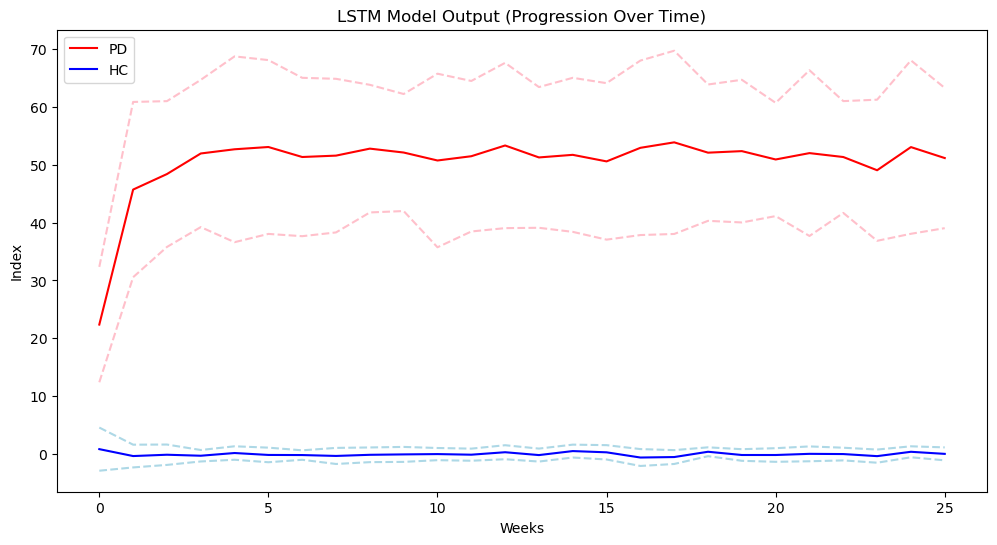

1.2935706


In [759]:
output,weight=model(X)
print(output.shape)

y1_index=torch.nonzero(y>0.5).flatten()
out=output[:,y1_index]
output_np=out.detach().numpy()
output_mean=np.mean(output_np,axis=1)
output_std=np.std(output_np,axis=1)
plt.figure(figsize=(12, 6))
plt.plot(output_mean, color='red', label='PD')
plt.plot(output_mean+output_std, color='pink', linestyle='--')
plt.plot(output_mean-output_std, color='pink', linestyle='--')

y0_index=torch.nonzero(y<=0.5).flatten()
out=output[:,y0_index]
output_np=out.detach().numpy()
output_mean=np.mean(output_np,axis=1)
output_std=np.std(output_np,axis=1)
plt.plot(output_mean, color='blue', label='HC')
plt.plot(output_mean+output_std, color='lightblue', linestyle='--')
plt.plot(output_mean-output_std, color='lightblue', linestyle='--')
plt.xlabel('Weeks')
plt.ylabel('Index')
plt.title('LSTM Model Output (Progression Over Time)')
plt.legend()
plt.show()

print(np.mean(output_std))

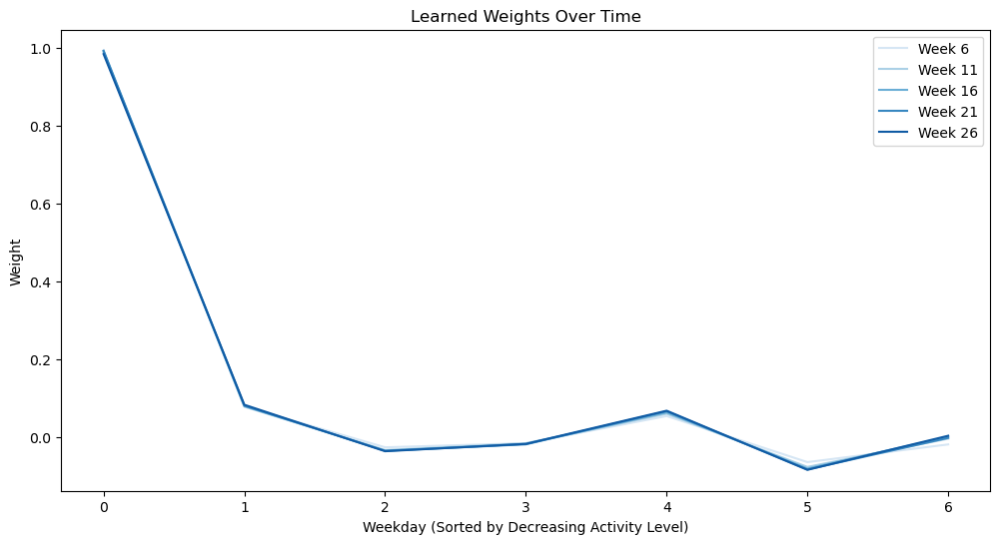

In [760]:
# shows the relative importance of all features at specific time points
w = torch.mean(weight, axis=1)

plt.figure(figsize=(12, 6))
for i in range(5, 30, 5):
    tmp = w[i, :].detach().numpy()
    tmp = tmp / np.sum(tmp)
    plt.plot(tmp, color=plt.cm.Blues(i / 30), label=f'Week {i+1}')
plt.xlabel('Weekday (Sorted by Decreasing Activity Level)')
plt.ylabel('Weight')
plt.title('Learned Weights Over Time')
plt.legend()
plt.show()


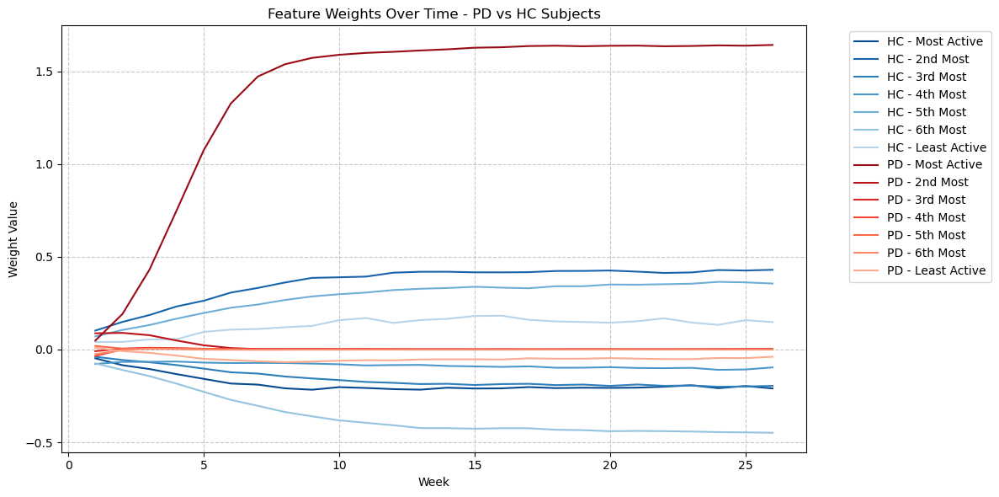

In [761]:
# y>0.5 is PD cohort 
y1_index=torch.nonzero(y>0.5).flatten()
# y<=0.5 is HC cohort
y0_index=torch.nonzero(y<=0.5).flatten()
# average the weights for each cohort
w1=torch.mean(weight[:,y1_index,:],axis=1).detach().numpy()
w0=torch.mean(weight[:,y0_index,:],axis=1).detach().numpy()

plt.figure(figsize=(12, 6))

features = ['Most Active', '2nd Most', '3rd Most', '4th Most', '5th Most', '6th Most', 'Least Active']
colors = plt.cm.Blues(np.linspace(0.9, 0.3, 7))

num_weeks = w0.shape[0]  # Number of weeks
x_weeks = np.arange(1, num_weeks+1)

# Plot HC features with different blue shades
for i in range(7):
    plt.plot(x_weeks, w0[:,i], color=colors[i], linestyle='-', label=f'HC - {features[i]}')

colors = plt.cm.Reds(np.linspace(0.9, 0.3, 7))  # Different red shades

# Plot PD features with different red shades
for i in range(7):
    plt.plot(x_weeks, w1[:,i], color=colors[i], linestyle='-', label=f'PD - {features[i]}')

plt.xlabel('Week')
plt.ylabel('Weight Value')
plt.title('Feature Weights Over Time - PD vs HC Subjects')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

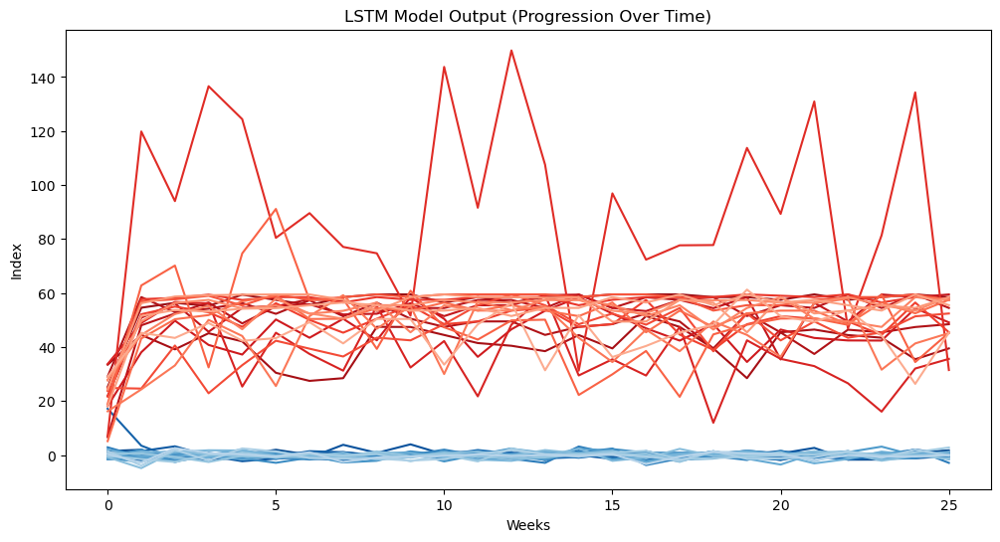

In [762]:
output1=output[:,y1_index].detach().numpy()
output0=output[:,y0_index].detach().numpy()

plt.figure(figsize=(12, 6))
colors = plt.cm.Blues(np.linspace(0.9, 0.3, 20))  # Different blue shades
for i in range(20):
    plt.plot(output0[:,i], color=colors[i], linestyle='-')
colors = plt.cm.Reds(np.linspace(0.9, 0.3, 20))  # Different red shades
for i in range(20):
    plt.plot(output1[:,i], color=colors[i], linestyle='-')
plt.xlabel('Weeks')
plt.ylabel('Index')
plt.title('LSTM Model Output (Progression Over Time)')
plt.show()

## 06. compare with not sorted data


## 07. testing loop 

Want to accomplish the following:
We have 95 subjects, 22 in control, 73 in PD. 
- randomly pull out a small subset of testing, 2 from each cohort, 4 total.
- run this inner loop until loss converges:
    - evaluate percentage loss by taking last 3 or 4 iterations, take the mean loss and net change
    - take as many batches (of 15 from each cohort) as you can until the loss converges OR until we've run at least 2000 iterations
- evaluate and plot the 2 testing subjects (for each cohort)
    - do outer loop for 15 to 20 times
    - also keep track of the weights at the same time
- calculate the p-value vs time using a t-test and plot

In [763]:
import numpy as np 
import torch 
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from scipy import stats
import seaborn as sns

In [764]:
def test_model_progression_index(model, sequences, labels, time_points, subject_ids, num_outer_loops=15):
    """
    Test the LSTM model for progression index estimation using multiple random splits.
    
    Args:
        model: LSTM model class (not instantiated)
        sequences: List of sequence data for all subjects
        labels: List of labels for all subjects
        time_points: List of time points for all subjects
        subject_ids: List of subject IDs
        num_outer_loops: Number of random test splits to evaluate
        
    Returns:
        Dictionary of results including progression indices and p-values
    """

    # Convert lists to numpy arrays for easier indexing
    labels_np = np.array(labels)
    
    # Find indices of PD and HC subjects
    pd_indices = np.where(labels_np == 1)[0]
    hc_indices = np.where(labels_np == 0)[0]
    
    print(f"Total subjects: {len(labels)}")
    print(f"PD subjects: {len(pd_indices)}")
    print(f"HC subjects: {len(hc_indices)}")
    
    # Results storage
    all_pd_outputs = []
    all_hc_outputs = []
    all_weights = []
    all_pvalues = []
    
    # Perform multiple random splits
    for outer_loop in range(num_outer_loops):
        print(f"\nOuter loop {outer_loop + 1}/{num_outer_loops}")
        
        # Randomly select 2 PD and 2 HC subjects for testing
        test_pd_indices = np.random.choice(pd_indices, size=2, replace=False)
        test_hc_indices = np.random.choice(hc_indices, size=2, replace=False)
        test_indices = np.concatenate([test_pd_indices, test_hc_indices]) # a single array of test indices 
        
        # Create train indices (all subjects are included except the test subjects) 
        train_indices = np.array([i for i in range(len(sequences)) if i not in test_indices])
        
        # Create train and test datasets
        train_sequences = [sequences[i] for i in train_indices]
        train_labels = [labels[i] for i in train_indices]
        train_time_points = [time_points[i] for i in train_indices]
        train_subject_ids = [subject_ids[i] for i in train_indices]
        
        test_sequences = [sequences[i] for i in test_indices]
        test_labels = [labels[i] for i in test_indices]
        test_time_points = [time_points[i] for i in test_indices]
        test_subject_ids = [subject_ids[i] for i in test_indices]
        
        # Convert to tensors
        # Again lengths not needed here since the seuqences are all the same length 
        X_train, lengths_train, y_train, time_weights = create_dataloader(
            train_sequences, train_labels, train_time_points)
        X_test, lengths_test, y_test, _ = create_dataloader(
            test_sequences, test_labels, test_time_points)
        
        # Initialize model
        input_size = 7  # Days of the week, 7 features 
        hidden_size = 20
        output_size = 7
        num_layers = 2
        
        lstm_model = model(input_size, hidden_size, output_size, num_layers)

        # Training params 
        max_epochs = 20000
        batch_size = 15
        lr = 0.0003
        sigma = 0.02 # noise to add to the data 
        swap_frac = 0.2 # fraction of time points to swap in the data

        # Loss parameters
        losses = []
        convergence_window = 5  # Check last 5 iterations for convergence
        convergence_threshold = 0.0001  # .01% change in loss

        print("Training until convergence...") 
        
        optimizer = optim.Adam(lstm_model.parameters(), lr=lr)
        lstm_model.train()
        
        # INNER TRAINING LOOP
        for epoch in range(max_epochs):
            # Train on batches of 15 from each cohort, want balanced batches
            train_pd_indices = np.where(y_train.numpy() == 1)[0]
            train_hc_indices = np.where(y_train.numpy() == 0)[0]
            
            # Select batch_size random subjects from each cohort if possible
            batch_pd_size = min(batch_size, len(train_pd_indices))
            batch_hc_size = min(batch_size, len(train_hc_indices))
            
            pd_batch_indices = torch.tensor(np.random.choice(
                train_pd_indices, size=batch_pd_size, replace=False))
            hc_batch_indices = torch.tensor(np.random.choice(
                train_hc_indices, size=batch_hc_size, replace=False))
            
            batch_indices = torch.cat([pd_batch_indices, hc_batch_indices])
            
            # Get batch data
            x_batch = X_train[:, batch_indices, :]
            y_batch = y_train[batch_indices]

            # Add noise 
            x_batch = x_batch + sigma * torch.normal(0, 1.0, size=x_batch.size())
            # Time swapping 
            if swap_frac > 0.0:
                x_batch = swap_data(x_batch, swap_frac=swap_frac)
            
            # Zero gradients
            optimizer.zero_grad()
            
            # Forward pass
            output, weight = lstm_model(x_batch)
            
            # Compute loss
            loss = loss_fn(output, weight, y_batch, time_weights)
            losses.append(loss.item())
            
            # Backward pass and optimization
            loss.backward()
            optimizer.step()

            # Check for convergence every 10 epochs by averaging the last 5 epochs and subtracting the mean of the previous 5 epochs
            if epoch > convergence_window and epoch % 10 == 0:
                recent_losses = losses[-convergence_window:]
                avg_loss = np.mean(recent_losses)
                prev_avg_loss = np.mean(losses[-2 * convergence_window:-convergence_window])
                # Caclulate the percentage change in loss
                percent_change = abs((avg_loss - prev_avg_loss) / prev_avg_loss)

                if percent_change < convergence_threshold:
                    print(f"Converged at epoch {epoch + 1} with loss {avg_loss:.4f}")
                    break

            if (epoch + 1) % 100 == 0:
                print(f'Epoch [{epoch + 1}/{max_epochs}], Loss: {loss.item():.4f}')

        print(f"Final loss: {losses[-1]:.4f}")
        print("Training complete")
                
        # Evaluate on test subjects
        lstm_model.eval()
        
        # Importantly no gradient tracking during evaluation
        with torch.no_grad():
            test_output, test_weight = lstm_model(X_test)
            
            # Convert to numpy
            test_output_np = test_output.cpu().numpy()
            test_weight_np = test_weight.cpu().numpy()
            test_labels_np = y_test.cpu().numpy()
            
            # Separate PD and HC outputs
            test_pd_indices = np.where(test_labels_np == 1)[0]
            test_hc_indices = np.where(test_labels_np == 0)[0]
            
            pd_outputs = test_output_np[:, test_pd_indices]
            hc_outputs = test_output_np[:, test_hc_indices]
            
            # Store results
            all_pd_outputs.append(pd_outputs)
            all_hc_outputs.append(hc_outputs)
            all_weights.append(test_weight_np)
            
            # Calculate p-values over time using t-test
            pvalues = []
            for t in range(test_output_np.shape[0]):  # For each time point
                _, p_value = stats.ttest_ind(
                    pd_outputs[t, :], hc_outputs[t, :], equal_var=False)
                pvalues.append(p_value)
                
            all_pvalues.append(pvalues)
            
            # Plot results for this split
            plt.figure(figsize=(12, 10))
            
            # Plot progression indices
            plt.subplot(2, 1, 1)
            for i in range(pd_outputs.shape[1]):
                plt.plot(pd_outputs[:, i], 'r-', alpha=0.7, 
                         label=f"PD: {test_subject_ids[test_pd_indices[i]]}" if i == 0 else "")
                
            for i in range(hc_outputs.shape[1]):
                plt.plot(hc_outputs[:, i], 'b-', alpha=0.7,
                         label=f"HC: {test_subject_ids[test_hc_indices[i]]}" if i == 0 else "")
                
            plt.xlabel('Weeks')
            plt.ylabel('Progression Index')
            plt.title(f'Progression Index for Test Subjects (Split {outer_loop + 1})')
            plt.legend()
            plt.grid(True, linestyle='--', alpha=0.7)
            
            # Plot p-values
            plt.subplot(2, 1, 2)
            plt.plot(pvalues, 'k-')
            plt.axhline(y=0.05, color='r', linestyle='--', label='p=0.05')
            plt.xlabel('Weeks')
            plt.ylabel('p-value')
            plt.title('P-value between PD and HC Progression Indices')
            plt.yscale('log')
            plt.legend()
            plt.grid(True, linestyle='--', alpha=0.7)
            
            plt.tight_layout()
            plt.show()
    
    # Aggregate results across all splits
    
    # Convert list of arrays to single array
    # Handle different shapes by padding to max length
    max_weeks = max([arr.shape[0] for arr in all_pd_outputs])
    
    # Average p-values across all splits
    all_pvalues_padded = []
    for pvals in all_pvalues:
        padded = np.pad(pvals, (0, max_weeks - len(pvals)), 
                        mode='constant', constant_values=np.nan)
        all_pvalues_padded.append(padded)
    
    avg_pvalues = np.nanmean(all_pvalues_padded, axis=0)
    
    # Calculate statistical significance windows
    sig_windows = []
    in_window = False
    start_week = 0
    
    for week, p in enumerate(avg_pvalues):
        if p < 0.05 and not in_window:
            in_window = True
            start_week = week
        elif p >= 0.05 and in_window:
            in_window = False
            sig_windows.append((start_week, week - 1))
    
    # Handle case where we end in a significant window
    if in_window:
        sig_windows.append((start_week, len(avg_pvalues) - 1))
    
    print("\nStatistically Significant Windows (p < 0.05):")
    for start, end in sig_windows:
        print(f"Weeks {start} to {end}")
    
    return {
        'pd_outputs': all_pd_outputs,
        'hc_outputs': all_hc_outputs,
        'weights': all_weights,
        'pvalues': all_pvalues,
        'avg_pvalues': avg_pvalues,
        'sig_windows': sig_windows
    }

In [765]:
def set_seed(seed_value):
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed_value)
        torch.cuda.manual_seed_all(seed_value)  # for multi-GPU setups
    # Make CuDNN deterministic (slightly reduces performance but makes results reproducible)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

Total subjects: 95
PD subjects: 73
HC subjects: 22

Outer loop 1/20
Training until convergence...
Epoch [100/20000], Loss: -6615.8149
Epoch [200/20000], Loss: -12473.9961
Epoch [300/20000], Loss: -14382.8594
Epoch [400/20000], Loss: -16407.4004
Epoch [500/20000], Loss: -14292.7559
Epoch [600/20000], Loss: -18615.2285
Epoch [700/20000], Loss: -17265.6719
Epoch [800/20000], Loss: -13850.4395
Epoch [900/20000], Loss: -17614.7422
Epoch [1000/20000], Loss: -17290.3008
Epoch [1100/20000], Loss: -17934.4141
Epoch [1200/20000], Loss: -18279.0215
Epoch [1300/20000], Loss: -19008.5449
Epoch [1400/20000], Loss: -17775.5977
Converged at epoch 1451 with loss -18648.5020
Final loss: -18857.1309
Training complete


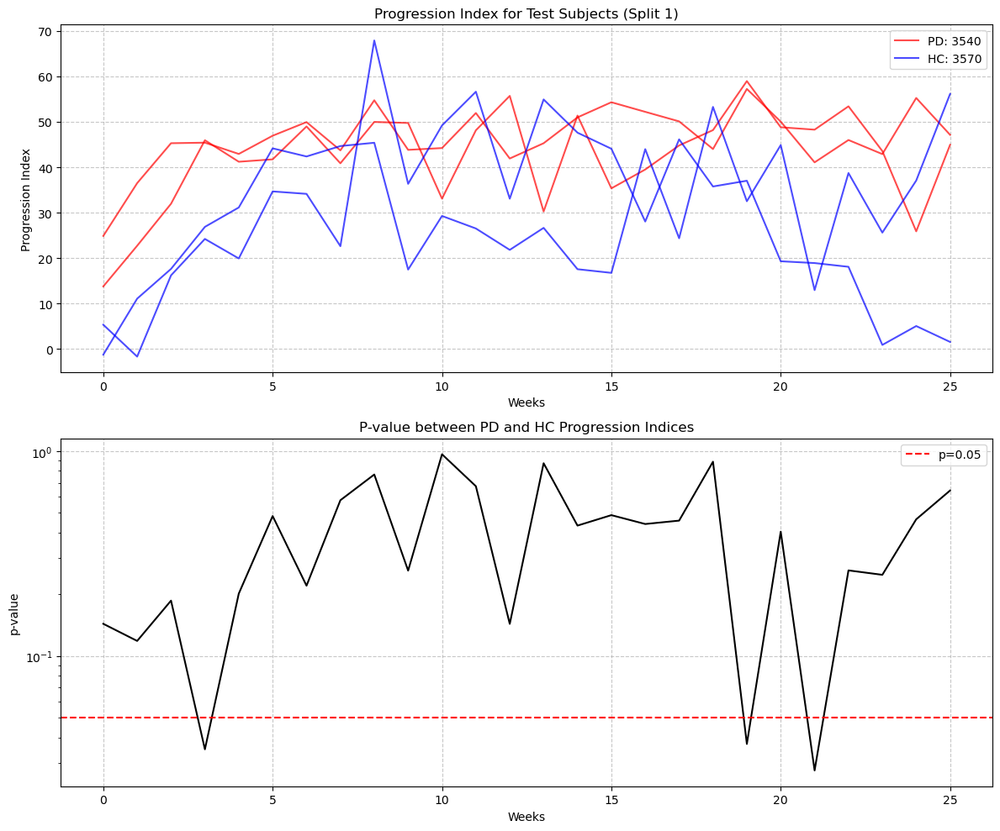


Outer loop 2/20
Training until convergence...
Epoch [100/20000], Loss: -5810.1060
Epoch [200/20000], Loss: -2107.0227
Epoch [300/20000], Loss: -5010.8257
Epoch [400/20000], Loss: -8462.5078
Epoch [500/20000], Loss: -9631.2344
Epoch [600/20000], Loss: -14695.3682
Converged at epoch 611 with loss -13650.1191
Final loss: -13182.1357
Training complete


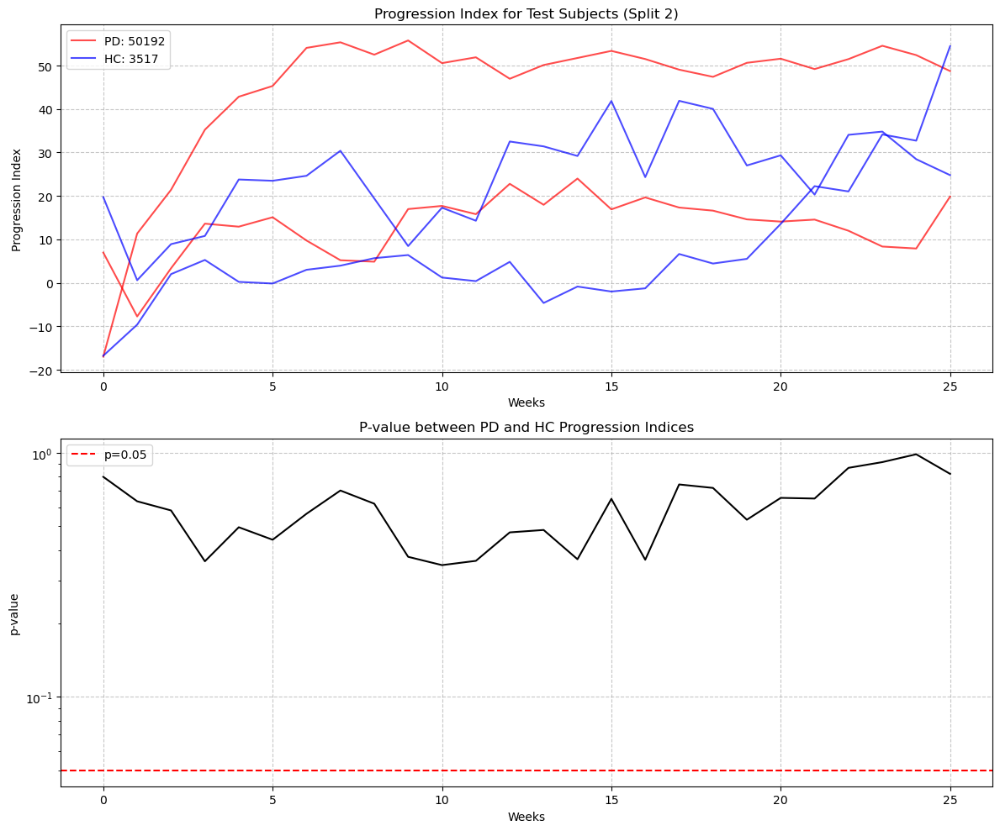


Outer loop 3/20
Training until convergence...
Epoch [100/20000], Loss: -5016.4341
Epoch [200/20000], Loss: -10444.7188
Epoch [300/20000], Loss: -11582.6025
Epoch [400/20000], Loss: -13232.4863
Epoch [500/20000], Loss: -15039.7598
Epoch [600/20000], Loss: -16633.4336
Epoch [700/20000], Loss: -15163.4268
Epoch [800/20000], Loss: -17723.2109
Epoch [900/20000], Loss: -16700.7949
Epoch [1000/20000], Loss: -16906.4590
Epoch [1100/20000], Loss: -19147.1816
Epoch [1200/20000], Loss: -17907.6992
Epoch [1300/20000], Loss: -17830.8691
Converged at epoch 1351 with loss -17921.3363
Final loss: -18661.2910
Training complete


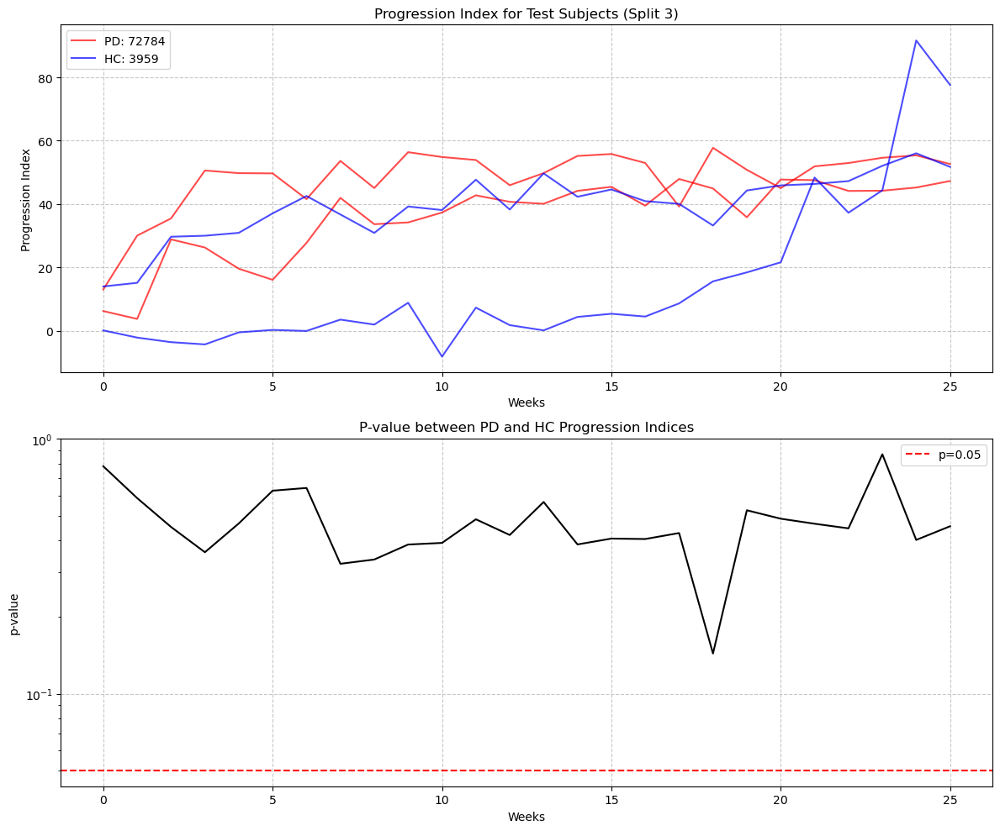


Outer loop 4/20
Training until convergence...
Epoch [100/20000], Loss: -7302.7734
Epoch [200/20000], Loss: -11997.6396
Epoch [300/20000], Loss: -13058.3193
Epoch [400/20000], Loss: -13279.8311
Epoch [500/20000], Loss: -16212.0596
Epoch [600/20000], Loss: -14250.4746
Epoch [700/20000], Loss: -16333.5244
Epoch [800/20000], Loss: -15857.2217
Epoch [900/20000], Loss: -16635.6719
Epoch [1000/20000], Loss: -17195.3770
Epoch [1100/20000], Loss: -17249.9023
Epoch [1200/20000], Loss: -18300.8984
Epoch [1300/20000], Loss: -15996.5420
Epoch [1400/20000], Loss: -17379.4648
Epoch [1500/20000], Loss: -18466.3809
Epoch [1600/20000], Loss: -18463.1113
Epoch [1700/20000], Loss: -17816.0332
Epoch [1800/20000], Loss: -17521.1602
Epoch [1900/20000], Loss: -17484.4531
Epoch [2000/20000], Loss: -18285.7129
Epoch [2100/20000], Loss: -18313.7656
Epoch [2200/20000], Loss: -17718.4883
Epoch [2300/20000], Loss: -18500.7305
Epoch [2400/20000], Loss: -18563.5430
Epoch [2500/20000], Loss: -19631.6152
Epoch [2600/2

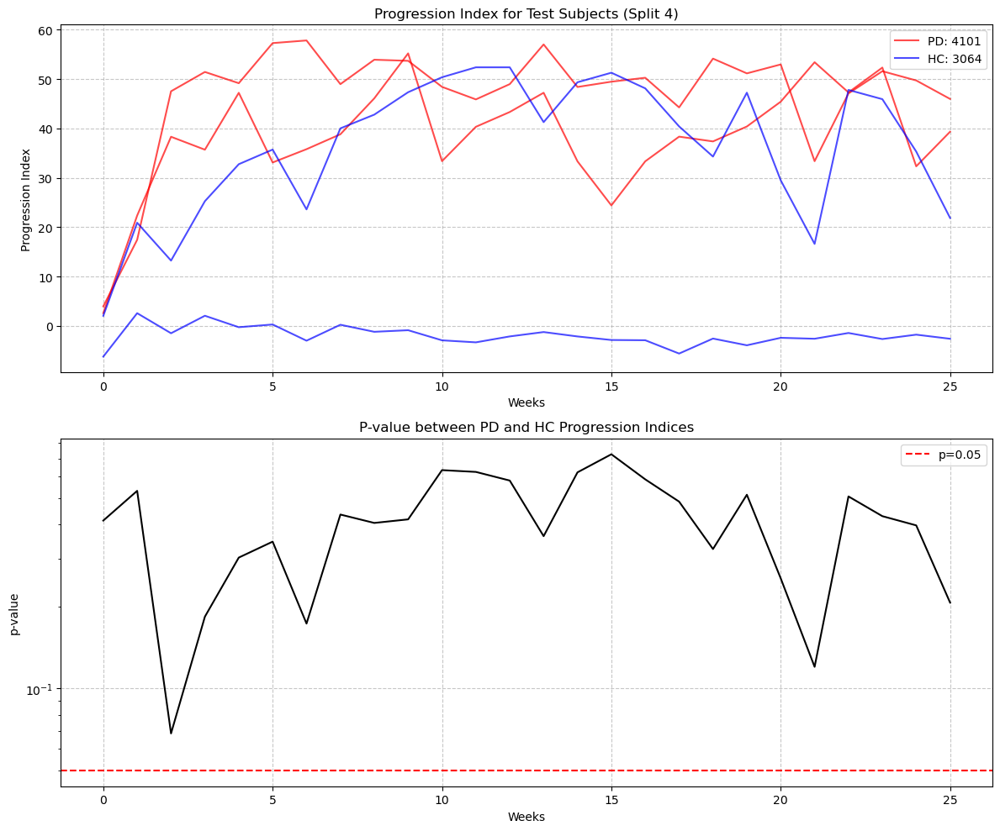


Outer loop 5/20
Training until convergence...
Epoch [100/20000], Loss: -5939.3428
Epoch [200/20000], Loss: -10034.9814
Epoch [300/20000], Loss: -8326.6016
Epoch [400/20000], Loss: -10734.9014
Epoch [500/20000], Loss: -13149.2158
Epoch [600/20000], Loss: -12868.2256
Epoch [700/20000], Loss: -15423.0420
Epoch [800/20000], Loss: -16826.0605
Epoch [900/20000], Loss: -16443.1016
Epoch [1000/20000], Loss: -14911.2109
Epoch [1100/20000], Loss: -16079.0254
Converged at epoch 1141 with loss -17179.3506
Final loss: -15739.9990
Training complete


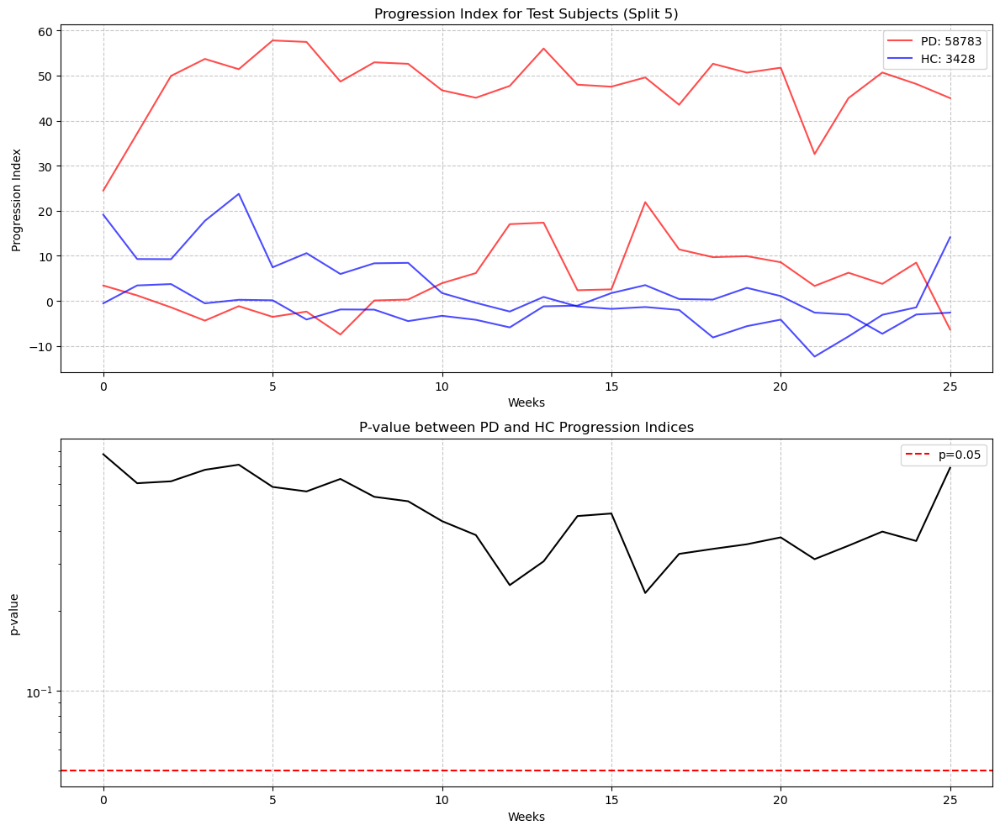


Outer loop 6/20
Training until convergence...
Epoch [100/20000], Loss: -4294.4561
Epoch [200/20000], Loss: -7698.6655
Epoch [300/20000], Loss: -11763.6699
Epoch [400/20000], Loss: -10466.4473
Epoch [500/20000], Loss: -11489.2666
Epoch [600/20000], Loss: -15926.7939
Epoch [700/20000], Loss: -15727.1826
Epoch [800/20000], Loss: -15129.4678
Epoch [900/20000], Loss: -15918.4150
Epoch [1000/20000], Loss: -16608.5020
Epoch [1100/20000], Loss: -16705.0020
Epoch [1200/20000], Loss: -16982.0078
Epoch [1300/20000], Loss: -18547.3281
Epoch [1400/20000], Loss: -17333.1055
Epoch [1500/20000], Loss: -16078.5273
Epoch [1600/20000], Loss: -17644.9883
Epoch [1700/20000], Loss: -17831.3574
Epoch [1800/20000], Loss: -17131.7090
Epoch [1900/20000], Loss: -16662.1387
Epoch [2000/20000], Loss: -17214.4707
Epoch [2100/20000], Loss: -18030.1875
Epoch [2200/20000], Loss: -18711.1289
Epoch [2300/20000], Loss: -18205.3066
Epoch [2400/20000], Loss: -18419.7051
Epoch [2500/20000], Loss: -18256.5215
Epoch [2600/20

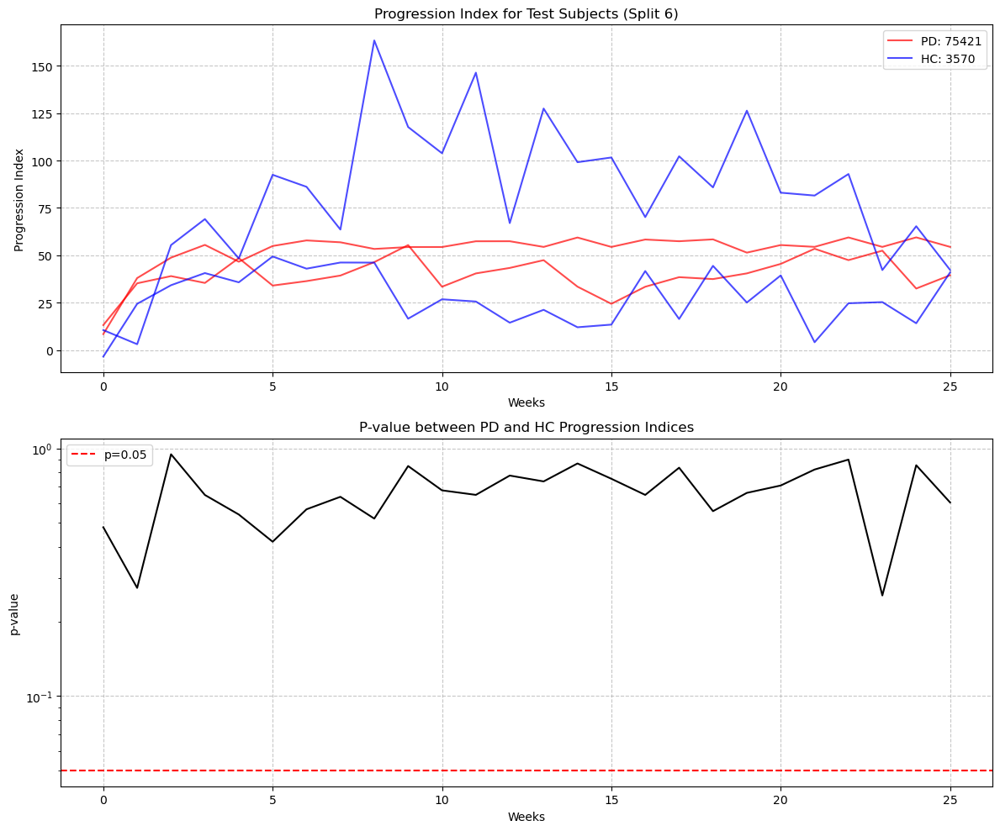


Outer loop 7/20
Training until convergence...
Epoch [100/20000], Loss: -3740.7734
Epoch [200/20000], Loss: -6528.1211
Epoch [300/20000], Loss: -12394.5986
Epoch [400/20000], Loss: -15896.2021
Epoch [500/20000], Loss: -13649.2109
Epoch [600/20000], Loss: -12533.0557
Epoch [700/20000], Loss: -16750.5371
Epoch [800/20000], Loss: -17887.3652
Epoch [900/20000], Loss: -16635.2324
Epoch [1000/20000], Loss: -15316.6426
Epoch [1100/20000], Loss: -18184.5234
Epoch [1200/20000], Loss: -16294.4033
Epoch [1300/20000], Loss: -16175.6934
Epoch [1400/20000], Loss: -18243.3301
Epoch [1500/20000], Loss: -19075.7031
Epoch [1600/20000], Loss: -18549.7148
Epoch [1700/20000], Loss: -19305.6348
Epoch [1800/20000], Loss: -19473.0469
Epoch [1900/20000], Loss: -18431.5547
Epoch [2000/20000], Loss: -18739.7246
Epoch [2100/20000], Loss: -17232.3652
Epoch [2200/20000], Loss: -10824.9258
Epoch [2300/20000], Loss: -17284.6562
Epoch [2400/20000], Loss: -8248.3389
Epoch [2500/20000], Loss: -11382.9189
Epoch [2600/200

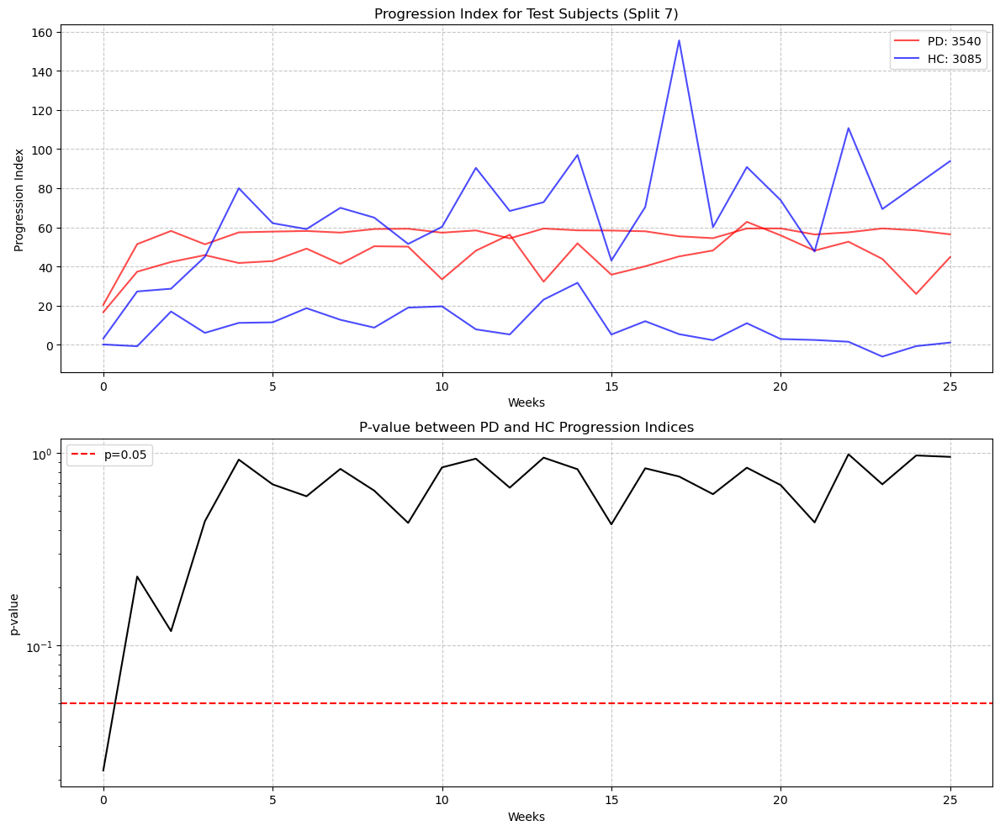


Outer loop 8/20
Training until convergence...
Epoch [100/20000], Loss: -5102.4932
Epoch [200/20000], Loss: -5920.6265
Epoch [300/20000], Loss: -12748.5205
Epoch [400/20000], Loss: -15154.5205
Epoch [500/20000], Loss: -14833.8037
Epoch [600/20000], Loss: -16275.3848
Epoch [700/20000], Loss: -15178.8369
Epoch [800/20000], Loss: -17289.7852
Epoch [900/20000], Loss: -16948.4727
Epoch [1000/20000], Loss: -15544.5312
Epoch [1100/20000], Loss: -12831.5195
Epoch [1200/20000], Loss: -16796.5234
Epoch [1300/20000], Loss: -17373.0000
Epoch [1400/20000], Loss: -17139.6445
Epoch [1500/20000], Loss: -15480.9082
Epoch [1600/20000], Loss: -15303.8369
Epoch [1700/20000], Loss: -18909.5664
Epoch [1800/20000], Loss: -17439.8691
Converged at epoch 1851 with loss -17502.4996
Final loss: -17097.4297
Training complete


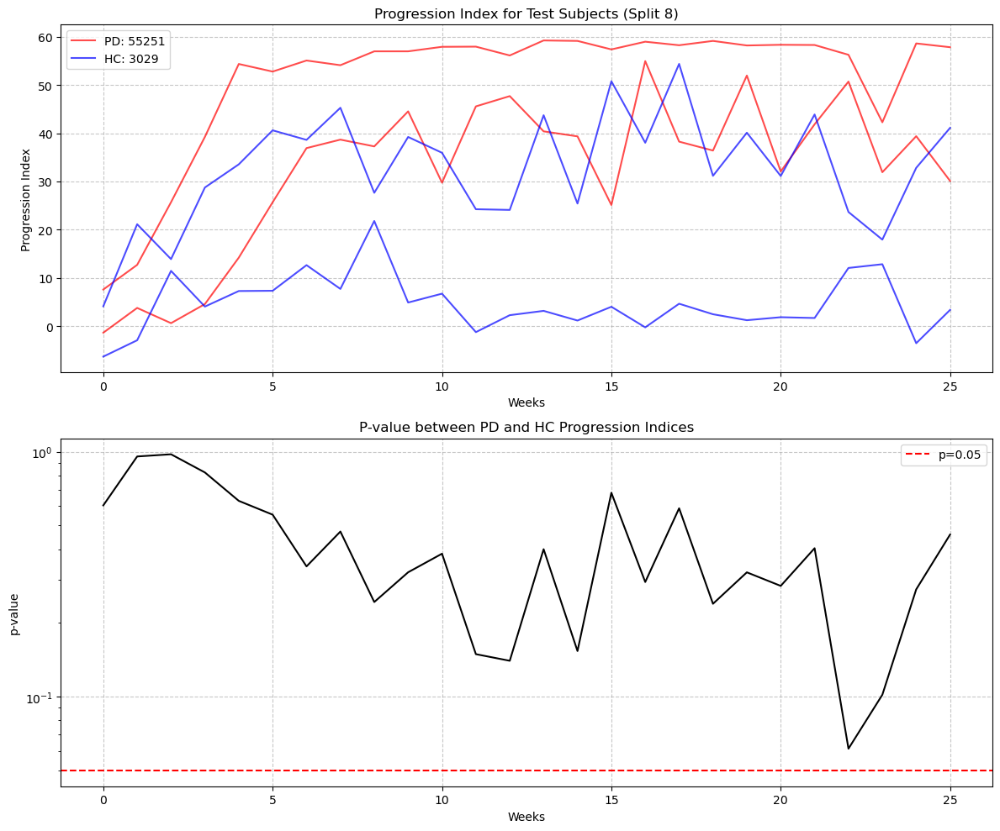


Outer loop 9/20
Training until convergence...
Epoch [100/20000], Loss: -9470.0635
Epoch [200/20000], Loss: -7446.2031
Epoch [300/20000], Loss: -9194.4492
Epoch [400/20000], Loss: -11518.0176
Epoch [500/20000], Loss: -11227.1387
Epoch [600/20000], Loss: -13594.6348
Epoch [700/20000], Loss: -15311.4785
Epoch [800/20000], Loss: -15913.1855
Epoch [900/20000], Loss: -16670.1777
Epoch [1000/20000], Loss: -16759.2129
Epoch [1100/20000], Loss: -16078.5859
Epoch [1200/20000], Loss: -17331.9355
Epoch [1300/20000], Loss: -16978.9883
Epoch [1400/20000], Loss: -16695.6426
Epoch [1500/20000], Loss: -14649.0566
Epoch [1600/20000], Loss: -17623.0859
Epoch [1700/20000], Loss: -17800.3477
Epoch [1800/20000], Loss: -17679.4824
Epoch [1900/20000], Loss: -16481.2852
Epoch [2000/20000], Loss: -17932.7148
Epoch [2100/20000], Loss: -17292.7930
Converged at epoch 2171 with loss -17722.0566
Final loss: -17370.6426
Training complete


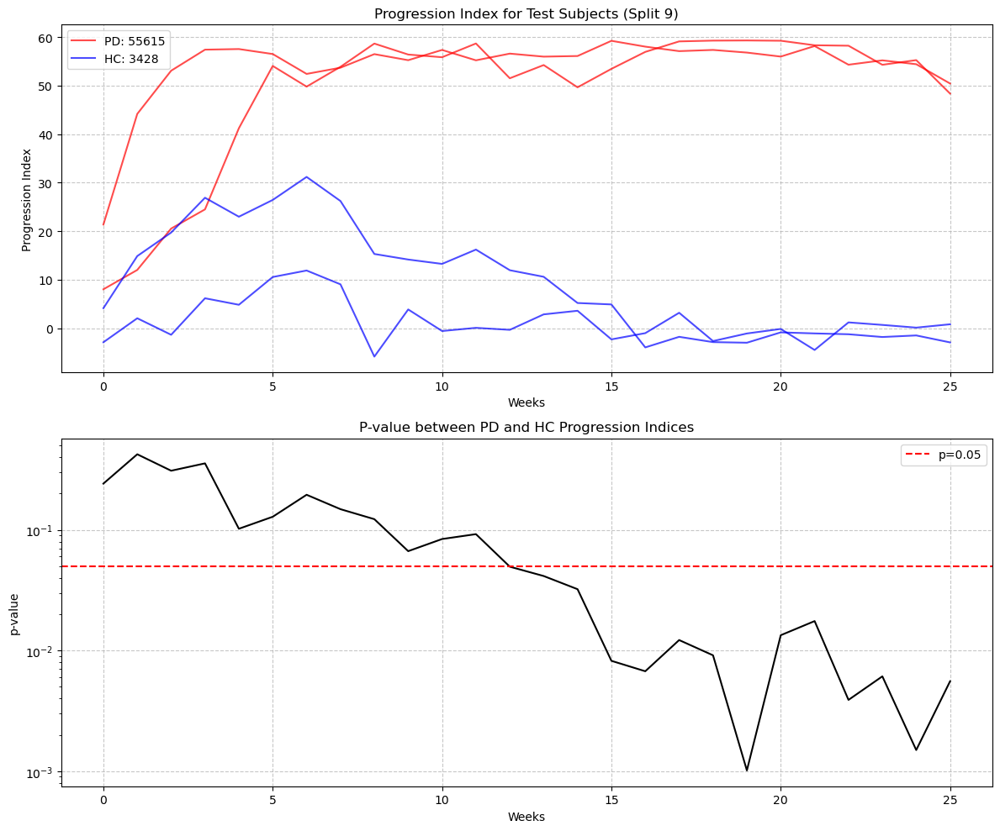


Outer loop 10/20
Training until convergence...
Epoch [100/20000], Loss: -5216.0518
Epoch [200/20000], Loss: -6747.9199
Epoch [300/20000], Loss: -13276.3887
Epoch [400/20000], Loss: -13776.9561
Epoch [500/20000], Loss: -15037.5996
Epoch [600/20000], Loss: -14646.3496
Epoch [700/20000], Loss: -13913.0889
Epoch [800/20000], Loss: -16757.4277
Epoch [900/20000], Loss: -17487.5391
Epoch [1000/20000], Loss: -17083.1094
Epoch [1100/20000], Loss: -16380.6729
Epoch [1200/20000], Loss: -17984.1367
Epoch [1300/20000], Loss: -18933.4531
Epoch [1400/20000], Loss: -17553.6914
Epoch [1500/20000], Loss: -14338.3711
Epoch [1600/20000], Loss: -17946.0391
Converged at epoch 1601 with loss -17676.1871
Final loss: -17973.1875
Training complete


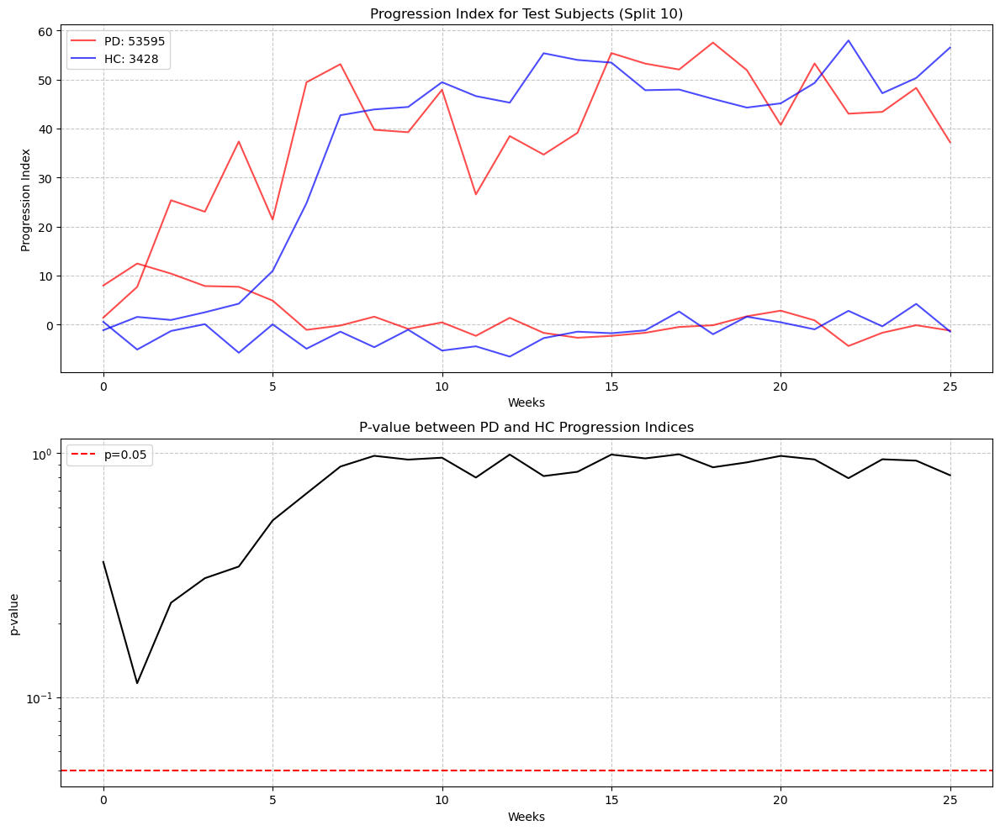


Outer loop 11/20
Training until convergence...
Epoch [100/20000], Loss: -5838.3428
Epoch [200/20000], Loss: -6368.8555
Epoch [300/20000], Loss: -11196.6504
Epoch [400/20000], Loss: -9068.6592
Epoch [500/20000], Loss: -15433.5469
Epoch [600/20000], Loss: -12969.5820
Epoch [700/20000], Loss: -13858.5430
Epoch [800/20000], Loss: -14385.3066
Epoch [900/20000], Loss: -14902.4375
Epoch [1000/20000], Loss: -16476.5918
Epoch [1100/20000], Loss: -18276.4121
Epoch [1200/20000], Loss: -12678.6279
Epoch [1300/20000], Loss: -17724.3477
Epoch [1400/20000], Loss: -16691.8887
Epoch [1500/20000], Loss: -15812.9619
Epoch [1600/20000], Loss: -17505.5566
Epoch [1700/20000], Loss: -17043.3203
Epoch [1800/20000], Loss: -17793.1543
Epoch [1900/20000], Loss: -17296.7012
Epoch [2000/20000], Loss: -18515.4121
Epoch [2100/20000], Loss: -17416.3770
Epoch [2200/20000], Loss: -17857.1816
Epoch [2300/20000], Loss: -18751.4277
Epoch [2400/20000], Loss: -17901.5547
Epoch [2500/20000], Loss: -18856.7324
Epoch [2600/20

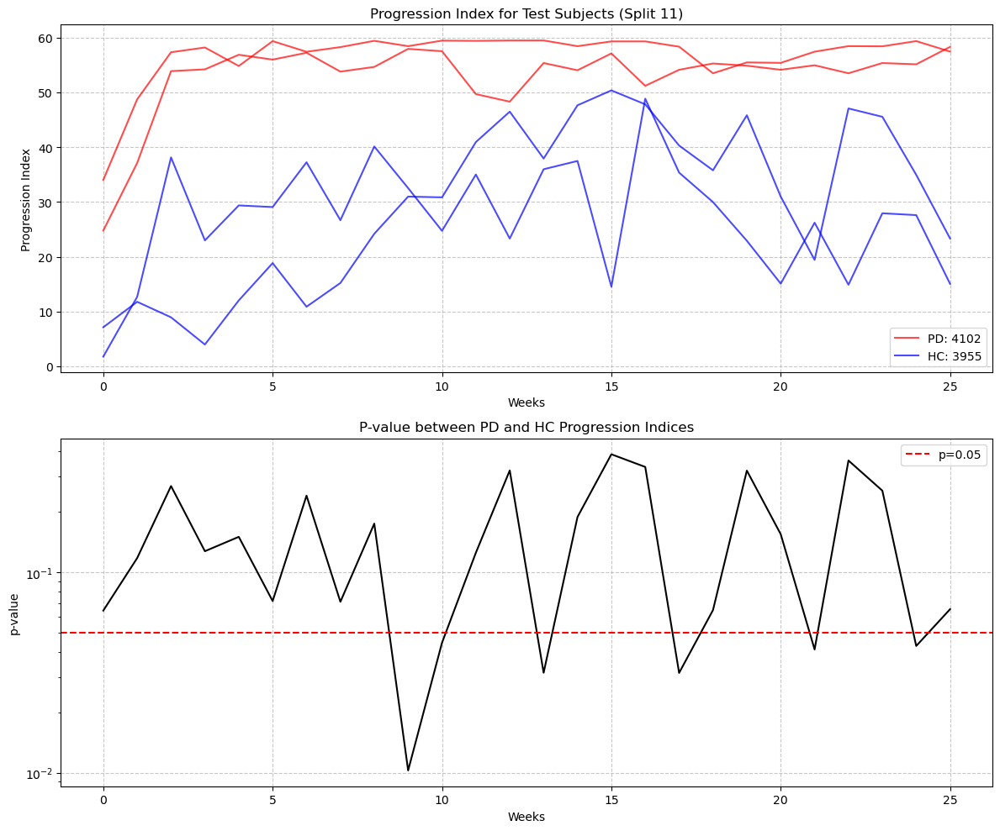


Outer loop 12/20
Training until convergence...
Epoch [100/20000], Loss: -10254.9385
Epoch [200/20000], Loss: -10900.4658
Epoch [300/20000], Loss: -10967.2363
Epoch [400/20000], Loss: -13893.6162
Epoch [500/20000], Loss: -16078.1602
Epoch [600/20000], Loss: -17080.0020
Epoch [700/20000], Loss: -13572.6436
Epoch [800/20000], Loss: -17416.2656
Epoch [900/20000], Loss: -16777.0430
Epoch [1000/20000], Loss: -17606.6094
Epoch [1100/20000], Loss: -17307.6172
Epoch [1200/20000], Loss: -16066.2695
Epoch [1300/20000], Loss: -15359.2988
Epoch [1400/20000], Loss: -17594.9297
Epoch [1500/20000], Loss: -16471.6211
Epoch [1600/20000], Loss: -17532.4961
Epoch [1700/20000], Loss: -18366.7344
Epoch [1800/20000], Loss: -18523.3848
Epoch [1900/20000], Loss: -19082.2910
Epoch [2000/20000], Loss: -17959.8242
Epoch [2100/20000], Loss: -18515.1465
Epoch [2200/20000], Loss: -19335.9746
Epoch [2300/20000], Loss: -17580.1094
Epoch [2400/20000], Loss: -18942.4062
Epoch [2500/20000], Loss: -19681.9531
Epoch [2600

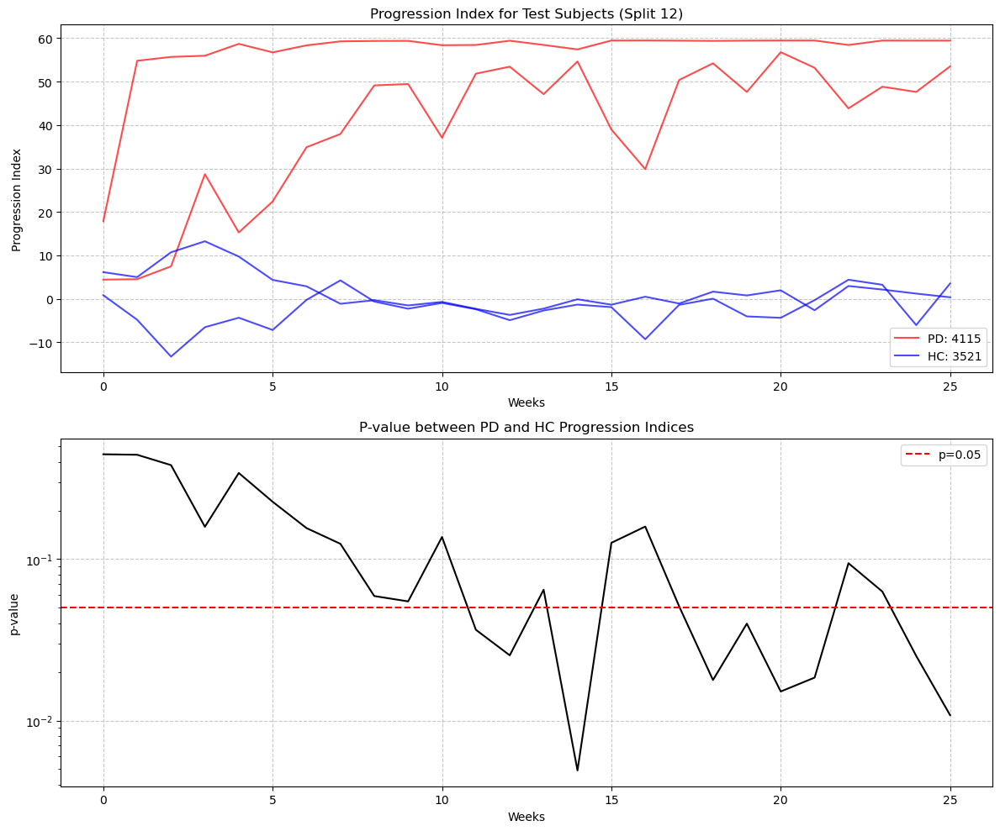


Outer loop 13/20
Training until convergence...
Epoch [100/20000], Loss: -5667.4980
Epoch [200/20000], Loss: -5750.3882
Epoch [300/20000], Loss: -8468.6504
Epoch [400/20000], Loss: -11643.2500
Epoch [500/20000], Loss: -12996.3057
Epoch [600/20000], Loss: -13250.8867
Epoch [700/20000], Loss: -14772.2471
Epoch [800/20000], Loss: -13925.3574
Epoch [900/20000], Loss: -15847.7881
Epoch [1000/20000], Loss: -15949.2842
Epoch [1100/20000], Loss: -14824.7646
Epoch [1200/20000], Loss: -14246.4199
Epoch [1300/20000], Loss: -13641.7158
Epoch [1400/20000], Loss: -17356.8633
Epoch [1500/20000], Loss: -14817.2773
Epoch [1600/20000], Loss: -14969.4492
Epoch [1700/20000], Loss: -19027.8477
Epoch [1800/20000], Loss: -19825.0508
Epoch [1900/20000], Loss: -11512.5195
Epoch [2000/20000], Loss: -18105.3516
Epoch [2100/20000], Loss: -16828.7598
Epoch [2200/20000], Loss: -16401.2676
Epoch [2300/20000], Loss: -18694.3633
Epoch [2400/20000], Loss: -16416.7656
Epoch [2500/20000], Loss: -17708.6191
Epoch [2600/20

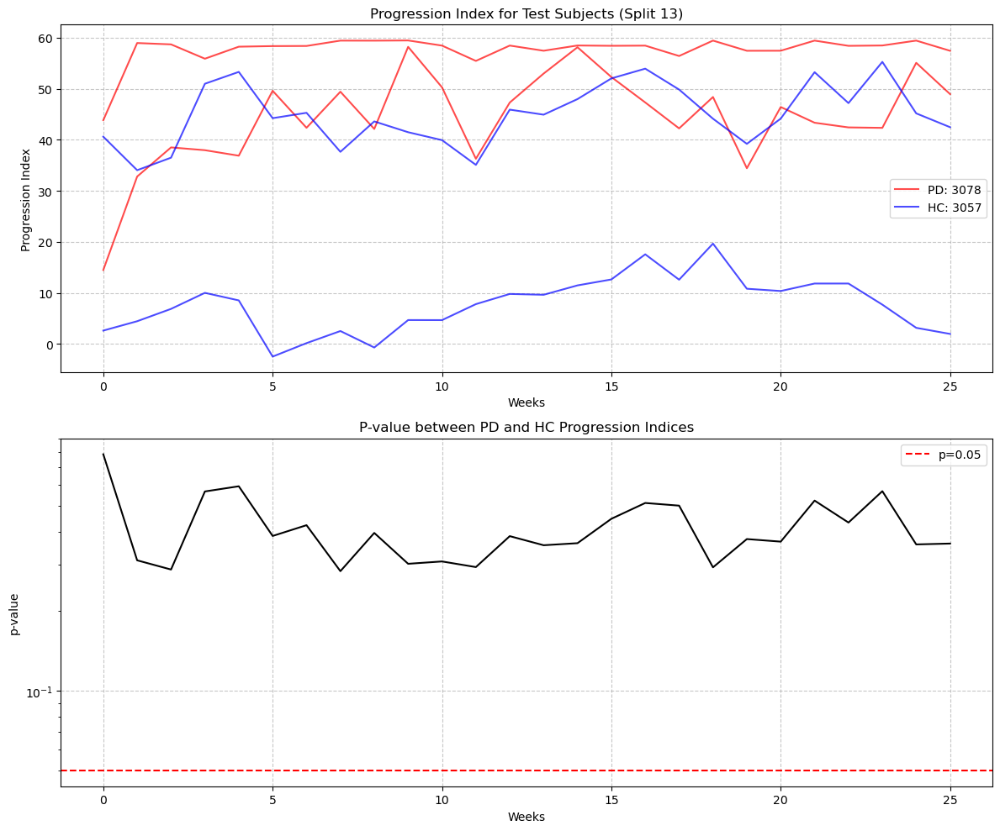


Outer loop 14/20
Training until convergence...
Epoch [100/20000], Loss: -5401.6689
Epoch [200/20000], Loss: -10637.9619
Epoch [300/20000], Loss: -12162.8457
Epoch [400/20000], Loss: -13023.0869
Converged at epoch 411 with loss -14232.6059
Final loss: -12715.6416
Training complete


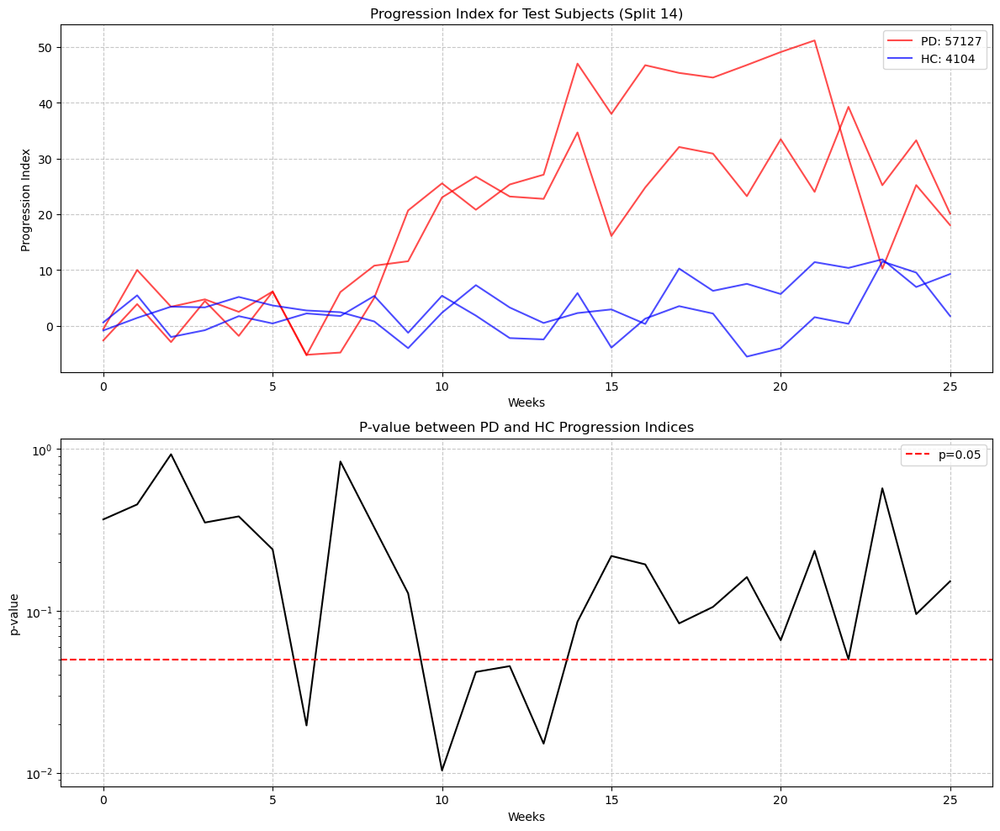


Outer loop 15/20
Training until convergence...
Epoch [100/20000], Loss: -7604.6475
Epoch [200/20000], Loss: -5763.0864
Epoch [300/20000], Loss: -10918.1123
Epoch [400/20000], Loss: -12307.9600
Epoch [500/20000], Loss: -15170.2041
Epoch [600/20000], Loss: -16706.1406
Converged at epoch 611 with loss -14134.5109
Final loss: -16271.1201
Training complete


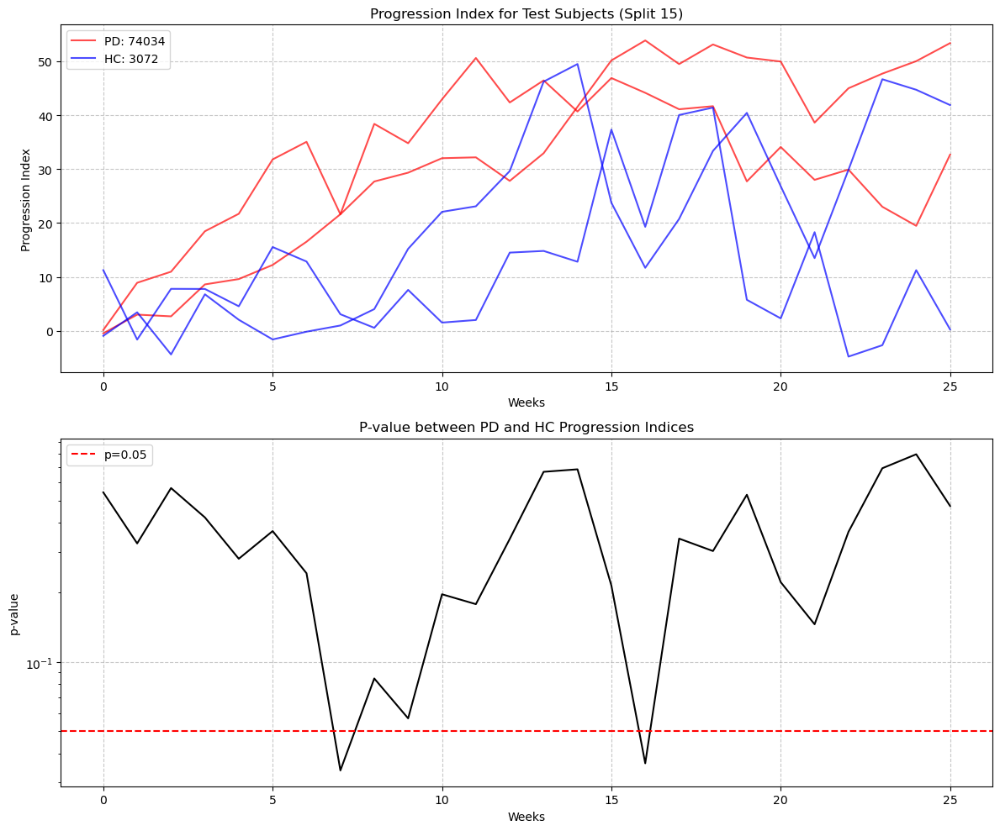


Outer loop 16/20
Training until convergence...
Epoch [100/20000], Loss: -4278.3613
Epoch [200/20000], Loss: -6861.5908
Epoch [300/20000], Loss: -11434.9492
Epoch [400/20000], Loss: -13407.9150
Epoch [500/20000], Loss: -15807.2334
Epoch [600/20000], Loss: -17041.6562
Epoch [700/20000], Loss: -15824.2891
Epoch [800/20000], Loss: -15419.9844
Epoch [900/20000], Loss: -13627.5088
Epoch [1000/20000], Loss: -17274.0059
Converged at epoch 1001 with loss -17550.5434
Final loss: -17307.4004
Training complete


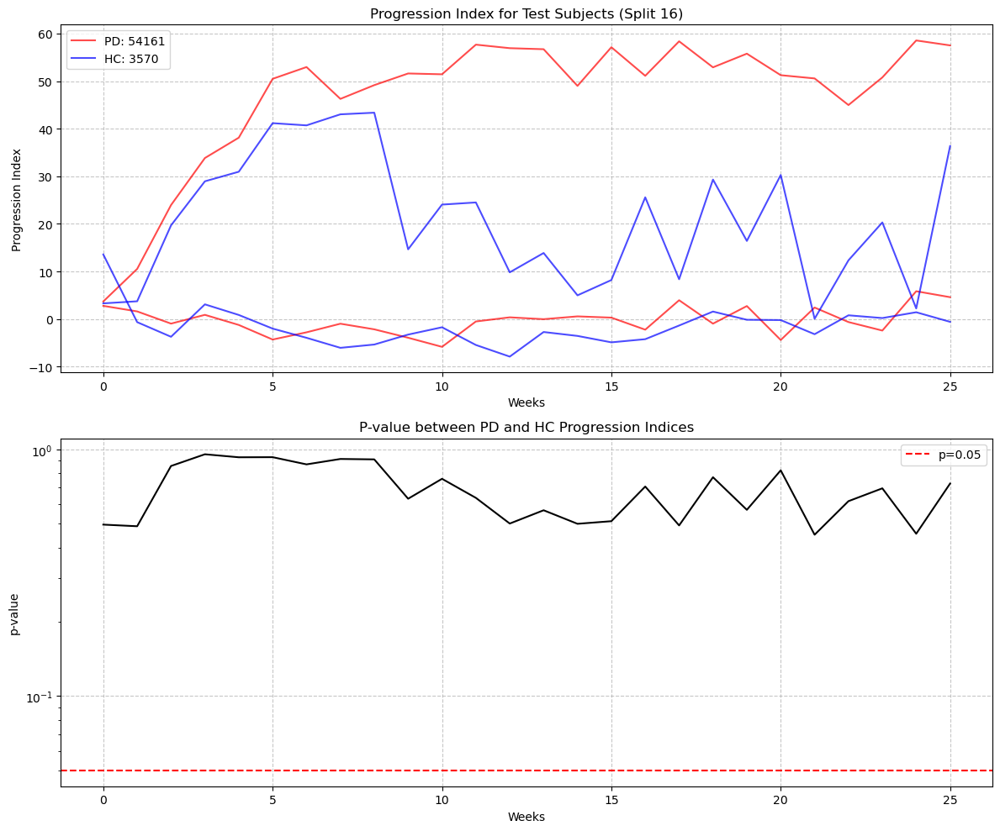


Outer loop 17/20
Training until convergence...
Epoch [100/20000], Loss: -7007.3745
Epoch [200/20000], Loss: -10156.5156
Epoch [300/20000], Loss: -11869.8916
Epoch [400/20000], Loss: -14053.3779
Epoch [500/20000], Loss: -13955.6895
Epoch [600/20000], Loss: -13069.1699
Epoch [700/20000], Loss: -15684.6748
Epoch [800/20000], Loss: -17272.6387
Epoch [900/20000], Loss: -16311.8545
Epoch [1000/20000], Loss: -18491.7461
Epoch [1100/20000], Loss: -17704.1309
Epoch [1200/20000], Loss: -17801.7207
Epoch [1300/20000], Loss: -19066.9570
Epoch [1400/20000], Loss: -19272.4453
Epoch [1500/20000], Loss: -18772.7637
Epoch [1600/20000], Loss: -16706.4082
Epoch [1700/20000], Loss: -17322.9824
Epoch [1800/20000], Loss: -16741.1113
Epoch [1900/20000], Loss: -17410.1289
Epoch [2000/20000], Loss: -17736.0469
Epoch [2100/20000], Loss: -18627.0176
Epoch [2200/20000], Loss: -19315.2773
Epoch [2300/20000], Loss: -16626.6973
Epoch [2400/20000], Loss: -18121.0098
Epoch [2500/20000], Loss: -18603.1660
Epoch [2600/

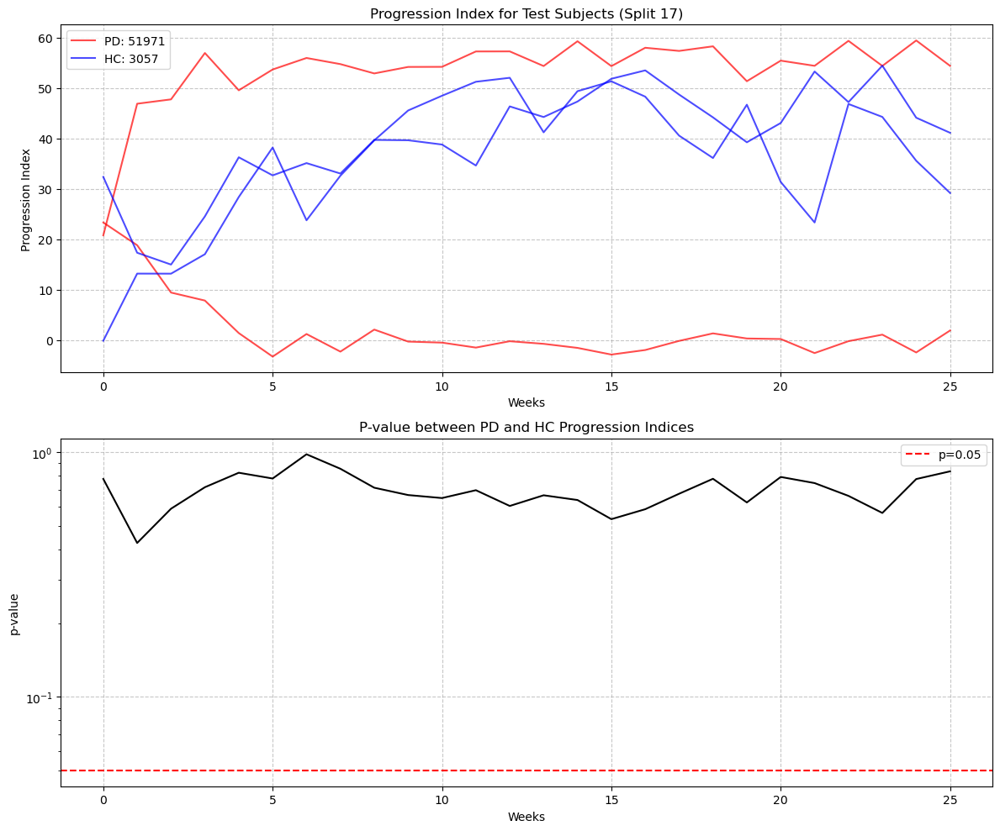


Outer loop 18/20
Training until convergence...
Epoch [100/20000], Loss: -8058.5508
Epoch [200/20000], Loss: -7840.5073
Epoch [300/20000], Loss: -11935.8730
Epoch [400/20000], Loss: -11830.3857
Epoch [500/20000], Loss: -13877.0439
Epoch [600/20000], Loss: -16179.3643
Epoch [700/20000], Loss: -15395.9414
Epoch [800/20000], Loss: -14460.7910
Epoch [900/20000], Loss: -13132.4365
Epoch [1000/20000], Loss: -17003.9863
Epoch [1100/20000], Loss: -14746.3115
Epoch [1200/20000], Loss: -15743.8389
Epoch [1300/20000], Loss: -16110.8916
Epoch [1400/20000], Loss: -16204.4736
Epoch [1500/20000], Loss: -17450.3398
Epoch [1600/20000], Loss: -16008.9854
Epoch [1700/20000], Loss: -16311.9111
Epoch [1800/20000], Loss: -15331.3223
Epoch [1900/20000], Loss: -18078.7637
Epoch [2000/20000], Loss: -17015.4316
Epoch [2100/20000], Loss: -17223.9023
Epoch [2200/20000], Loss: -18511.7246
Epoch [2300/20000], Loss: -17946.1074
Converged at epoch 2341 with loss -17911.0637
Final loss: -18494.6660
Training complete


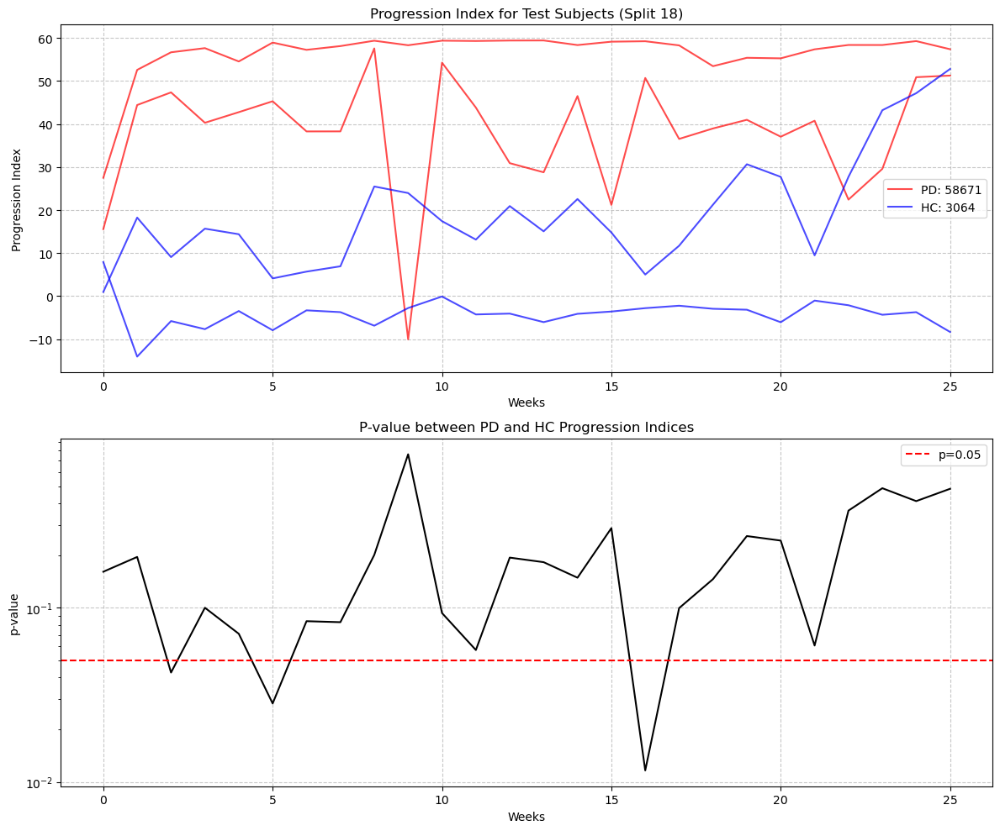


Outer loop 19/20
Training until convergence...
Epoch [100/20000], Loss: -5604.7324
Epoch [200/20000], Loss: -12202.4736
Epoch [300/20000], Loss: -12632.2129
Epoch [400/20000], Loss: -13290.3223
Epoch [500/20000], Loss: -14444.0273
Epoch [600/20000], Loss: -15131.1816
Epoch [700/20000], Loss: -13120.0742
Epoch [800/20000], Loss: -16630.3535
Epoch [900/20000], Loss: -13770.2959
Epoch [1000/20000], Loss: -15811.6953
Epoch [1100/20000], Loss: -17183.9336
Epoch [1200/20000], Loss: -17256.1309
Epoch [1300/20000], Loss: -15930.6309
Epoch [1400/20000], Loss: -17468.8750
Epoch [1500/20000], Loss: -16892.7559
Epoch [1600/20000], Loss: -17394.9629
Epoch [1700/20000], Loss: -16807.4180
Epoch [1800/20000], Loss: -17434.8223
Epoch [1900/20000], Loss: -18458.1680
Epoch [2000/20000], Loss: -19432.1934
Epoch [2100/20000], Loss: -18017.0078
Epoch [2200/20000], Loss: -17957.6172
Epoch [2300/20000], Loss: -18658.7168
Epoch [2400/20000], Loss: -17952.7715
Epoch [2500/20000], Loss: -19147.3906
Epoch [2600/

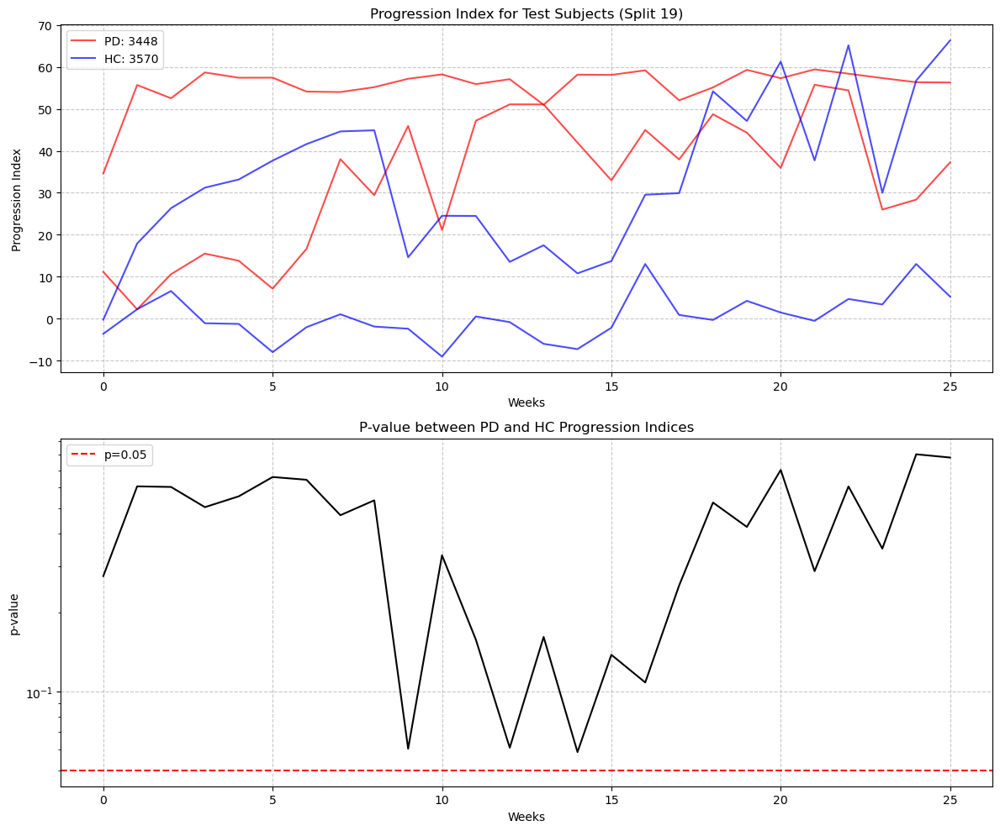


Outer loop 20/20
Training until convergence...
Epoch [100/20000], Loss: -5934.7021
Epoch [200/20000], Loss: -10725.2178
Epoch [300/20000], Loss: -10199.1133
Epoch [400/20000], Loss: -15069.1768
Epoch [500/20000], Loss: -15340.2578
Epoch [600/20000], Loss: -17256.0684
Epoch [700/20000], Loss: -15480.2256
Epoch [800/20000], Loss: -17288.6816
Epoch [900/20000], Loss: -16375.2061
Epoch [1000/20000], Loss: -16181.8643
Epoch [1100/20000], Loss: -18155.9785
Epoch [1200/20000], Loss: -17892.4883
Epoch [1300/20000], Loss: -17553.6133
Epoch [1400/20000], Loss: -18382.3242
Epoch [1500/20000], Loss: -18027.3809
Epoch [1600/20000], Loss: -17475.1992
Epoch [1700/20000], Loss: -18430.5371
Epoch [1800/20000], Loss: -17708.8809
Epoch [1900/20000], Loss: -18723.7832
Converged at epoch 1911 with loss -18426.6383
Final loss: -18994.2207
Training complete


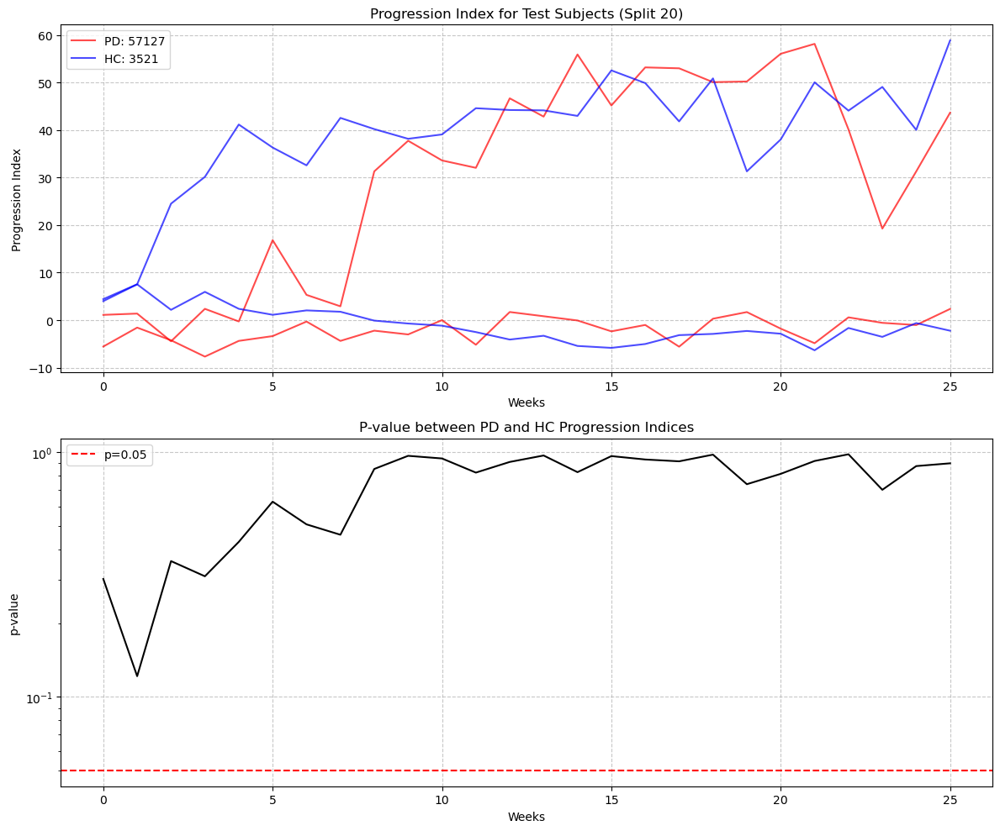


Statistically Significant Windows (p < 0.05):


In [766]:
set_seed(1) 
results = test_model_progression_index(
    LSTMModel, sequences, labels, time_points, subject_ids, num_outer_loops=20)

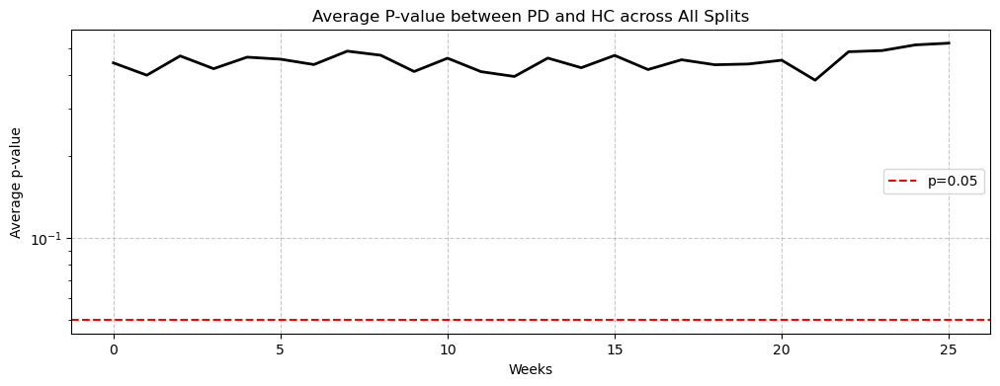


Statistically Significant Windows (p < 0.05):


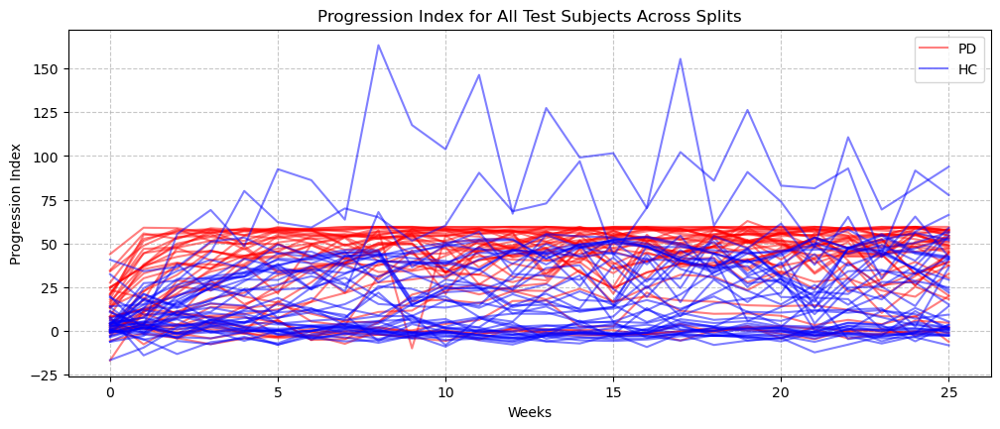

In [767]:
# Visualizations 
all_pd_outputs = results['pd_outputs']
all_hc_outputs = results['hc_outputs']
all_weights = results['weights']
all_pvalues = results['pvalues']
all_avg_pvalues = results['avg_pvalues']
all_sig_windows = results['sig_windows']

# Aggregate results across all splits

# Convert list of arrays to single array
# Handle different shapes by padding to max length
max_weeks = max([arr.shape[0] for arr in all_pd_outputs])

# Average p-values across all splits
all_pvalues_padded = []
for pvals in all_pvalues:
    padded = np.pad(pvals, (0, max_weeks - len(pvals)), 
                    mode='constant', constant_values=np.nan)
    all_pvalues_padded.append(padded)

avg_pvalues = np.nanmean(all_pvalues_padded, axis=0)

# Plot average p-values across all splits
plt.figure(figsize=(12, 4))
plt.plot(avg_pvalues, 'k-', linewidth=2)
plt.axhline(y=0.05, color='r', linestyle='--', label='p=0.05')
plt.xlabel('Weeks')
plt.ylabel('Average p-value')
plt.title('Average P-value between PD and HC across All Splits')
plt.yscale('log')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Calculate statistical significance windows
sig_windows = []
in_window = False
start_week = 0

for week, p in enumerate(avg_pvalues):
    if p < 0.05 and not in_window:
        in_window = True
        start_week = week
    elif p >= 0.05 and in_window:
        in_window = False
        sig_windows.append((start_week, week - 1))

# Handle case where we end in a significant window
if in_window:
    sig_windows.append((start_week, len(avg_pvalues) - 1))

print("\nStatistically Significant Windows (p < 0.05):")
for start, end in sig_windows:
    print(f"Weeks {start} to {end}")

# Plot the outputs for PD and HC cohorts across all splits on a single plot
# Plot one line of each type with labels
plt.figure(figsize=(12, 10))
plt.subplot(2, 1, 1)
if len(all_pd_outputs) > 0 and all_pd_outputs[0].shape[1] > 0:
    plt.plot(all_pd_outputs[0][:, 0], 'r-', alpha=0.5, label='PD')
if len(all_hc_outputs) > 0 and all_hc_outputs[0].shape[1] > 0:
    plt.plot(all_hc_outputs[0][:, 0], 'b-', alpha=0.5, label='HC')
# Then plot the rest without labels
for i in range(len(all_pd_outputs)):
    for j in range(all_pd_outputs[i].shape[1]):
        # Skip the first one we already plotted with a label
        if i == 0 and j == 0:
            continue
        plt.plot(all_pd_outputs[i][:, j], 'r-', alpha=0.5)

for i in range(len(all_hc_outputs)):
    for j in range(all_hc_outputs[i].shape[1]):
        # Skip the first one we already plotted with a label
        if i == 0 and j == 0:
            continue
        plt.plot(all_hc_outputs[i][:, j], 'b-', alpha=0.5)

# Explicitly create the legend with labels
plt.legend()
plt.xlabel('Weeks')
plt.ylabel('Progression Index')
plt.title('Progression Index for All Test Subjects Across Splits')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

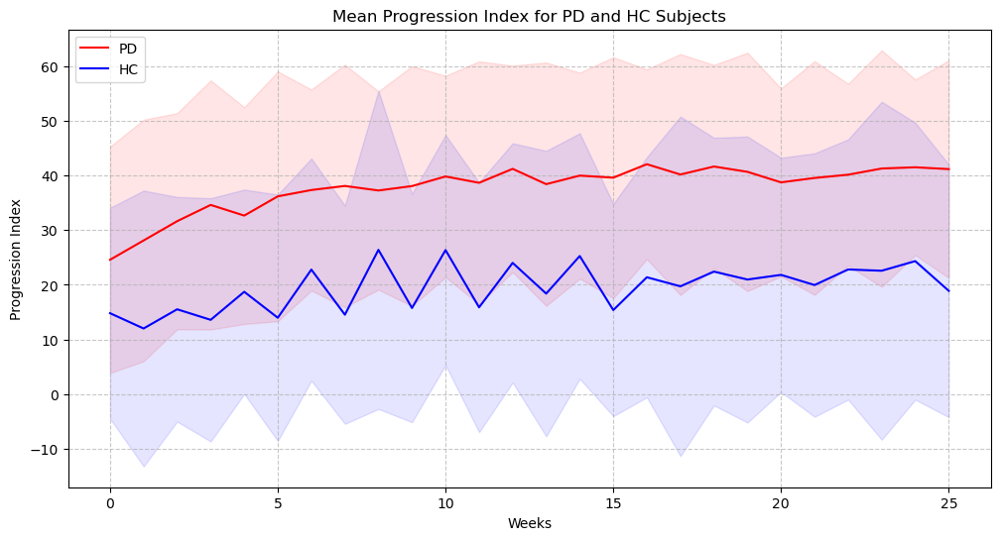

In [768]:
# Reshape to combine splits and subjects
pd_outputs_flat = np.array(all_pd_outputs).reshape(-1, all_pd_outputs[0].shape[0]).T  # Shape: (num_timepoints, num_splits*num_subjects)
hc_outputs_flat = np.array(all_hc_outputs).reshape(-1, all_hc_outputs[0].shape[0]).T  # Shape: (num_timepoints, num_splits*num_subjects)

# Calculate mean and std directly across all splits and subjects
mean_pd_outputs = np.mean(pd_outputs_flat, axis=1)
mean_hc_outputs = np.mean(hc_outputs_flat, axis=1)
std_pd_outputs = np.std(pd_outputs_flat, axis=1)
std_hc_outputs = np.std(hc_outputs_flat, axis=1)

plt.figure(figsize=(12, 6))
plt.plot(mean_pd_outputs, color='red', label='PD')
plt.fill_between(range(len(mean_pd_outputs)), 
                 mean_pd_outputs - std_pd_outputs, 
                 mean_pd_outputs + std_pd_outputs, 
                 color='red', alpha=0.1)
plt.plot(mean_hc_outputs, color='blue', label='HC')
plt.fill_between(range(len(mean_hc_outputs)), 
                 mean_hc_outputs - std_hc_outputs, 
                 mean_hc_outputs + std_hc_outputs, 
                 color='blue', alpha=0.1)
plt.xlabel('Weeks')
plt.ylabel('Progression Index')
plt.title('Mean Progression Index for PD and HC Subjects')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

In [769]:

# Function to visualize weights
def visualize_weights(weights, time_breaks=[5, 10, 15, 20, 25]):
    """
    Visualize model weights at specific time points
    
    Args:
        weights: List of weight arrays for different model runs
        time_breaks: List of time points to visualize
    """
    # Average weights across all runs
    avg_weights = np.mean([w for w in weights], axis=0)
    
    plt.figure(figsize=(15, 10))
    for i, t in enumerate(time_breaks):
        if t < avg_weights.shape[0]:
            plt.subplot(len(time_breaks), 1, i+1)
            
            # Normalize weights at this time point for better visualization
            w_t = avg_weights[t, :, :]
            w_normalized = w_t / np.sum(np.abs(w_t), axis=1, keepdims=True)
            
            plt.imshow(w_normalized, aspect='auto', cmap='coolwarm')
            plt.colorbar(label='Normalized Weight')
            plt.xlabel('Feature (Day of Week)')
            plt.ylabel('Subject')
            plt.title(f'Weights at Week {t}')
    
    plt.tight_layout()
    plt.show()

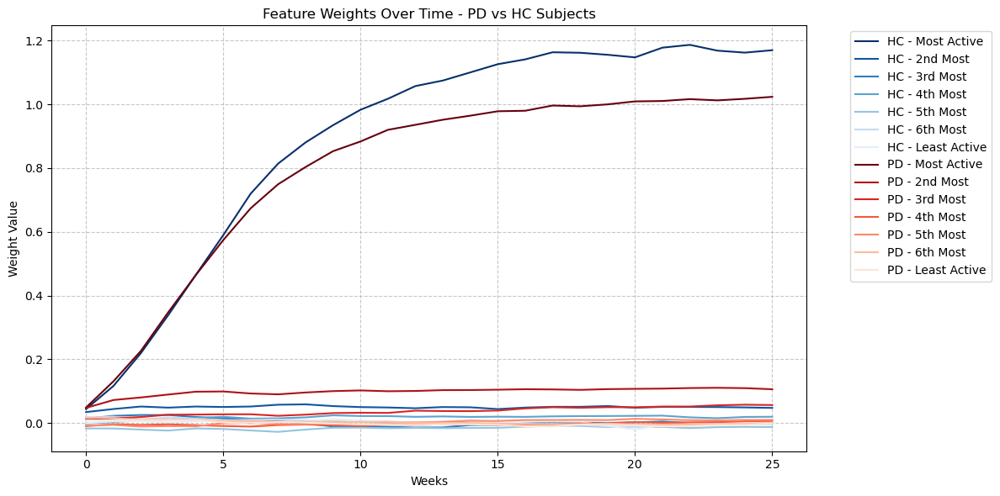

In [770]:
time_breaks=[5, 10, 15, 20, 25]
avg_weights = np.mean([w for w in all_weights], axis=0)
features = ['Most Active', '2nd Most', '3rd Most', '4th Most', '5th Most', '6th Most', 'Least Active']

# line graph of the weights over time for each cohort 
plt.figure(figsize=(12, 6))
colors = plt.cm.Blues(np.linspace(1, 0.1, 7))  # Different blue shades
for i in range(7):
    plt.plot(avg_weights[:, 0, i], label=f'HC - {features[i]}', color=colors[i])
colors = plt.cm.Reds(np.linspace(1, 0.1, 7))  # Different red shades
for i in range(7):  
    plt.plot(avg_weights[:, 1, i], label=f'PD - {features[i]}', color=colors[i])
plt.xlabel('Weeks')
plt.ylabel('Weight Value')
plt.title('Feature Weights Over Time - PD vs HC Subjects')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


In [771]:
# shape of all_weights 
print(np.array(all_weights).shape) # (num_splits, num_weeks, num_subjects, num_features)

(20, 26, 4, 7)


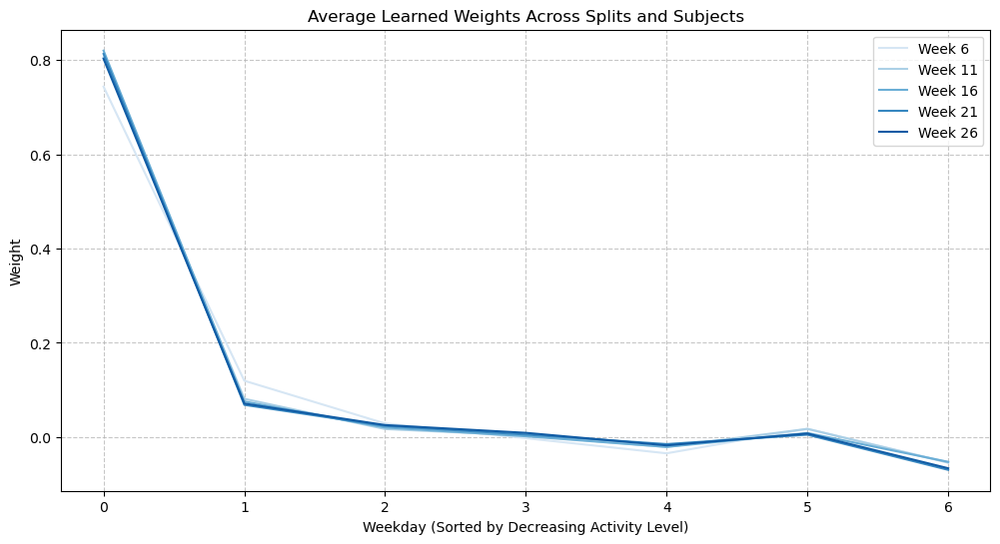

In [772]:
# Get the weights from your results
all_weights = results['weights']  # Shape: (num_splits, num_weeks, num_subjects, num_features)

# Convert to numpy array if it's not already
all_weights_array = np.array(all_weights)

# Calculate mean across both splits and subjects
mean_weights = np.mean(all_weights_array, axis=(0, 2))  # Now shape is (num_weeks, num_features)

# Create a figure
plt.figure(figsize=(12, 6))

# Choose specific weeks to display (from week 5 to 30, in increments of 5)
for i in range(5, 30, 5):
    # Check if we have enough time points
    if i < mean_weights.shape[0]:
        # Extract weights for week i
        tmp = mean_weights[i, :]
        # Normalize weights to sum to 1
        tmp = tmp / np.sum(np.abs(tmp))  # Using abs to handle potential negative weights
        # Plot with a color gradient based on the week number
        plt.plot(tmp, color=plt.cm.Blues(i / 30), label=f'Week {i+1}')

plt.xlabel('Weekday (Sorted by Decreasing Activity Level)')
plt.ylabel('Weight')
plt.title('Average Learned Weights Across Splits and Subjects')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

## 08. now do the same without sorting!

Total subjects: 95
PD subjects: 73
HC subjects: 22

Outer loop 1/20
Training until convergence...
Epoch [100/20000], Loss: -5378.6357
Epoch [200/20000], Loss: -12465.0752
Epoch [300/20000], Loss: -9580.9463
Epoch [400/20000], Loss: -11800.6768
Epoch [500/20000], Loss: -9481.4668
Epoch [600/20000], Loss: -14315.8330
Epoch [700/20000], Loss: -12715.3760
Epoch [800/20000], Loss: -11938.0801
Epoch [900/20000], Loss: -13254.7686
Epoch [1000/20000], Loss: -11782.9854
Epoch [1100/20000], Loss: -13951.1602
Epoch [1200/20000], Loss: -13937.8271
Epoch [1300/20000], Loss: -14010.8340
Epoch [1400/20000], Loss: -14303.6709
Epoch [1500/20000], Loss: -15765.5361
Epoch [1600/20000], Loss: -14525.9785
Epoch [1700/20000], Loss: -13452.9443
Epoch [1800/20000], Loss: -14342.7656
Epoch [1900/20000], Loss: -12891.2158
Epoch [2000/20000], Loss: -13654.4727
Epoch [2100/20000], Loss: -16392.8457
Epoch [2200/20000], Loss: -15228.1162
Epoch [2300/20000], Loss: -15003.2119
Epoch [2400/20000], Loss: -15411.4688
Ep

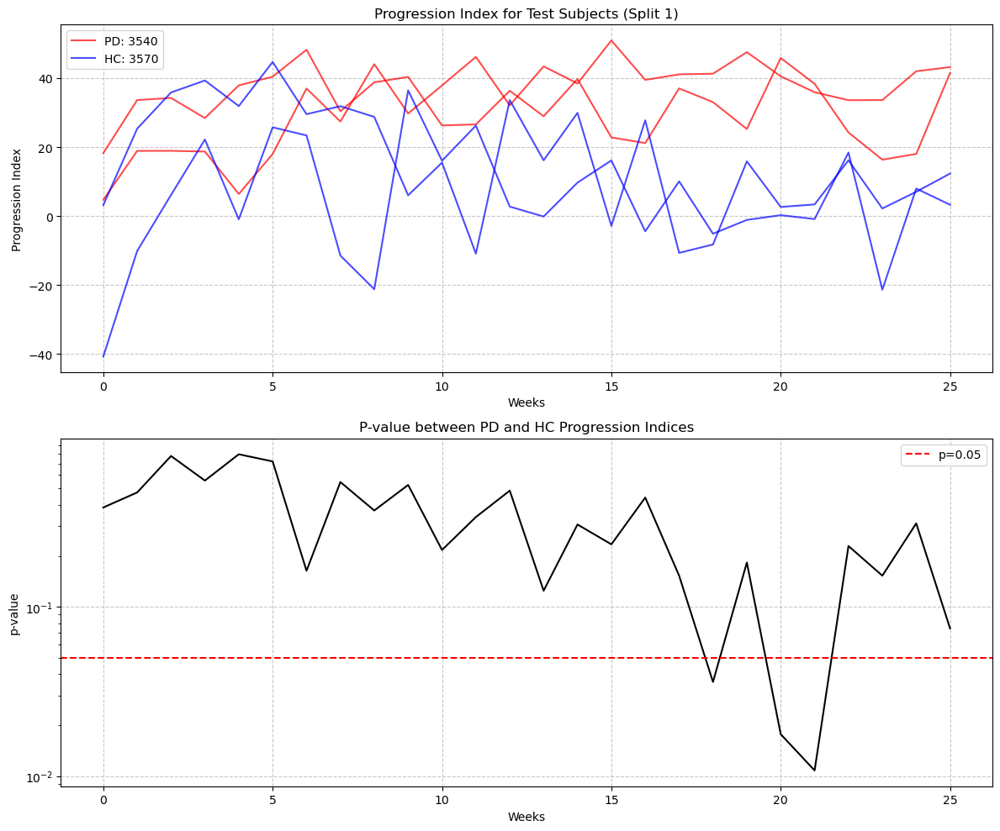


Outer loop 2/20
Training until convergence...
Epoch [100/20000], Loss: -2398.6555
Epoch [200/20000], Loss: -5859.8730
Epoch [300/20000], Loss: -8875.6436
Epoch [400/20000], Loss: -11248.0752
Epoch [500/20000], Loss: -12004.5527
Epoch [600/20000], Loss: -11540.5566
Epoch [700/20000], Loss: -10350.1641
Epoch [800/20000], Loss: -11358.9443
Epoch [900/20000], Loss: -10890.8076
Epoch [1000/20000], Loss: -12208.4980
Epoch [1100/20000], Loss: -12132.0312
Epoch [1200/20000], Loss: -13491.4824
Epoch [1300/20000], Loss: -14101.9609
Epoch [1400/20000], Loss: -14235.2354
Epoch [1500/20000], Loss: -14764.8291
Epoch [1600/20000], Loss: -15732.3691
Epoch [1700/20000], Loss: -14122.5469
Epoch [1800/20000], Loss: -14676.9092
Epoch [1900/20000], Loss: -14498.6836
Epoch [2000/20000], Loss: -15786.5508
Epoch [2100/20000], Loss: -14932.2422
Epoch [2200/20000], Loss: -14038.2275
Epoch [2300/20000], Loss: -15614.5850
Epoch [2400/20000], Loss: -13942.3457
Epoch [2500/20000], Loss: -14943.3652
Epoch [2600/200

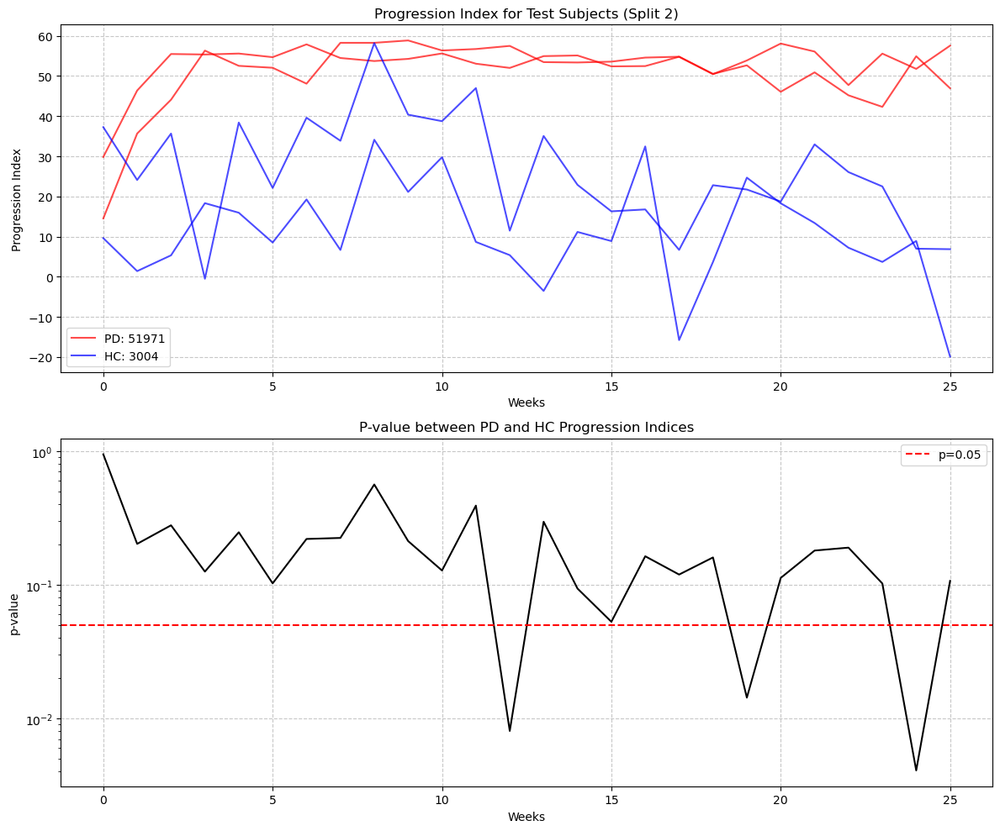


Outer loop 3/20
Training until convergence...
Epoch [100/20000], Loss: -4512.2129
Epoch [200/20000], Loss: -4694.1963
Epoch [300/20000], Loss: -7085.1890
Epoch [400/20000], Loss: -9018.5605
Epoch [500/20000], Loss: -11939.1729
Epoch [600/20000], Loss: -9425.0625
Epoch [700/20000], Loss: -11109.1543
Epoch [800/20000], Loss: -14448.6934
Epoch [900/20000], Loss: -12072.7559
Epoch [1000/20000], Loss: -13641.2510
Epoch [1100/20000], Loss: -12594.4951
Epoch [1200/20000], Loss: -14309.9414
Epoch [1300/20000], Loss: -11312.3242
Epoch [1400/20000], Loss: -12823.0098
Epoch [1500/20000], Loss: -12380.6895
Epoch [1600/20000], Loss: -14265.6523
Epoch [1700/20000], Loss: -13600.1816
Epoch [1800/20000], Loss: -14614.3730
Epoch [1900/20000], Loss: -13662.4922
Epoch [2000/20000], Loss: -13570.9854
Epoch [2100/20000], Loss: -14787.4902
Epoch [2200/20000], Loss: -14177.4287
Epoch [2300/20000], Loss: -14890.8184
Epoch [2400/20000], Loss: -14286.5566
Epoch [2500/20000], Loss: -15218.7979
Epoch [2600/20000

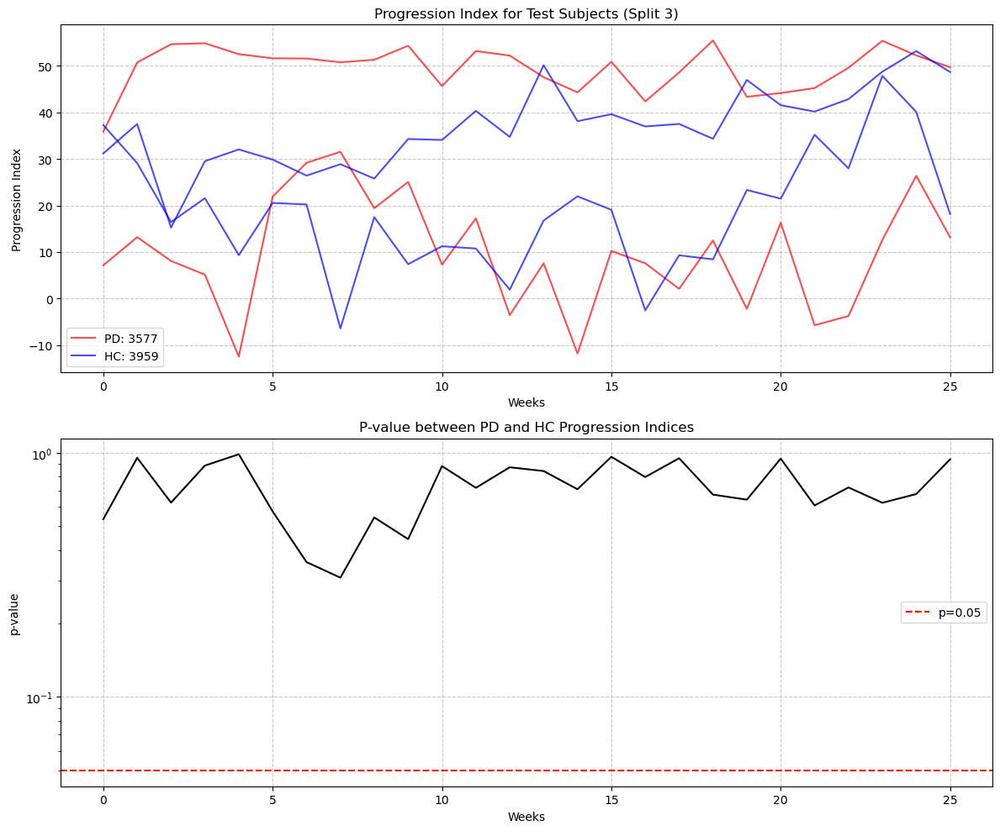


Outer loop 4/20
Training until convergence...
Epoch [100/20000], Loss: -3043.9490
Epoch [200/20000], Loss: -4573.1187
Epoch [300/20000], Loss: -10057.5693
Epoch [400/20000], Loss: -11563.1650
Epoch [500/20000], Loss: -9842.4268
Epoch [600/20000], Loss: -14512.6387
Epoch [700/20000], Loss: -10804.7607
Epoch [800/20000], Loss: -13426.2881
Epoch [900/20000], Loss: -11993.6357
Epoch [1000/20000], Loss: -10999.7559
Epoch [1100/20000], Loss: -14144.2129
Epoch [1200/20000], Loss: -14265.0371
Epoch [1300/20000], Loss: -15206.4717
Epoch [1400/20000], Loss: -14620.5879
Epoch [1500/20000], Loss: -12971.6445
Epoch [1600/20000], Loss: -13033.4707
Epoch [1700/20000], Loss: -12689.1572
Epoch [1800/20000], Loss: -14877.1885
Epoch [1900/20000], Loss: -15205.2373
Epoch [2000/20000], Loss: -15687.7900
Epoch [2100/20000], Loss: -15481.4629
Epoch [2200/20000], Loss: -14587.4541
Epoch [2300/20000], Loss: -15195.6611
Epoch [2400/20000], Loss: -16679.4141
Epoch [2500/20000], Loss: -14271.2334
Epoch [2600/200

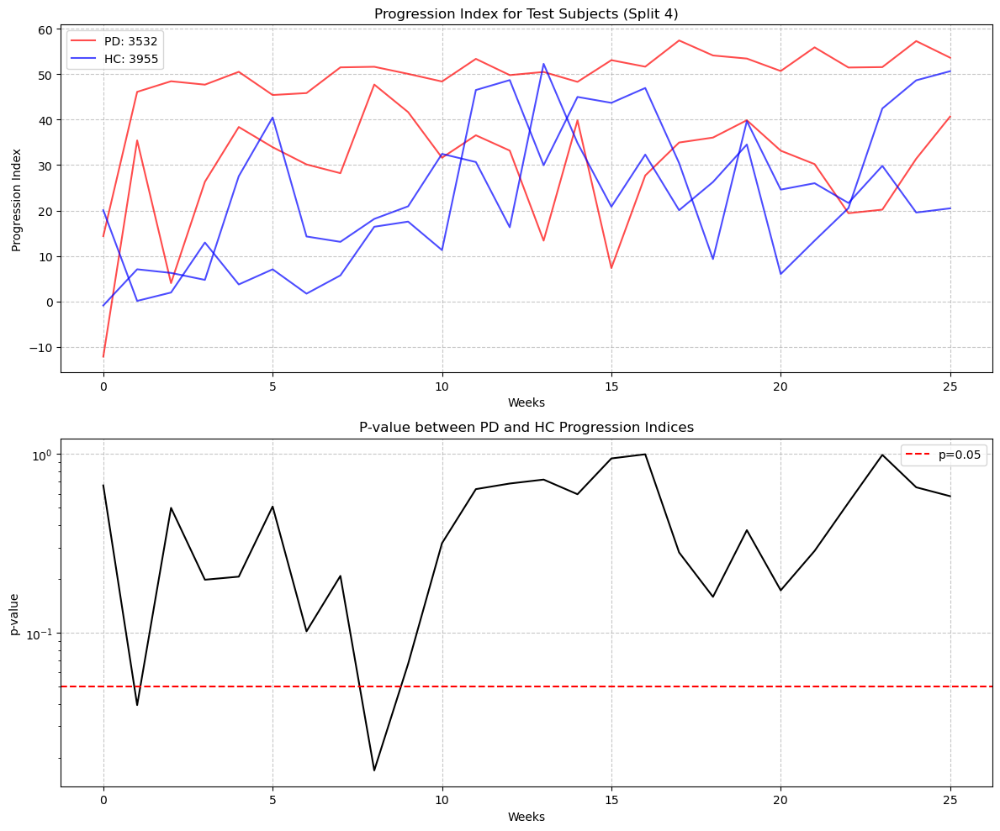


Outer loop 5/20
Training until convergence...
Epoch [100/20000], Loss: 880.5018
Epoch [200/20000], Loss: -3733.8425
Epoch [300/20000], Loss: -6319.9292
Epoch [400/20000], Loss: -10957.3174
Epoch [500/20000], Loss: -10096.4717
Epoch [600/20000], Loss: -12332.4004
Epoch [700/20000], Loss: -12189.3516
Epoch [800/20000], Loss: -10744.2510
Epoch [900/20000], Loss: -11318.9912
Epoch [1000/20000], Loss: -13338.3418
Epoch [1100/20000], Loss: -10788.3594
Epoch [1200/20000], Loss: -13461.8242
Epoch [1300/20000], Loss: -12045.4189
Epoch [1400/20000], Loss: -13943.0420
Epoch [1500/20000], Loss: -11430.1279
Epoch [1600/20000], Loss: -12586.1230
Epoch [1700/20000], Loss: -15605.0479
Epoch [1800/20000], Loss: -15228.6104
Epoch [1900/20000], Loss: -15227.5059
Epoch [2000/20000], Loss: -14652.1699
Epoch [2100/20000], Loss: -15286.2021
Epoch [2200/20000], Loss: -13169.7441
Epoch [2300/20000], Loss: -13066.0107
Epoch [2400/20000], Loss: -13558.2617
Epoch [2500/20000], Loss: -14588.0928
Epoch [2600/20000

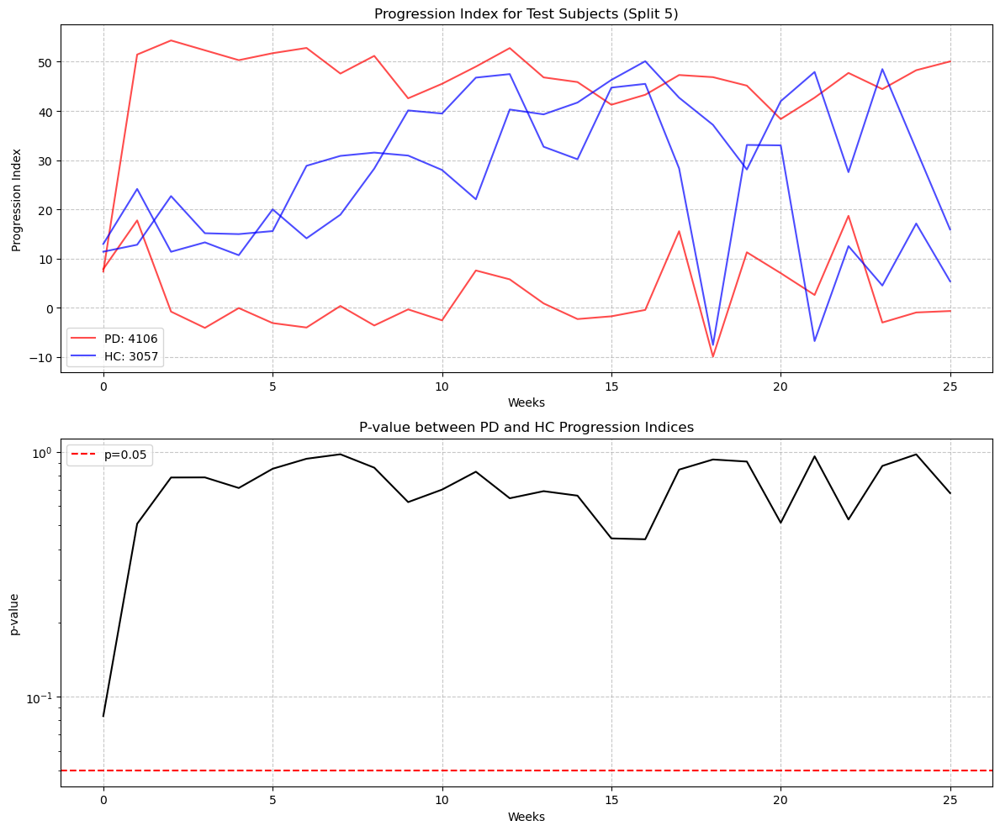


Outer loop 6/20
Training until convergence...
Epoch [100/20000], Loss: -3171.8555
Epoch [200/20000], Loss: -7561.6191
Epoch [300/20000], Loss: -8512.2979
Epoch [400/20000], Loss: -10713.0928
Epoch [500/20000], Loss: -12540.5830
Epoch [600/20000], Loss: -12149.0205
Epoch [700/20000], Loss: -13885.5811
Epoch [800/20000], Loss: -14423.5625
Epoch [900/20000], Loss: -12367.2344
Epoch [1000/20000], Loss: -12013.4209
Epoch [1100/20000], Loss: -12927.4463
Epoch [1200/20000], Loss: -12625.0225
Epoch [1300/20000], Loss: -13664.2842
Epoch [1400/20000], Loss: -13688.5322
Epoch [1500/20000], Loss: -13494.9863
Epoch [1600/20000], Loss: -13348.9834
Epoch [1700/20000], Loss: -14828.0078
Epoch [1800/20000], Loss: -14026.4551
Epoch [1900/20000], Loss: -14036.3047
Epoch [2000/20000], Loss: -14092.9072
Epoch [2100/20000], Loss: -14727.2734
Epoch [2200/20000], Loss: -17310.1152
Epoch [2300/20000], Loss: -13582.9922
Epoch [2400/20000], Loss: -13903.5449
Epoch [2500/20000], Loss: -14637.5264
Epoch [2600/200

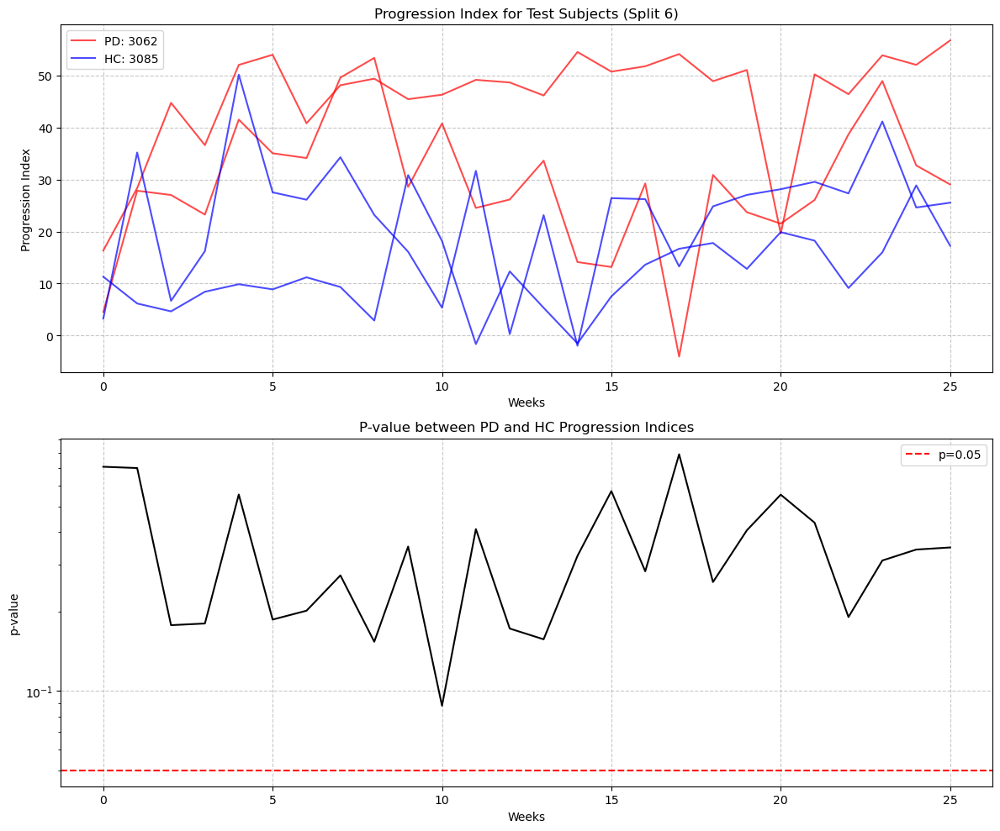


Outer loop 7/20
Training until convergence...
Epoch [100/20000], Loss: -809.2277
Epoch [200/20000], Loss: -6553.3862
Epoch [300/20000], Loss: -10649.9727
Epoch [400/20000], Loss: -11680.4697
Epoch [500/20000], Loss: -13319.2334
Epoch [600/20000], Loss: -13758.9834
Epoch [700/20000], Loss: -11495.9932
Epoch [800/20000], Loss: -13476.4287
Epoch [900/20000], Loss: -14070.3887
Epoch [1000/20000], Loss: -15153.3027
Epoch [1100/20000], Loss: -13530.3701
Epoch [1200/20000], Loss: -11955.8213
Epoch [1300/20000], Loss: -12471.4365
Epoch [1400/20000], Loss: -14112.1104
Epoch [1500/20000], Loss: -13875.3242
Epoch [1600/20000], Loss: -14483.6514
Epoch [1700/20000], Loss: -13868.5107
Epoch [1800/20000], Loss: -13694.6523
Epoch [1900/20000], Loss: -14184.3916
Epoch [2000/20000], Loss: -14907.9775
Epoch [2100/20000], Loss: -14407.9990
Epoch [2200/20000], Loss: -13594.0352
Epoch [2300/20000], Loss: -15082.3203
Epoch [2400/20000], Loss: -14756.5518
Epoch [2500/20000], Loss: -15360.3604
Epoch [2600/200

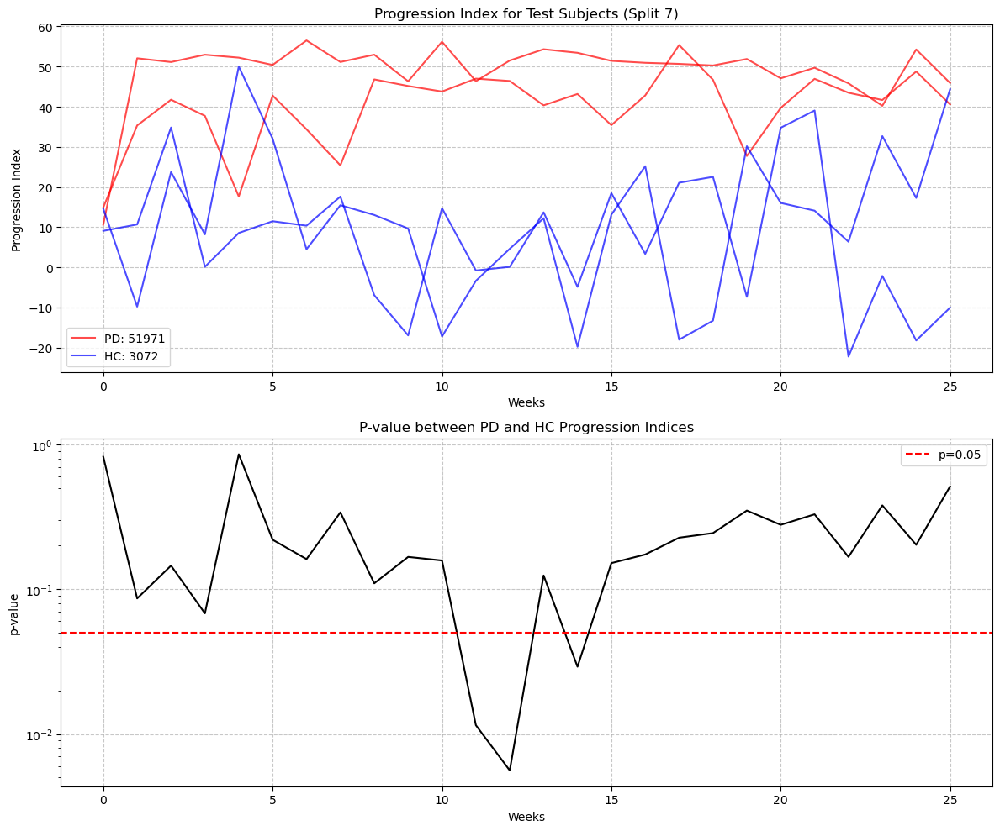


Outer loop 8/20
Training until convergence...
Epoch [100/20000], Loss: -641.7610
Epoch [200/20000], Loss: -1226.5005
Epoch [300/20000], Loss: -9378.2842
Epoch [400/20000], Loss: -12027.3672
Epoch [500/20000], Loss: -9294.1152
Epoch [600/20000], Loss: -10518.2715
Epoch [700/20000], Loss: -10034.6094
Epoch [800/20000], Loss: -10746.8711
Epoch [900/20000], Loss: -12013.4385
Epoch [1000/20000], Loss: -11857.1953
Epoch [1100/20000], Loss: -13317.5479
Epoch [1200/20000], Loss: -13151.0391
Epoch [1300/20000], Loss: -13417.6133
Epoch [1400/20000], Loss: -14205.5127
Epoch [1500/20000], Loss: -13861.3818
Epoch [1600/20000], Loss: -12163.0918
Epoch [1700/20000], Loss: -15485.3340
Epoch [1800/20000], Loss: -15811.8789
Epoch [1900/20000], Loss: -13758.7930
Epoch [2000/20000], Loss: -16336.5273
Epoch [2100/20000], Loss: -13753.8271
Epoch [2200/20000], Loss: -14200.4775
Epoch [2300/20000], Loss: -15985.2773
Epoch [2400/20000], Loss: -15433.1865
Epoch [2500/20000], Loss: -14852.2002
Epoch [2600/20000

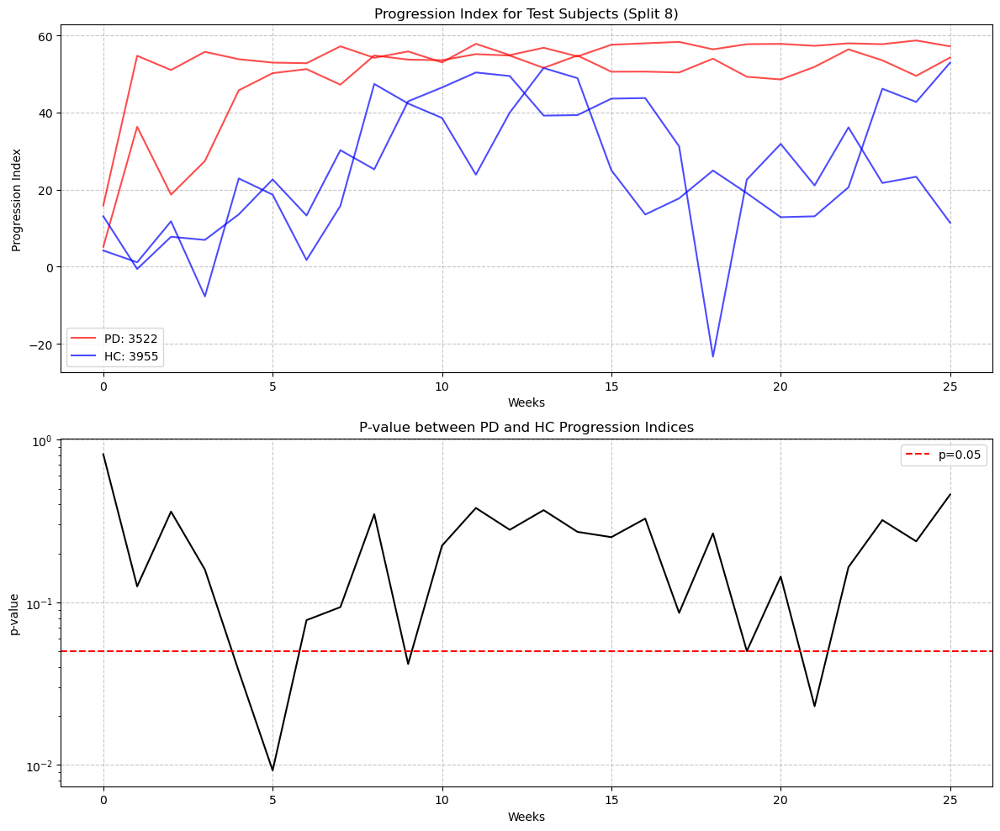


Outer loop 9/20
Training until convergence...
Epoch [100/20000], Loss: -4986.7539
Epoch [200/20000], Loss: -5802.6421
Epoch [300/20000], Loss: -9694.6553
Epoch [400/20000], Loss: -8348.1113
Epoch [500/20000], Loss: -13852.0605
Epoch [600/20000], Loss: -10823.0928
Epoch [700/20000], Loss: -10685.5049
Epoch [800/20000], Loss: -13465.9980
Epoch [900/20000], Loss: -12712.7637
Epoch [1000/20000], Loss: -12594.6865
Epoch [1100/20000], Loss: -12537.5869
Epoch [1200/20000], Loss: -14390.8828
Epoch [1300/20000], Loss: -14604.6953
Epoch [1400/20000], Loss: -13905.6250
Epoch [1500/20000], Loss: -14847.5850
Epoch [1600/20000], Loss: -14377.0693
Epoch [1700/20000], Loss: -15483.0557
Epoch [1800/20000], Loss: -14362.0889
Epoch [1900/20000], Loss: -15089.0703
Epoch [2000/20000], Loss: -17655.8379
Epoch [2100/20000], Loss: -14559.0576
Epoch [2200/20000], Loss: -15451.0986
Epoch [2300/20000], Loss: -14260.4590
Epoch [2400/20000], Loss: -15014.6348
Epoch [2500/20000], Loss: -16483.4434
Epoch [2600/2000

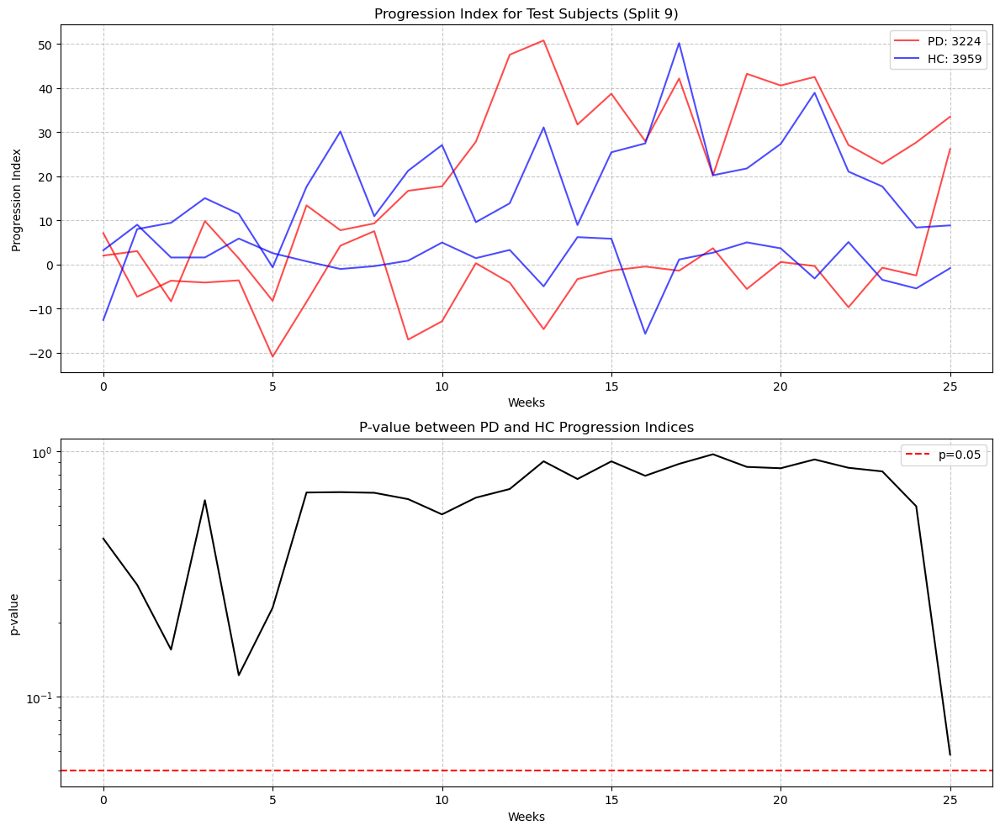


Outer loop 10/20
Training until convergence...
Epoch [100/20000], Loss: -3611.6694
Epoch [200/20000], Loss: -6321.0537
Epoch [300/20000], Loss: -9044.4023
Epoch [400/20000], Loss: -13489.8545
Epoch [500/20000], Loss: -11242.6016
Epoch [600/20000], Loss: -9750.2236
Epoch [700/20000], Loss: -12028.9375
Epoch [800/20000], Loss: -11574.9258
Epoch [900/20000], Loss: -12831.6465
Epoch [1000/20000], Loss: -14447.8291
Epoch [1100/20000], Loss: -13750.8340
Epoch [1200/20000], Loss: -12899.3174
Epoch [1300/20000], Loss: -14062.2646
Epoch [1400/20000], Loss: -13995.0234
Epoch [1500/20000], Loss: -14005.1719
Epoch [1600/20000], Loss: -14144.7354
Epoch [1700/20000], Loss: -12368.8125
Epoch [1800/20000], Loss: -12534.5625
Epoch [1900/20000], Loss: -12960.1250
Epoch [2000/20000], Loss: -14566.3867
Epoch [2100/20000], Loss: -14296.9453
Epoch [2200/20000], Loss: -16226.5879
Epoch [2300/20000], Loss: -14139.6133
Epoch [2400/20000], Loss: -14173.0938
Epoch [2500/20000], Loss: -14887.6279
Epoch [2600/200

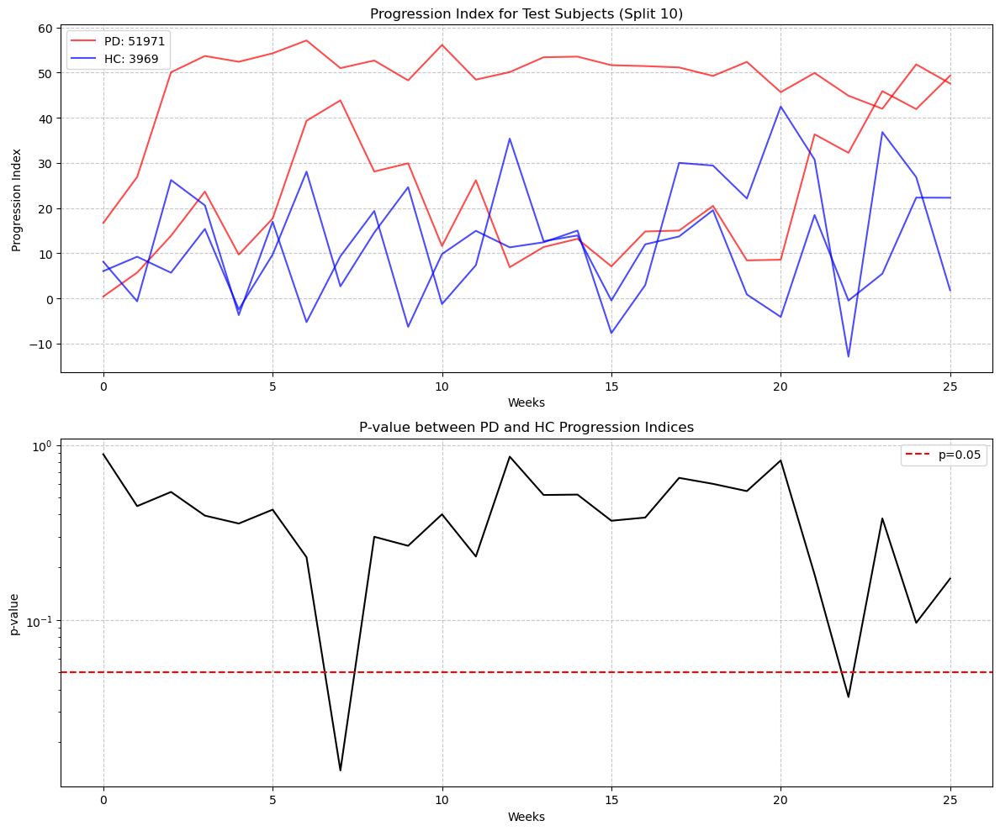


Outer loop 11/20
Training until convergence...
Epoch [100/20000], Loss: 1024.8663
Epoch [200/20000], Loss: -6553.9648
Epoch [300/20000], Loss: -6657.2646
Epoch [400/20000], Loss: -10677.2266
Epoch [500/20000], Loss: -10069.8691
Converged at epoch 551 with loss -11364.8055
Final loss: -11620.4775
Training complete


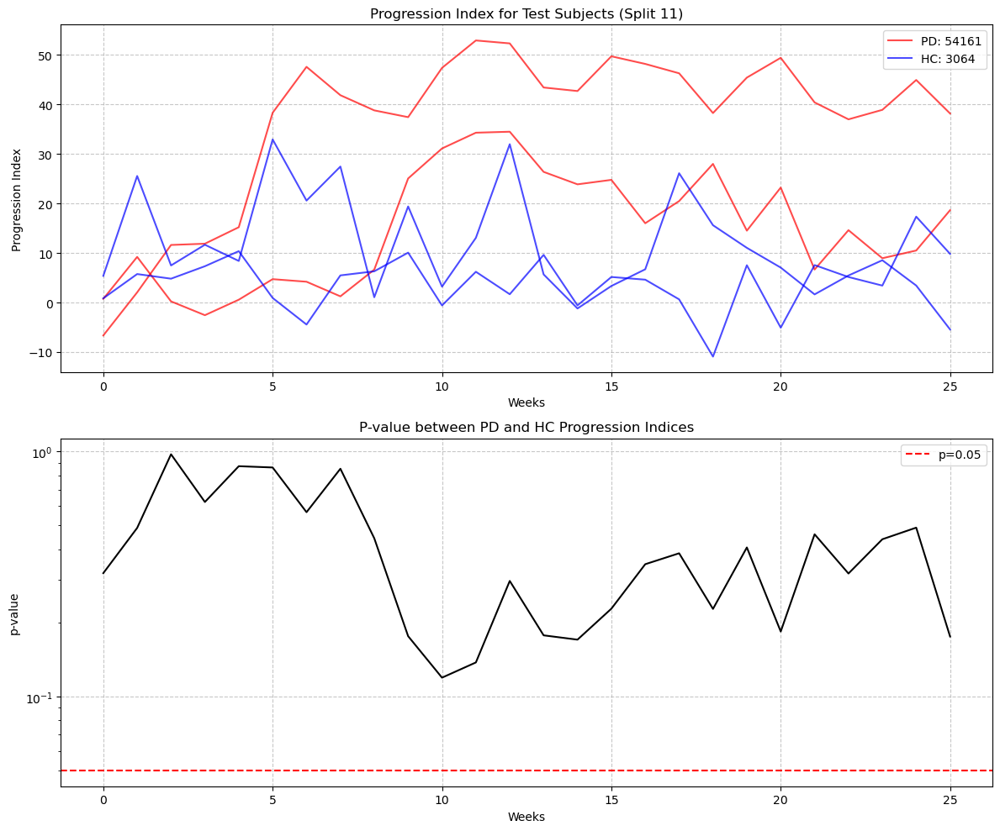


Outer loop 12/20
Training until convergence...
Epoch [100/20000], Loss: -5187.9966
Epoch [200/20000], Loss: -9360.5215
Epoch [300/20000], Loss: -10551.7783
Epoch [400/20000], Loss: -9192.2480
Epoch [500/20000], Loss: -9489.5586
Epoch [600/20000], Loss: -12055.1152
Epoch [700/20000], Loss: -13344.8135
Epoch [800/20000], Loss: -12490.3740
Epoch [900/20000], Loss: -12789.7129
Epoch [1000/20000], Loss: -13689.3066
Epoch [1100/20000], Loss: -11915.6943
Epoch [1200/20000], Loss: -12783.9658
Epoch [1300/20000], Loss: -12652.6348
Epoch [1400/20000], Loss: -13789.3467
Epoch [1500/20000], Loss: -12390.1934
Epoch [1600/20000], Loss: -12517.6182
Epoch [1700/20000], Loss: -13718.9141
Epoch [1800/20000], Loss: -16168.4258
Epoch [1900/20000], Loss: -13522.3936
Epoch [2000/20000], Loss: -14560.6797
Epoch [2100/20000], Loss: -14576.0293
Epoch [2200/20000], Loss: -16060.3125
Epoch [2300/20000], Loss: -14890.6338
Epoch [2400/20000], Loss: -13554.1357
Epoch [2500/20000], Loss: -13984.7529
Epoch [2600/200

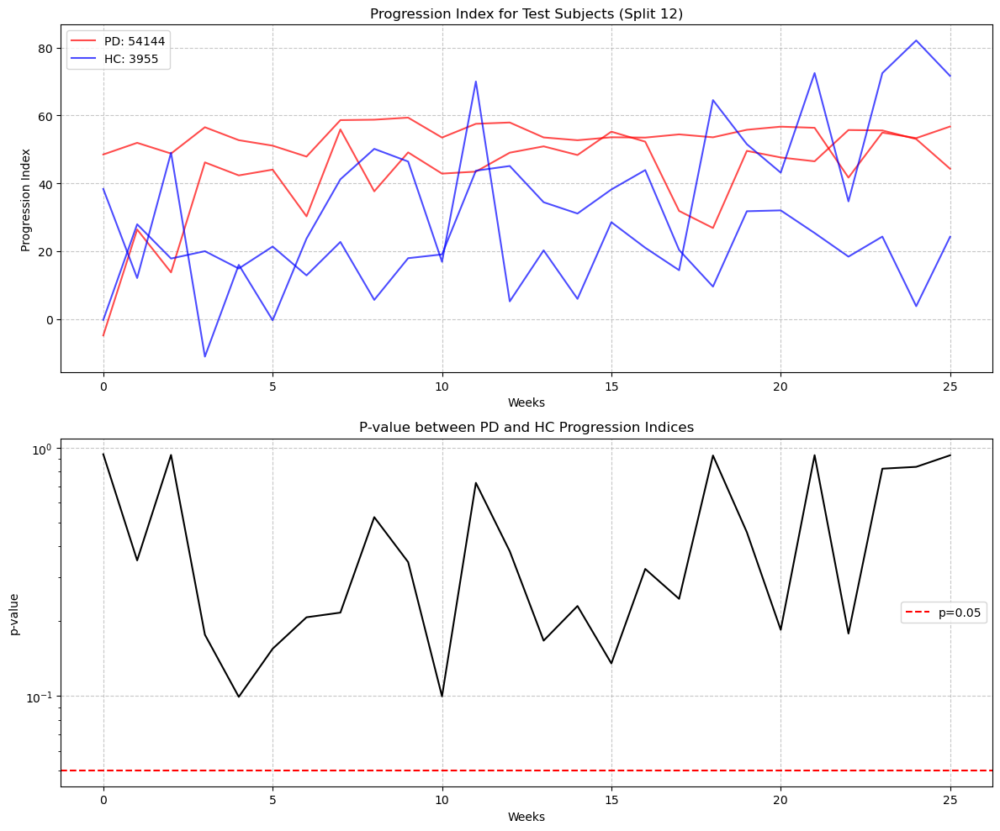


Outer loop 13/20
Training until convergence...
Epoch [100/20000], Loss: -3137.1448
Epoch [200/20000], Loss: -8451.6250
Epoch [300/20000], Loss: -8372.3428
Epoch [400/20000], Loss: -10819.7803
Epoch [500/20000], Loss: -10517.3486
Epoch [600/20000], Loss: -10410.5674
Epoch [700/20000], Loss: -11745.8164
Epoch [800/20000], Loss: -10240.6084
Epoch [900/20000], Loss: -12249.0303
Epoch [1000/20000], Loss: -13365.1152
Epoch [1100/20000], Loss: -13996.4854
Epoch [1200/20000], Loss: -14127.0771
Epoch [1300/20000], Loss: -15019.1533
Epoch [1400/20000], Loss: -14620.1084
Epoch [1500/20000], Loss: -12477.7715
Epoch [1600/20000], Loss: -12909.2354
Epoch [1700/20000], Loss: -13869.7227
Epoch [1800/20000], Loss: -13439.0381
Epoch [1900/20000], Loss: -14195.5088
Epoch [2000/20000], Loss: -16062.2373
Epoch [2100/20000], Loss: -13103.8594
Epoch [2200/20000], Loss: -14542.6963
Epoch [2300/20000], Loss: -15541.6426
Epoch [2400/20000], Loss: -15785.6641
Epoch [2500/20000], Loss: -15782.9824
Epoch [2600/20

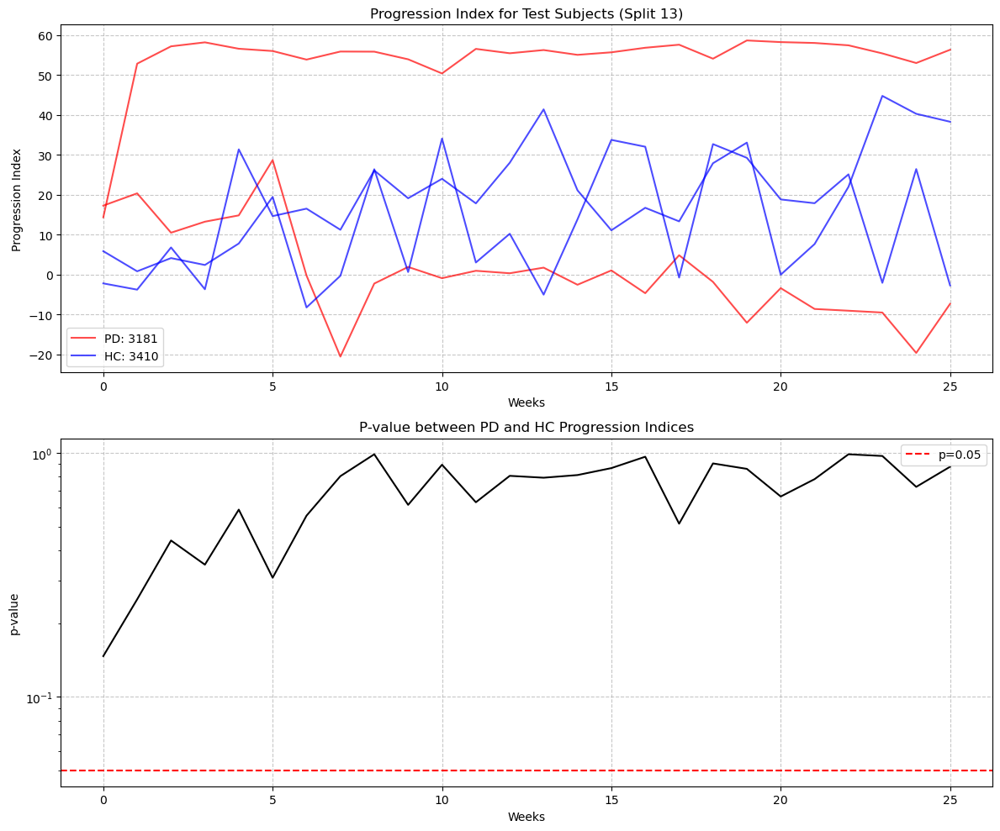


Outer loop 14/20
Training until convergence...
Epoch [100/20000], Loss: -2263.7859
Epoch [200/20000], Loss: -10107.4375
Epoch [300/20000], Loss: -11980.6260
Epoch [400/20000], Loss: -12066.3701
Epoch [500/20000], Loss: -12022.6416
Epoch [600/20000], Loss: -11565.3096
Epoch [700/20000], Loss: -12741.5996
Epoch [800/20000], Loss: -11035.2568
Epoch [900/20000], Loss: -13423.5957
Epoch [1000/20000], Loss: -13059.7852
Epoch [1100/20000], Loss: -13124.4873
Epoch [1200/20000], Loss: -12859.6914
Epoch [1300/20000], Loss: -12609.1895
Epoch [1400/20000], Loss: -13931.8545
Epoch [1500/20000], Loss: -14462.8408
Epoch [1600/20000], Loss: -14630.7979
Epoch [1700/20000], Loss: -12223.5596
Epoch [1800/20000], Loss: -15442.7627
Epoch [1900/20000], Loss: -15921.2539
Epoch [2000/20000], Loss: -14233.5977
Epoch [2100/20000], Loss: -14385.6445
Epoch [2200/20000], Loss: -15343.5156
Epoch [2300/20000], Loss: -14327.6328
Epoch [2400/20000], Loss: -15321.7363
Epoch [2500/20000], Loss: -14997.8486
Epoch [2600/

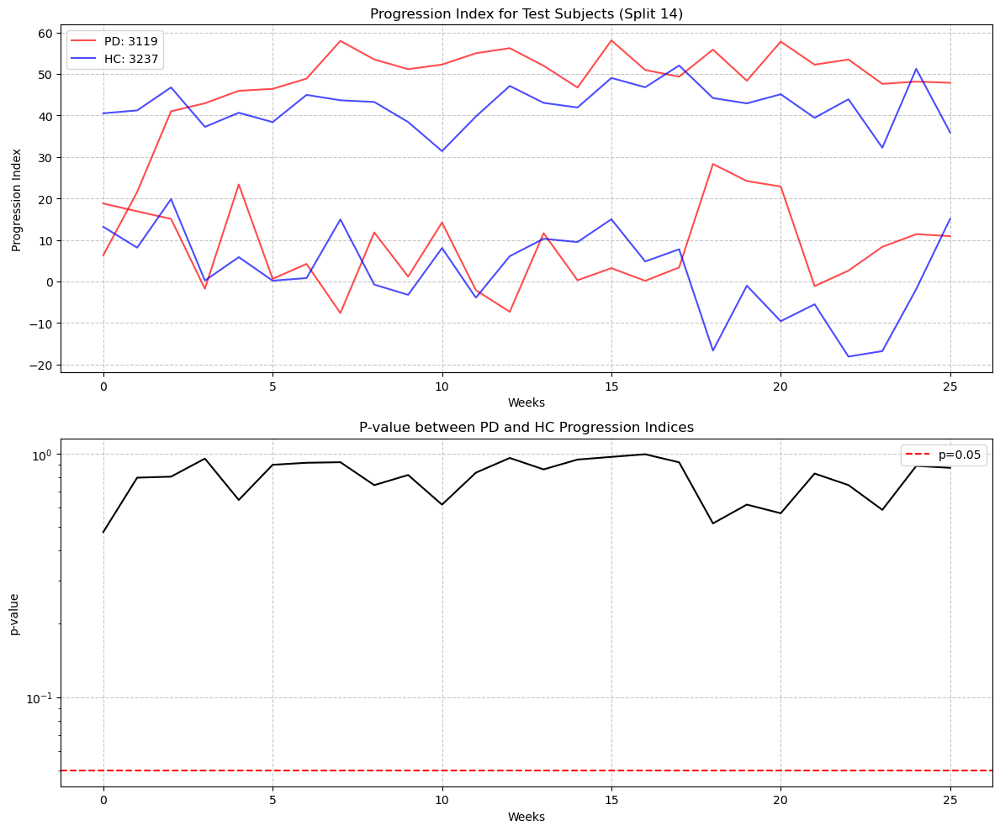


Outer loop 15/20
Training until convergence...
Epoch [100/20000], Loss: -1563.8265
Epoch [200/20000], Loss: -7900.6479
Epoch [300/20000], Loss: -8340.7109
Epoch [400/20000], Loss: -9638.3506
Epoch [500/20000], Loss: -9271.7842
Epoch [600/20000], Loss: -10462.7793
Epoch [700/20000], Loss: -10947.0225
Epoch [800/20000], Loss: -12025.7080
Epoch [900/20000], Loss: -12933.2822
Epoch [1000/20000], Loss: -11242.9463
Epoch [1100/20000], Loss: -12890.0137
Epoch [1200/20000], Loss: -14249.4912
Epoch [1300/20000], Loss: -14131.2002
Epoch [1400/20000], Loss: -15169.0127
Epoch [1500/20000], Loss: -12633.3926
Epoch [1600/20000], Loss: -13469.7197
Epoch [1700/20000], Loss: -12092.7725
Epoch [1800/20000], Loss: -12819.2148
Epoch [1900/20000], Loss: -13887.8164
Epoch [2000/20000], Loss: -12968.5459
Epoch [2100/20000], Loss: -13399.6436
Epoch [2200/20000], Loss: -13712.2119
Epoch [2300/20000], Loss: -13483.9395
Epoch [2400/20000], Loss: -15677.0420
Epoch [2500/20000], Loss: -14753.7139
Epoch [2600/2000

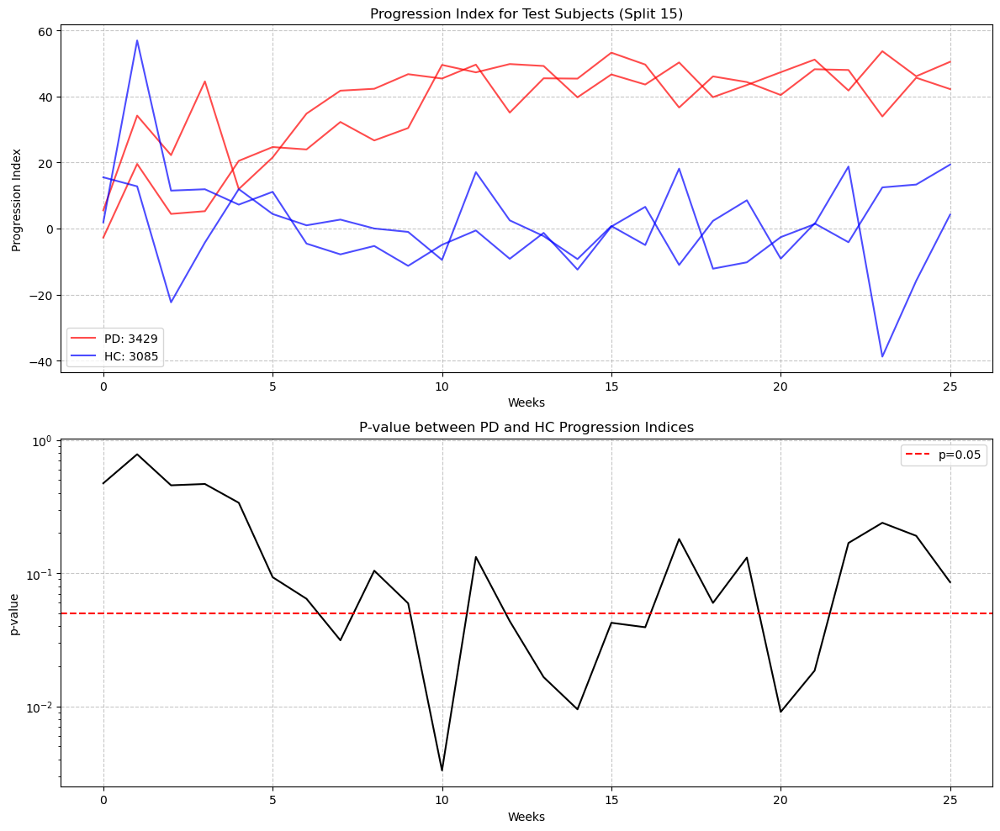


Outer loop 16/20
Training until convergence...
Epoch [100/20000], Loss: -4171.3096
Epoch [200/20000], Loss: -5712.6250
Epoch [300/20000], Loss: -9824.5518
Epoch [400/20000], Loss: -8841.6357
Epoch [500/20000], Loss: -12485.0410
Epoch [600/20000], Loss: -9564.0850
Epoch [700/20000], Loss: -11493.6602
Epoch [800/20000], Loss: -11491.8115
Epoch [900/20000], Loss: -12505.6191
Epoch [1000/20000], Loss: -12493.1719
Epoch [1100/20000], Loss: -13521.3252
Epoch [1200/20000], Loss: -12269.6807
Epoch [1300/20000], Loss: -14126.7988
Epoch [1400/20000], Loss: -13075.4453
Epoch [1500/20000], Loss: -12395.6367
Epoch [1600/20000], Loss: -13301.7080
Epoch [1700/20000], Loss: -14754.0234
Epoch [1800/20000], Loss: -13200.1445
Epoch [1900/20000], Loss: -15097.8613
Epoch [2000/20000], Loss: -13735.7959
Epoch [2100/20000], Loss: -12379.4736
Epoch [2200/20000], Loss: -13613.9492
Epoch [2300/20000], Loss: -14869.5312
Epoch [2400/20000], Loss: -17492.7871
Epoch [2500/20000], Loss: -16442.9043
Epoch [2600/2000

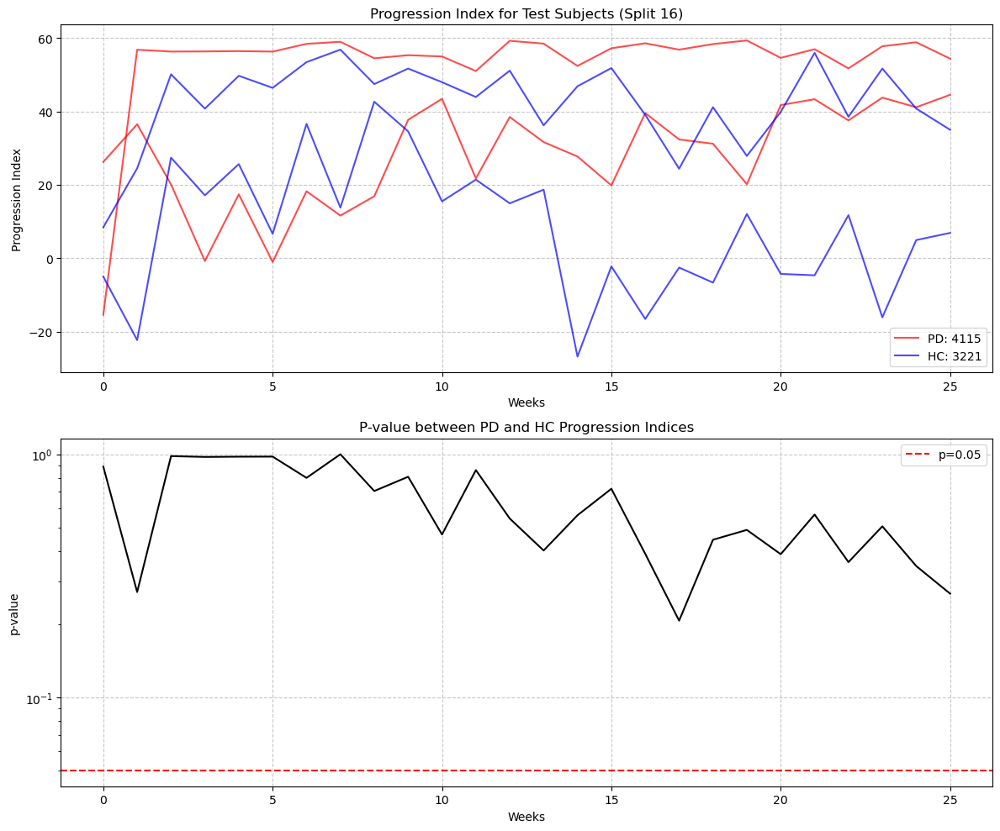


Outer loop 17/20
Training until convergence...
Epoch [100/20000], Loss: -1057.5850
Epoch [200/20000], Loss: -6978.5977
Epoch [300/20000], Loss: -8347.6006
Epoch [400/20000], Loss: -10024.3184
Epoch [500/20000], Loss: -11706.5020
Epoch [600/20000], Loss: -11585.7920
Epoch [700/20000], Loss: -12951.5928
Epoch [800/20000], Loss: -12924.0010
Epoch [900/20000], Loss: -11232.2275
Epoch [1000/20000], Loss: -12244.6523
Epoch [1100/20000], Loss: -13502.8398
Epoch [1200/20000], Loss: -13083.5703
Epoch [1300/20000], Loss: -14072.8799
Epoch [1400/20000], Loss: -14312.1973
Epoch [1500/20000], Loss: -15607.2832
Epoch [1600/20000], Loss: -15380.2031
Epoch [1700/20000], Loss: -14303.0850
Epoch [1800/20000], Loss: -14959.9150
Epoch [1900/20000], Loss: -15990.2334
Epoch [2000/20000], Loss: -14101.5586
Epoch [2100/20000], Loss: -15974.9473
Epoch [2200/20000], Loss: -14447.3867
Epoch [2300/20000], Loss: -15863.1553
Epoch [2400/20000], Loss: -15850.7949
Epoch [2500/20000], Loss: -14104.4121
Epoch [2600/20

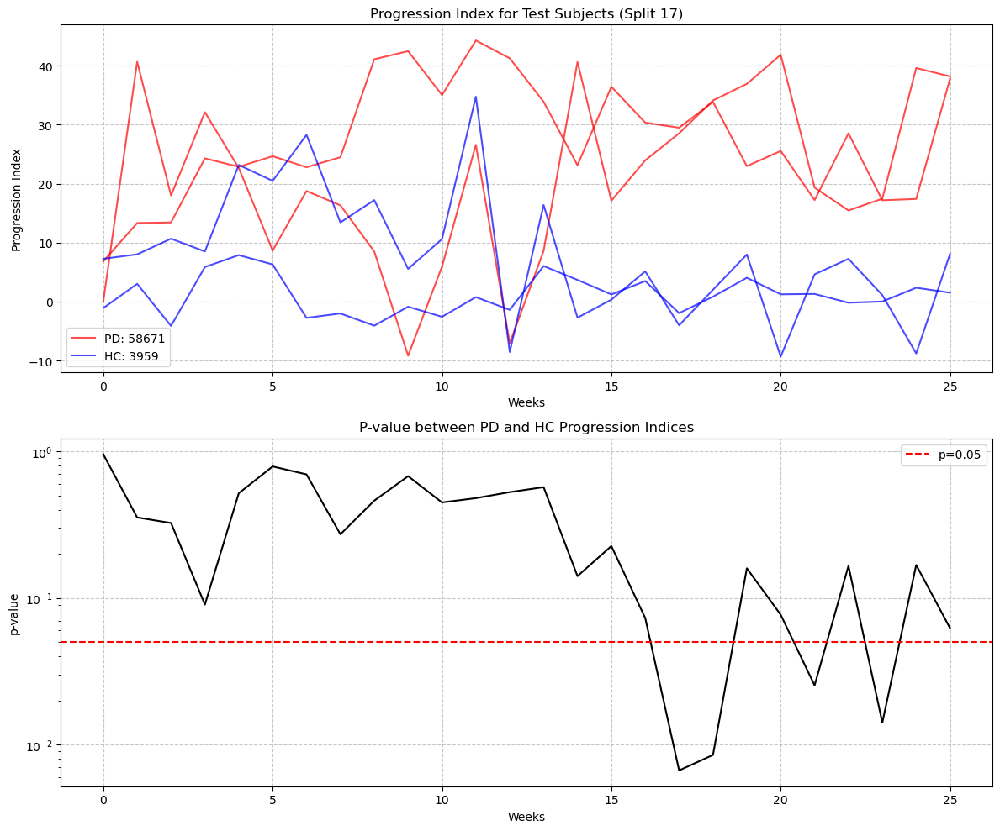


Outer loop 18/20
Training until convergence...
Epoch [100/20000], Loss: -2431.5720
Epoch [200/20000], Loss: -9809.0732
Epoch [300/20000], Loss: -8075.4355
Epoch [400/20000], Loss: -9985.2412
Epoch [500/20000], Loss: -9982.4189
Epoch [600/20000], Loss: -11340.6494
Epoch [700/20000], Loss: -11928.8838
Epoch [800/20000], Loss: -10809.1748
Epoch [900/20000], Loss: -14177.6455
Epoch [1000/20000], Loss: -13152.0967
Epoch [1100/20000], Loss: -13861.9785
Epoch [1200/20000], Loss: -14541.6514
Epoch [1300/20000], Loss: -15955.5332
Epoch [1400/20000], Loss: -13272.5137
Epoch [1500/20000], Loss: -12124.0215
Epoch [1600/20000], Loss: -12375.6787
Epoch [1700/20000], Loss: -15184.5918
Epoch [1800/20000], Loss: -13518.3164
Epoch [1900/20000], Loss: -12191.8838
Epoch [2000/20000], Loss: -13813.9062
Epoch [2100/20000], Loss: -14547.0361
Epoch [2200/20000], Loss: -15259.2539
Epoch [2300/20000], Loss: -14679.7090
Epoch [2400/20000], Loss: -13499.3320
Epoch [2500/20000], Loss: -13117.6445
Epoch [2600/2000

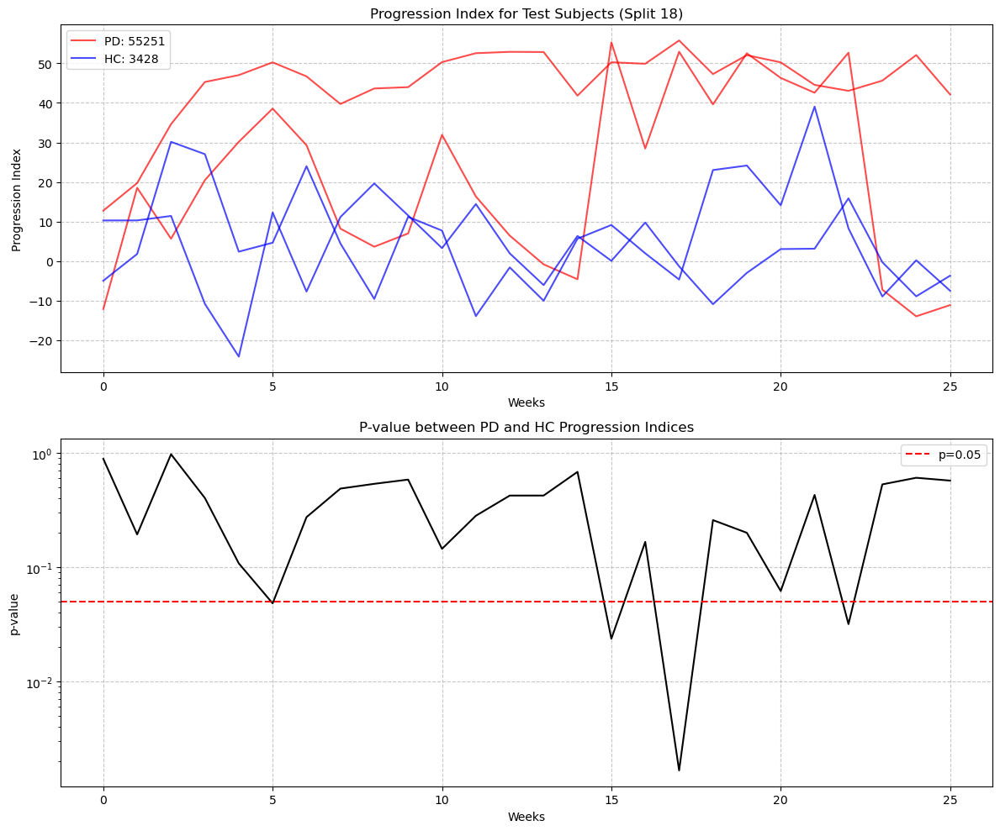


Outer loop 19/20
Training until convergence...
Epoch [100/20000], Loss: -3985.2031
Converged at epoch 151 with loss -6115.5950
Final loss: -3250.9338
Training complete


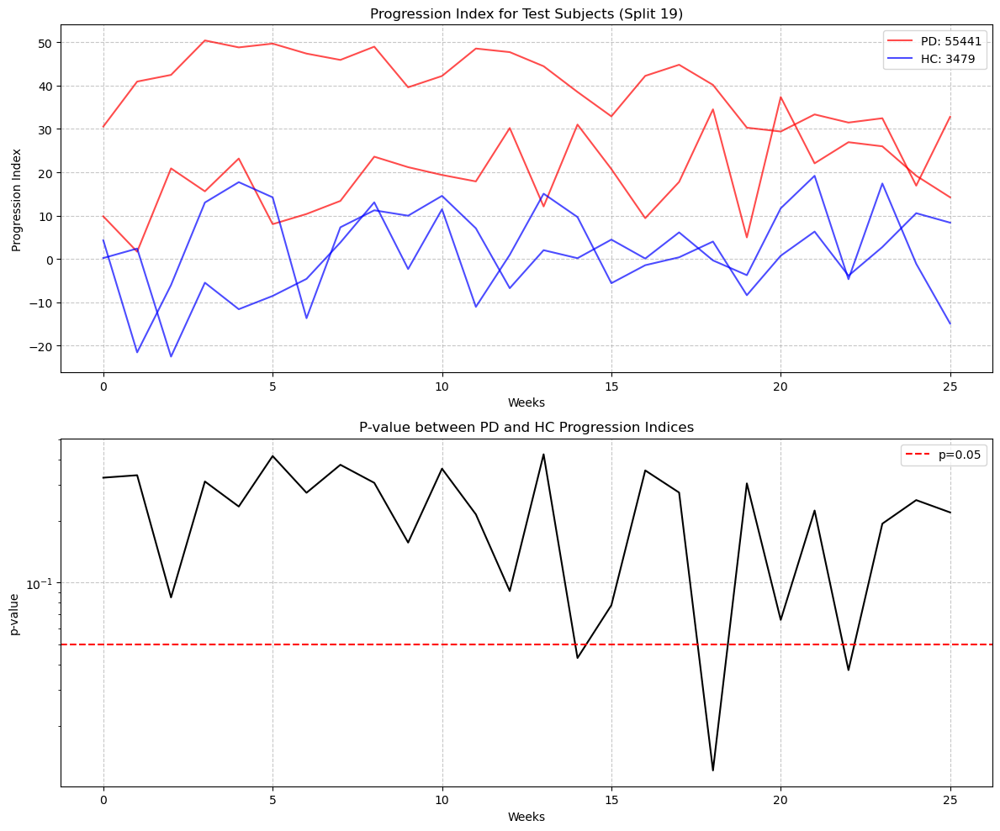


Outer loop 20/20
Training until convergence...
Epoch [100/20000], Loss: -1922.3418
Epoch [200/20000], Loss: -9819.7695
Epoch [300/20000], Loss: -10394.2285
Converged at epoch 371 with loss -10293.9303
Final loss: -10448.6250
Training complete


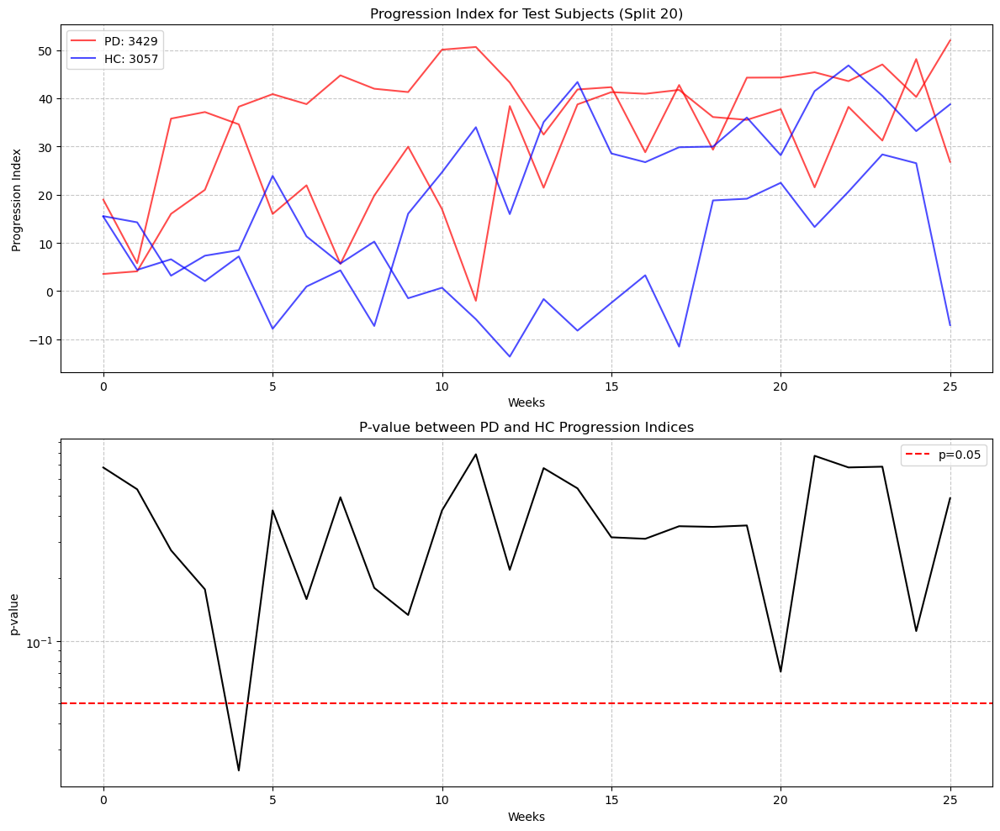


Statistically Significant Windows (p < 0.05):


In [773]:
sequences1, labels1, time_points1, subject_ids1 = prepare_data(data_new4)
X2, lengths2, y2, time_weights2 = create_dataloader(sequences1, labels1, time_points1)
input_size = 7
hidden_size = 20
output_size = 7
num_layers = 2
model2 = LSTMModel(input_size, hidden_size, output_size, num_layers)
set_seed(1)
results2 = test_model_progression_index(
    LSTMModel, sequences1, labels1, time_points1, subject_ids1, num_outer_loops=20)

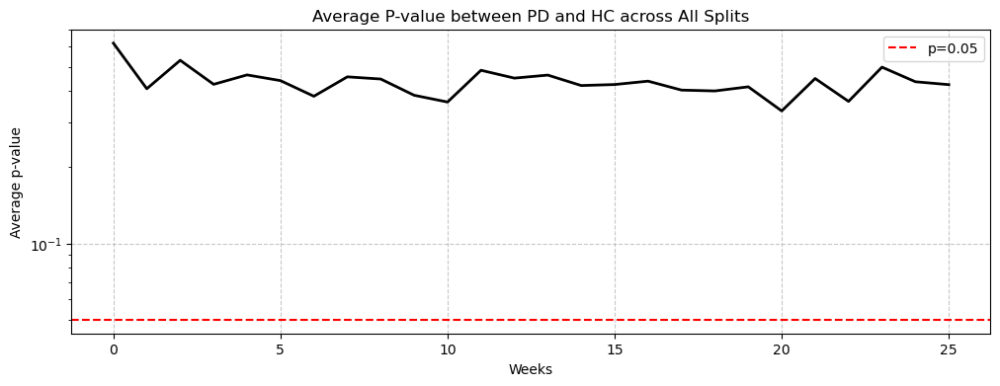

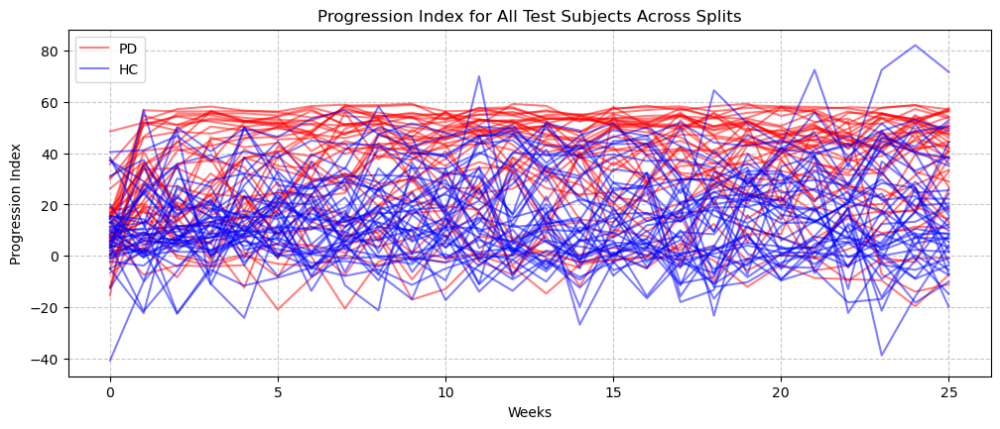

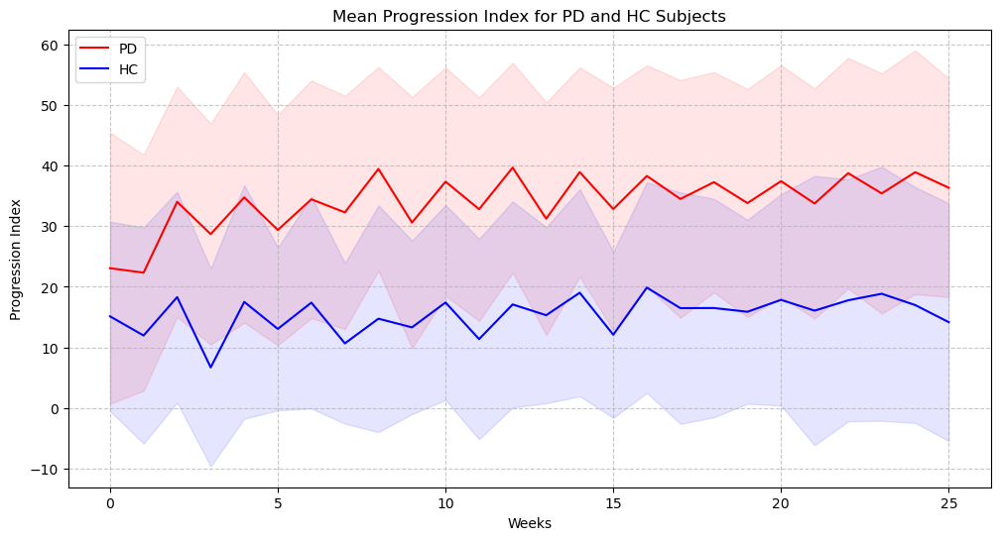

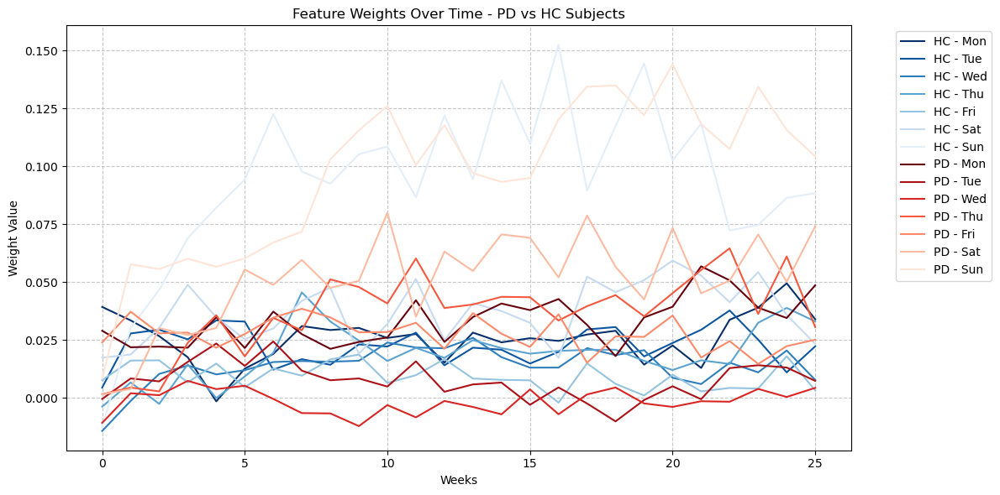

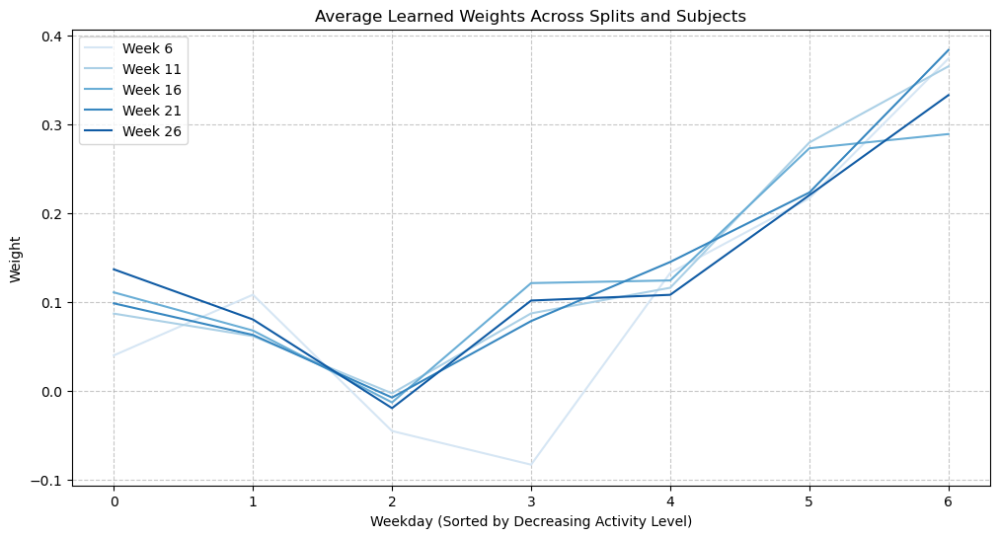

In [774]:
# plot for p-values  
# plot for all individual test outputs 
# plot for mean outputs 
# plot for feature weights over time 
# plot for average learned weights across splits and subjects

all_pd_outputs2 = results2['pd_outputs']
all_hc_outputs2 = results2['hc_outputs']
all_weights2 = results2['weights']
all_pvalues2 = results2['pvalues']
all_avg_pvalues2 = results2['avg_pvalues']
all_sig_windows2 = results2['sig_windows']

# plot for p-values
plt.figure(figsize=(12, 4))
plt.plot(all_avg_pvalues2, 'k-', linewidth=2)
plt.axhline(y=0.05, color='r', linestyle='--', label='p=0.05')
plt.xlabel('Weeks')
plt.ylabel('Average p-value')
plt.title('Average P-value between PD and HC across All Splits')
plt.yscale('log')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# plot for all individual test outputs
plt.figure(figsize=(12, 10))
plt.subplot(2, 1, 1)
if len(all_pd_outputs2) > 0 and all_pd_outputs2[0].shape[1] > 0:
    plt.plot(all_pd_outputs2[0][:, 0], 'r-', alpha=0.5, label='PD')
if len(all_hc_outputs2) > 0 and all_hc_outputs2[0].shape[1] > 0:
    plt.plot(all_hc_outputs2[0][:, 0], 'b-', alpha=0.5, label='HC')
# Then plot the rest without labels
for i in range(len(all_pd_outputs2)):
    for j in range(all_pd_outputs2[i].shape[1]):
        # Skip the first one we already plotted with a label
        if i == 0 and j == 0:
            continue
        plt.plot(all_pd_outputs2[i][:, j], 'r-', alpha=0.5)

for i in range(len(all_hc_outputs2)):
    for j in range(all_hc_outputs2[i].shape[1]):
        # Skip the first one we already plotted with a label
        if i == 0 and j == 0:
            continue
        plt.plot(all_hc_outputs2[i][:, j], 'b-', alpha=0.5)

# Explicitly create the legend with labels
plt.legend()
plt.xlabel('Weeks')
plt.ylabel('Progression Index')
plt.title('Progression Index for All Test Subjects Across Splits')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# plot for mean outputs
pd_outputs_flat2 = np.array(all_pd_outputs2).reshape(-1, all_pd_outputs2[0].shape[0]).T  # Shape: (num_timepoints, num_splits*num_subjects)
hc_outputs_flat2 = np.array(all_hc_outputs2).reshape(-1, all_hc_outputs2[0].shape[0]).T  # Shape: (num_timepoints, num_splits*num_subjects)

mean_pd_outputs2 = np.mean(pd_outputs_flat2, axis=1)
mean_hc_outputs2 = np.mean(hc_outputs_flat2, axis=1)
std_pd_outputs2 = np.std(pd_outputs_flat2, axis=1)
std_hc_outputs2 = np.std(hc_outputs_flat2, axis=1)
plt.figure(figsize=(12, 6))
plt.plot(mean_pd_outputs2, color='red', label='PD')
plt.fill_between(range(len(mean_pd_outputs2)), 
                 mean_pd_outputs2 - std_pd_outputs2, 
                 mean_pd_outputs2 + std_pd_outputs2, 
                 color='red', alpha=0.1)
plt.plot(mean_hc_outputs2, color='blue', label='HC')
plt.fill_between(range(len(mean_hc_outputs2)), 
                 mean_hc_outputs2 - std_hc_outputs2, 
                 mean_hc_outputs2 + std_hc_outputs2, 
                 color='blue', alpha=0.1)
plt.xlabel('Weeks')
plt.ylabel('Progression Index')
plt.title('Mean Progression Index for PD and HC Subjects')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# plot for feature weights over time
avg_weights2 = np.mean([w for w in all_weights2], axis=0)
# now the features are the actual weekdays Monday to Sunday
features = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
plt.figure(figsize=(12, 6))
colors = plt.cm.Blues(np.linspace(1, 0.1, 7))  # Different blue shades
for i in range(7):
    plt.plot(avg_weights2[:, 0, i], label=f'HC - {features[i]}', color=colors[i])
colors = plt.cm.Reds(np.linspace(1, 0.1, 7))  # Different red shades
for i in range(7):  
    plt.plot(avg_weights2[:, 1, i], label=f'PD - {features[i]}', color=colors[i])
plt.xlabel('Weeks')
plt.ylabel('Weight Value')
plt.title('Feature Weights Over Time - PD vs HC Subjects')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# plot for average learned weights across splits and subjects
mean_weights2 = np.mean(all_weights2, axis=(0, 2))  # Now shape is (num_weeks, num_features)
plt.figure(figsize=(12, 6))
# Choose specific weeks to display (from week 5 to 30, in increments of 5)
for i in range(5, 30, 5):
    # Check if we have enough time points
    if i < mean_weights2.shape[0]:
        # Extract weights for week i
        tmp = mean_weights2[i, :]
        # Normalize weights to sum to 1
        tmp = tmp / np.sum(np.abs(tmp))  # Using abs to handle potential negative weights
        # Plot with a color gradient based on the week number
        plt.plot(tmp, color=plt.cm.Blues(i / 30), label=f'Week {i+1}')
plt.xlabel('Weekday (Sorted by Decreasing Activity Level)')
plt.ylabel('Weight')
plt.title('Average Learned Weights Across Splits and Subjects')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()
